### Import Packages

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import re
import pickle
import mne
import seaborn as sns
import pandas as pd
from scipy.stats import wilcoxon, ttest_rel, mannwhitneyu, levene, kstest, shapiro, ttest_ind, mannwhitneyu, friedmanchisquare
from statsmodels.stats.anova import AnovaRM
from scipy.signal import butter, filtfilt, sosfiltfilt
from conn_utils import *
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix


### Load Processed Data

In [2]:
input_file = '../data/ica_data/HC_processed_data.pkl'

with open(input_file, 'rb') as f:
    processed_data = pickle.load(f)

print(f'processed_data has been loaded from {input_file}')

processed_data has been loaded from ../data/ica_data/HC_processed_data.pkl


In [3]:
input_file = '../data/ica_data/BD5_processed_data.pkl'

with open(input_file, 'rb') as f:
    processed_data_5 = pickle.load(f)

print(f'processed_data has been loaded from {input_file}')

processed_data has been loaded from ../data/ica_data/BD5_processed_data.pkl


In [4]:
processed_data = processed_data | processed_data_5

In [3]:
print('Total file numbers: ', len(processed_data.keys()))
for (subject_id, file_name), subject_data in processed_data.items():
    print(f"Subject {subject_id} with file {file_name}: {subject_data.shape}")

Total file numbers:  425
Subject E-0006 with file CGMHKL_E-0006_1_Filter.csv: (29, 46000)
Subject E-0006 with file CGMHKL_E-0006_2_Filter.csv: (29, 46000)
Subject E-0006 with file CGMHKL_E-0006_3_Filter.csv: (29, 46000)
Subject E-0006 with file CGMHKL_E-0006_4_Filter.csv: (29, 46000)
Subject E-0006 with file CGMHKL_E-0006_5_Filter.csv: (29, 46000)
Subject E-0006 with file CGMHKL_E-0006_6_Filter.csv: (29, 46000)
Subject E-0007 with file CGMHKL_E-0007_1_Filter.csv: (29, 46000)
Subject E-0007 with file CGMHKL_E-0007_2_Filter.csv: (29, 46000)
Subject E-0007 with file CGMHKL_E-0007_3_Filter.csv: (29, 46000)
Subject E-0007 with file CGMHKL_E-0007_4_Filter.csv: (29, 46000)
Subject E-0007 with file CGMHKL_E-0007_5_Filter.csv: (29, 46000)
Subject E-0007 with file CGMHKL_E-0007_6_Filter.csv: (29, 46000)
Subject E-0008 with file CGMHKL_E-0008_1_Filter.csv: (29, 46000)
Subject E-0008 with file CGMHKL_E-0008_2_Filter.csv: (29, 46000)
Subject E-0008 with file CGMHKL_E-0008_3_Filter.csv: (29, 46000)


### BD revised

In [6]:
preprocessed_data = processed_data.copy()
for (subject_id, file_name), subject_data in list(preprocessed_data.items()):

    if (subject_id, file_name) == ('20230522', 'HNC_EE046_1_Filter.csv'):
        preprocessed_data[('EEG046', 'HNC_EEG046_1_Filter.csv')] = subject_data
        del preprocessed_data[(subject_id, file_name)]
    if (subject_id, file_name) == ('20230522', 'HNC_EE046_2_Filter.csv'):
        preprocessed_data[('EEG046', 'HNC_EEG046_2_Filter.csv')] = subject_data
        del preprocessed_data[(subject_id, file_name)]
    if (subject_id, file_name) == ('20230522', 'HNC_EE046_3_Filter.csv'):
        preprocessed_data[('EEG046', 'HNC_EEG046_3_Filter.csv')] = subject_data
        del preprocessed_data[(subject_id, file_name)]
    if (subject_id, file_name) == ('EEG046', 'HNC_EE046_4_Filter.csv'):
        preprocessed_data[('EEG046', 'HNC_EEG046_4_Filter.csv')] = subject_data
        del preprocessed_data[(subject_id, file_name)]
    if (subject_id, file_name) == ('EEG046', 'HNC_EE046_5_Filter.csv'):
        preprocessed_data[('EEG046', 'HNC_EEG046_5_Filter.csv')] = subject_data
        del preprocessed_data[(subject_id, file_name)]
    if (subject_id, file_name) == ('EEG046', 'HNC_EE046_6_Filter.csv'):
        preprocessed_data[('EEG046', 'HNC_EEG046_6_Filter.csv')] = subject_data
        del preprocessed_data[(subject_id, file_name)]


    if (subject_id, file_name) == ('EEG23-004(W0)', 'HNC_EEG23-004_閉眼補做_1_Filter.csv'):
        preprocessed_data[('EEG23-004(W0)', 'HNC_EEG23-004_4_Filter.csv')] = subject_data
        del preprocessed_data[(subject_id, file_name)]
    if (subject_id, file_name) == ('EEG23-004(W0)', 'HNC_EEG23-004_閉眼補做_2_Filter.csv'):
        preprocessed_data[('EEG23-004(W0)', 'HNC_EEG23-004_5_Filter.csv')] = subject_data
        del preprocessed_data[(subject_id, file_name)]
    if (subject_id, file_name) == ('EEG23-004(W0)', 'HNC_EEG23-004_閉眼補做_3_Filter.csv'):
        preprocessed_data[('EEG23-004(W0)', 'HNC_EEG23-004_6_Filter.csv')] = subject_data
        del preprocessed_data[(subject_id, file_name)]

    if (subject_id, file_name) == ('EEG23-017(W0)', 'HNC_EEG23-017_重做睜眼_1_Filter.csv'):
        preprocessed_data[('EEG23-017(W0)', 'HNC_EEG23-017_1_Filter.csv')] = subject_data
        del preprocessed_data[(subject_id, file_name)]
    if (subject_id, file_name) == ('EEG23-017(W0)', 'HNC_EEG23-017_重做睜眼_2_Filter.csv'):
        preprocessed_data[('EEG23-017(W0)', 'HNC_EEG23-017_2_Filter.csv')] = subject_data
        del preprocessed_data[(subject_id, file_name)]
    if (subject_id, file_name) == ('EEG23-017(W0)', 'HNC_EEG23-017_重做睜眼_3_Filter.csv'):
        preprocessed_data[('EEG23-017(W0)', 'HNC_EEG23-017_3_Filter.csv')] = subject_data
        del preprocessed_data[(subject_id, file_name)]

 

### HC revised EEG23-CC011(W0) -1

In [4]:
preprocessed_data = processed_data.copy()
for (subject_id, file_name), subject_data in list(preprocessed_data.items()):

    if (subject_id, file_name) == ('EEG23-CC028(W0)', 'HNC_EEG23-CC028_Filter.csv'):
        preprocessed_data[('EEG23-CC028(W0)', 'HNC_EEG23-CC028_4_Filter.csv')] = subject_data
        del preprocessed_data[(subject_id, file_name)]


### MDD

In [4]:
preprocessed_data = processed_data.copy()

### Files check

In [5]:
print('Total file numbers: ', len(preprocessed_data.keys()))
for (subject_id, file_name), subject_data in preprocessed_data.items():
    print(f"Subject {subject_id} with file {file_name}: {subject_data.shape}")

Total file numbers:  425
Subject E-0006 with file CGMHKL_E-0006_1_Filter.csv: (29, 46000)
Subject E-0006 with file CGMHKL_E-0006_2_Filter.csv: (29, 46000)
Subject E-0006 with file CGMHKL_E-0006_3_Filter.csv: (29, 46000)
Subject E-0006 with file CGMHKL_E-0006_4_Filter.csv: (29, 46000)
Subject E-0006 with file CGMHKL_E-0006_5_Filter.csv: (29, 46000)
Subject E-0006 with file CGMHKL_E-0006_6_Filter.csv: (29, 46000)
Subject E-0007 with file CGMHKL_E-0007_1_Filter.csv: (29, 46000)
Subject E-0007 with file CGMHKL_E-0007_2_Filter.csv: (29, 46000)
Subject E-0007 with file CGMHKL_E-0007_3_Filter.csv: (29, 46000)
Subject E-0007 with file CGMHKL_E-0007_4_Filter.csv: (29, 46000)
Subject E-0007 with file CGMHKL_E-0007_5_Filter.csv: (29, 46000)
Subject E-0007 with file CGMHKL_E-0007_6_Filter.csv: (29, 46000)
Subject E-0008 with file CGMHKL_E-0008_1_Filter.csv: (29, 46000)
Subject E-0008 with file CGMHKL_E-0008_2_Filter.csv: (29, 46000)
Subject E-0008 with file CGMHKL_E-0008_3_Filter.csv: (29, 46000)


### Rename Data

In [6]:
def find_diff_str(filenames):
    """
    Input a list of filenames
    """
    base_name = filenames[0]
    unique_parts = {}


    for i, name in enumerate(filenames):
        diff = []
        for j in range(len(name)):
            if all(name[j] != other_name[j] for other_name in filenames if other_name != name):
                diff.append(name[j])


        unique_diff = ''.join(diff).replace('_', '')  
        unique_parts[name] = unique_diff

    return unique_parts

def relabel_eeg_data(eeg_data):

    grouped_files = {}
    
    for (subject_id, file_name), data in eeg_data.items():
        if subject_id not in grouped_files:
            grouped_files[subject_id] = []
        grouped_files[subject_id].append(file_name)

    new_eeg_data = {}

    for subject_id, filenames in grouped_files.items():
        if len(filenames) < 2:
            print(f"Subject {subject_id} has less than 2 files, skipping.")
            continue

        diff_mapping = find_diff_str(filenames)

        for old_name in filenames:
            new_name = f"{diff_mapping[old_name]}"
            new_eeg_data[(subject_id, new_name)] = eeg_data[(subject_id, old_name)]

    return new_eeg_data

In [7]:
processed_data_renamed = relabel_eeg_data(preprocessed_data)
print('Total file numbers: ', len(processed_data_renamed.keys()))
for (subject_id, file_name), subject_data in processed_data_renamed.items():
    print(f"Subject {subject_id} with file {file_name}: {subject_data.shape}")

Total file numbers:  425
Subject E-0006 with file 1: (29, 46000)
Subject E-0006 with file 2: (29, 46000)
Subject E-0006 with file 3: (29, 46000)
Subject E-0006 with file 4: (29, 46000)
Subject E-0006 with file 5: (29, 46000)
Subject E-0006 with file 6: (29, 46000)
Subject E-0007 with file 1: (29, 46000)
Subject E-0007 with file 2: (29, 46000)
Subject E-0007 with file 3: (29, 46000)
Subject E-0007 with file 4: (29, 46000)
Subject E-0007 with file 5: (29, 46000)
Subject E-0007 with file 6: (29, 46000)
Subject E-0008 with file 1: (29, 46000)
Subject E-0008 with file 2: (29, 46000)
Subject E-0008 with file 3: (29, 46000)
Subject E-0008 with file 4: (29, 46000)
Subject E-0008 with file 5: (29, 46000)
Subject E-0008 with file 6: (29, 46000)
Subject E-0015 with file 1: (29, 46000)
Subject E-0015 with file 2: (29, 46000)
Subject E-0015 with file 3: (29, 46000)
Subject E-0015 with file 4: (29, 46000)
Subject E-0015 with file 5: (29, 46000)
Subject E-0015 with file 6: (29, 46000)
Subject E-0023 

### Construct eye-opened & eye-closed data

In [8]:
eye_open_data = {}
eye_close_data = {}


for (subject_id, file_name), data in processed_data_renamed.items():

    if int(file_name) <= 3:
        if subject_id not in eye_open_data:
            eye_open_data[subject_id] = data
        else:
            eye_open_data[subject_id] = np.hstack((eye_open_data[subject_id], data))
    else:
        if subject_id not in eye_close_data:
            eye_close_data[subject_id] = data
        else:
            eye_close_data[subject_id] = np.hstack((eye_close_data[subject_id], data))


In [9]:
for subject_id, data in eye_open_data.items():
    print(f"Subject {subject_id} eye open data shape: {data.shape}")

print('===============================================================================================')
print('===============================================================================================')

for subject_id, data in eye_close_data.items():   
    print(f"Subject {subject_id} eye close data shape: {data.shape}")


Subject E-0006 eye open data shape: (29, 138000)
Subject E-0007 eye open data shape: (29, 138000)
Subject E-0008 eye open data shape: (29, 138000)
Subject E-0015 eye open data shape: (29, 138000)
Subject E-0023 eye open data shape: (29, 138000)
Subject E-0052 eye open data shape: (29, 138000)
Subject E-0053 eye open data shape: (29, 138000)
Subject E-0055 eye open data shape: (29, 138000)
Subject E-0062 eye open data shape: (29, 138000)
Subject E-0066 eye open data shape: (29, 138000)
Subject E-0068 eye open data shape: (29, 138000)
Subject E-0079 eye open data shape: (29, 138000)
Subject E-0080 eye open data shape: (29, 138000)
Subject E-0084 eye open data shape: (29, 138000)
Subject E-0110 eye open data shape: (29, 138000)
Subject E-0112 eye open data shape: (29, 138000)
Subject E-0113 eye open data shape: (29, 138000)
Subject E-0114 eye open data shape: (29, 138000)
Subject E-0115 eye open data shape: (29, 138000)
Subject E-0116 eye open data shape: (29, 138000)
Subject E-0121 eye o

### Cutting epochs

In [10]:
def segment_data(eeg_data, epoch_length=2500, overlap=500, num_epochs=40):
    segmented_data = {}

    for subject, data in eeg_data.items():
        all_epochs = []
        num_channels, num_timepoints = data.shape
        start = 0
        while start + epoch_length <= num_timepoints:
            epoch = data[:, start:start + epoch_length]
            all_epochs.append(epoch)
            start += epoch_length - overlap

        
        if len(all_epochs) < num_epochs:
            print(f"Warning: Subject {subject} has fewer epochs ({len(all_epochs)}) than the required number ({num_epochs}).")
            num_epochs = len(all_epochs)  # Update to use all available epochs

        np.random.shuffle(all_epochs)
        segmented_data[subject] = all_epochs[:num_epochs]

    return segmented_data


eye_open_data_segmented = segment_data(eye_open_data)
for subject, data in eye_open_data_segmented.items():
    print(f"Subject {subject} has {len(data)} epochs")
    print(f"Each epoch has shape {data[0].shape}")

Subject E-0006 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0007 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0008 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0015 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0023 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0052 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0053 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0055 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0062 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0066 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0068 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0079 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0080 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0084 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0110 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0112 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0113 has 40 ep

### Cutting epochs with data augmentation

In [11]:
def segment_data_with_rejection(eeg_data, epoch_length=2500, overlap=500, num_epochs_to_select=10, num_trials=30, rejection_threshold=0.1):
    segmented_data = {}

    for subject, data in eeg_data.items():
        num_channels, num_timepoints = data.shape
        all_epochs = []
        start = 0
        
        # Segment the data into epochs
        while start + epoch_length <= num_timepoints:
            epoch = data[:, start:start + epoch_length]
            
            # Check if the epoch passes the rejection threshold
            # if np.any(np.abs(epoch) > rejection_threshold):
            #     start += epoch_length - overlap  # Move the window forward
            #     continue  # Reject this epoch and continue

            all_epochs.append(epoch)
            start += epoch_length - overlap

        # Warn if fewer than 30 epochs are available after rejection
        if len(all_epochs) < 30:
            print(f"Warning: Subject {subject} has fewer than 30 valid epochs ({len(all_epochs)}).")
            num_epochs_available = len(all_epochs)
        else:
            num_epochs_available = 30


        all_epochs = np.array(all_epochs) 
        np.random.shuffle(all_epochs)  # Shuffle all available epochs


        subject_trials = []
        for _ in range(num_trials):
            # Select 10 random indices without replacement
            random_indices = np.random.choice(np.arange(num_epochs_available), size=num_epochs_to_select, replace=False)
            selected_epochs = all_epochs[random_indices]  # Select epochs by these indices
            subject_trials.append(selected_epochs)

        segmented_data[subject] = subject_trials

    return segmented_data


eye_open_data_segmented = segment_data_with_rejection(eye_open_data)
for subject, data in eye_open_data_segmented.items():
    print(f"Subject {subject} has {len(data)} trials")
    print(f"Each trial has {len(data[0])} epochs, and each epoch has shape {data[0][0].shape}")


Subject EEG23-002(W0) has 30 trials
Each trial has 10 epochs, and each epoch has shape (29, 2500)
Subject EEG23-003(W0) has 30 trials
Each trial has 10 epochs, and each epoch has shape (29, 2500)
Subject EEG23-004(W0) has 30 trials
Each trial has 10 epochs, and each epoch has shape (29, 2500)
Subject EEG23-005(W0) has 30 trials
Each trial has 10 epochs, and each epoch has shape (29, 2500)
Subject EEG23-006(W0) has 30 trials
Each trial has 10 epochs, and each epoch has shape (29, 2500)
Subject EEG23-008(W0) has 30 trials
Each trial has 10 epochs, and each epoch has shape (29, 2500)
Subject EEG23-009(W0) has 30 trials
Each trial has 10 epochs, and each epoch has shape (29, 2500)
Subject EEG23-010(W0) has 30 trials
Each trial has 10 epochs, and each epoch has shape (29, 2500)
Subject EEG23-011(W0) has 30 trials
Each trial has 10 epochs, and each epoch has shape (29, 2500)
Subject EEG23-012(W0) has 30 trials
Each trial has 10 epochs, and each epoch has shape (29, 2500)
Subject EEG23-014(W0

### BP Functions

In [ ]:
sample_rate = 500

delta_range = [1, 4]
theta_range = [4, 8]
alpha_range = [8, 13]
betalow_range = [13, 20]
betahigh_range = [20, 30]
gamma_range = [30, 45]

def PSD(data):
    psd_data = []
    for channel in data:
        fft_data = np.fft.fft(channel)
        power = np.abs(fft_data) ** 2
        psd_data.append(power)
    return psd_data

def BP(data, sample_time, delta_range, theta_range, alpha_range, betalow_range, betahigh_range, gamma_range, type='log'):
    bp_data = {}
    for channel in range(len(data)):
        bp = {}
        delta_result, theta_result ,alpha_result, beta_result, gamma_result = 0, 0, 0, 0, 0
        for k in range(delta_range[0] * sample_time, delta_range[1] * sample_time):
            delta_result += data[channel][k]
        for k in range(theta_range[0] * sample_time, theta_range[1] * sample_time):
            theta_result += data[channel][k]
        for k in range(alpha_range[0] * sample_time, alpha_range[1] * sample_time):
            alpha_result += data[channel][k]
        for k in range(betalow_range[0] * sample_time, betalow_range[1] * sample_time):
            betalow_result += data[channel][k]
        for k in range(betahigh_range[0] * sample_time, betahigh_range[1] * sample_time):
            betahigh_result += data[channel][k]
        for k in range(gamma_range[0] * sample_time, gamma_range[1] * sample_time):
            gamma_result += data[channel][k]


        if type == 'original':
            bp['delta'] = delta_result
            bp['theta'] = theta_result
            bp['alpha'] = alpha_result
            bp['betalow'] = betalow_result
            bp['betahigh'] = betahigh_result
            bp['gamma'] = gamma_result
        elif type == 'log10':
            bp['delta'] = np.log10(delta_result)
            bp['theta'] = np.log10(theta_result)
            bp['alpha'] = np.log10(alpha_result)
            bp['betalow'] = np.log10(betalow_result)
            bp['betahigh'] = np.log10(betahigh_result)
            bp['gamma'] = np.log10(gamma_result)
        elif type == 'log':
            bp['delta'] = np.log(delta_result)
            bp['theta'] = np.log(theta_result)
            bp['alpha'] = np.log(alpha_result)
            bp['betalow'] = np.log(betalow_result)
            bp['betahigh'] = np.log(betahigh_result)
            bp['gamma'] = np.log(gamma_result)

        bp_data[channel + 1] = bp

        
    return bp_data


### BP without cutting epochs

In [ ]:
bp_result = {}

for subject_id, data in eye_open_data.items():
    psd_data = PSD(data)
    sample_time = data.shape[1] // sample_rate
    bp_data = BP(psd_data, sample_time, delta_range, theta_range, alpha_range, betalow_range, betahigh_range, gamma_range)
    bp_result[subject_id] = bp_data


### BP with epochs

In [ ]:
bp_result = {}
for subject_id, data in eye_open_data_segmented.items():
    original_dicts = []
    for segment in data:
        psd_data = PSD(segment)
        sample_time = segment.shape[1] // sample_rate
        bp_data = BP(psd_data, sample_time, delta_range, theta_range, alpha_range, betalow_range, betahigh_range, gamma_range)
        original_dicts.append(bp_data)

    result = {i: {band: 0 for band in original_dicts[0][i].keys()} for i in range(1, 30)}
    for d in original_dicts:
        for i in range(1, 30):
            for band in d[i]:
                result[i][band] += d[i][band]
    num_dicts = len(original_dicts)
    for i in range(1, 30):
        for band in result[i]:
            result[i][band] /= num_dicts
    bp_result[subject_id] = result

C:\Users\Well\AppData\Local\Temp\ipykernel_24200\2489313716.py:33: RuntimeWarning: divide by zero encountered in log10
  bp['delta'] = np.log10(delta_result)
C:\Users\Well\AppData\Local\Temp\ipykernel_24200\2489313716.py:34: RuntimeWarning: divide by zero encountered in log10
  bp['theta'] = np.log10(theta_result)
C:\Users\Well\AppData\Local\Temp\ipykernel_24200\2489313716.py:35: RuntimeWarning: divide by zero encountered in log10
  bp['alpha'] = np.log10(alpha_result)
C:\Users\Well\AppData\Local\Temp\ipykernel_24200\2489313716.py:36: RuntimeWarning: divide by zero encountered in log10
  bp['beta'] = np.log10(beta_result)
C:\Users\Well\AppData\Local\Temp\ipykernel_24200\2489313716.py:37: RuntimeWarning: divide by zero encountered in log10
  bp['gamma'] = np.log10(gamma_result)


In [15]:
for subject_id, data in bp_result.items():
    print(f"Subject {subject_id} eye open data shape: {data}")

Subject EEG23-002(W0) eye open data shape: {1: {'delta': 5.378466731866272, 'theta': 5.58615134226174, 'alpha': 6.181402745016629, 'beta': 5.735458464508289, 'gamma': 5.194231015140624}, 2: {'delta': 5.396986905382095, 'theta': 5.564398353715112, 'alpha': 5.989068713776523, 'beta': 5.692414639001986, 'gamma': 5.080043590640853}, 3: {'delta': 5.648836210964886, 'theta': 5.661412403263851, 'alpha': 5.941074993864009, 'beta': 5.718175662987229, 'gamma': 5.056382341260323}, 4: {'delta': 5.373273853225019, 'theta': 5.538618259355313, 'alpha': 6.201976243961163, 'beta': 5.681962900618708, 'gamma': 4.923730854952268}, 5: {'delta': 5.346625118520027, 'theta': 5.390103265915132, 'alpha': 5.886261466864203, 'beta': 5.5205753953312655, 'gamma': 4.893485981584112}, 6: {'delta': 5.468468934362031, 'theta': 5.438319332024203, 'alpha': 5.8352294051697084, 'beta': 5.541669490824397, 'gamma': 4.897033325314831}, 7: {'delta': 6.361226843269664, 'theta': 6.018574857591458, 'alpha': 5.898918152560727, 'be

### STE

In [11]:
def segment_data(eeg_data, epoch_length=2500, overlap=500, num_epochs=40):
    segmented_data = {}

    for subject, data in eeg_data.items():
        all_epochs = []
        num_channels, num_timepoints = data.shape
        start = 0
        while start + epoch_length <= num_timepoints:
            epoch = data[:, start:start + epoch_length]
            all_epochs.append(epoch)
            start += epoch_length - overlap

        
        if len(all_epochs) < num_epochs:
            print(f"Warning: Subject {subject} has fewer epochs ({len(all_epochs)}) than the required number ({num_epochs}).")
            num_epochs = len(all_epochs)  # Update to use all available epochs

        np.random.shuffle(all_epochs)
        segmented_data[subject] = all_epochs[:num_epochs]

    return segmented_data


eye_open_data_segmented = segment_data(eye_open_data)
for subject, data in eye_open_data_segmented.items():
    print(f"Subject {subject} has {len(data)} epochs")
    print(f"Each epoch has shape {data[0].shape}")

Subject E-0006 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0007 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0008 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0015 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0023 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0052 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0053 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0055 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0062 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0066 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0068 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0079 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0080 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0084 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0110 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0112 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0113 has 40 ep

In [12]:
frequency_bands = {
    'delta': (1, 4),
    'theta': (4, 8),
    'alpha': (8, 13),
    'betalow': (13, 20),
    'betahigh': (20, 30),
    'gamma': (30, 45)
}


def bandpass_filter(data, fs, band):
    nyquist = 0.5 * fs
    low, high = band[0] / nyquist, band[1] / nyquist

    b,a = butter(6, low, btype='highpass', output='ba')
    filtered_data = filtfilt(b, a, data, padtype = 'odd', padlen=3*(max(len(a), len(b))-1))

    b,a = butter(6, high, btype='lowpass', output='ba')
    filtered_data = filtfilt(b, a, filtered_data, padtype = 'odd', padlen=3*(max(len(a), len(b))-1))

    return filtered_data



def extract_ste_features(segmented_data, fs=500, m=3, d_values=None):

    ste_features = {}
    for subject, epochs in segmented_data.items():
        num_channels = epochs[0].shape[0]
        subject_ste = {}
        for band, (low_freq, high_freq) in frequency_bands.items():
            ste_matrices = []
            for epoch in epochs:
                filtered_epoch = bandpass_filter(epoch, fs, (low_freq, high_freq))
                ste_matrix, ste_vector = ste_connectivity(num_channels, filtered_epoch, m=m, d_values=d_values)
                ste_matrices.append(ste_matrix)

            final_ste_matrix = np.mean(ste_matrices, axis=0)
            subject_ste[band] = final_ste_matrix
        ste_features[subject] = subject_ste
        
    return ste_features


In [13]:
ste_results = extract_ste_features(eye_open_data_segmented)
for subject, ste in ste_results.items():
    print(f"Subject {subject} has the following ste features:")
    for band, values in ste.items():
        print(f"{band.capitalize()} band ste values: {values.shape}")

STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in process.....
STE done!
STE in pro

In [14]:
ste_file = '../data/STE/HC_ste_data.pkl'

with open(ste_file, 'wb') as f:
    pickle.dump(ste_results, f)

print(f'ste_results has been saved to {ste_file}')

ste_results has been saved to ../data/STE/HC_ste_data.pkl


### PLI

In [12]:
def segment_data(eeg_data, epoch_length=2500, overlap=500, num_epochs=40):
    segmented_data = {}

    for subject, data in eeg_data.items():
        all_epochs = []
        num_channels, num_timepoints = data.shape
        start = 0
        while start + epoch_length <= num_timepoints:
            epoch = data[:, start:start + epoch_length]
            all_epochs.append(epoch)
            start += epoch_length - overlap

        
        if len(all_epochs) < num_epochs:
            print(f"Warning: Subject {subject} has fewer epochs ({len(all_epochs)}) than the required number ({num_epochs}).")
            num_epochs = len(all_epochs)  # Update to use all available epochs

        np.random.shuffle(all_epochs)
        segmented_data[subject] = all_epochs[:num_epochs]

    return segmented_data


eye_open_data_segmented = segment_data(eye_open_data)
for subject, data in eye_open_data_segmented.items():
    print(f"Subject {subject} has {len(data)} epochs")
    print(f"Each epoch has shape {data[0].shape}")

Subject E-0006 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0007 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0008 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0015 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0023 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0052 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0053 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0055 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0062 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0066 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0068 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0079 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0080 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0084 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0110 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0112 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0113 has 40 ep

In [13]:
frequency_bands = {
    'delta': (1, 4),
    'theta': (4, 8),
    'alpha': (8, 13),
    'betalow': (13, 20),
    'betahigh': (20, 30),
    'gamma': (30, 45)
}


def bandpass_filter(data, fs, band):
    nyquist = 0.5 * fs
    low, high = band[0] / nyquist, band[1] / nyquist

    b,a = butter(6, low, btype='highpass', output='ba')
    filtered_data = filtfilt(b, a, data, padtype = 'odd', padlen=3*(max(len(a), len(b))-1))

    b,a = butter(6, high, btype='lowpass', output='ba')
    filtered_data = filtfilt(b, a, filtered_data, padtype = 'odd', padlen=3*(max(len(a), len(b))-1))

    return filtered_data



def extract_pli_features(segmented_data, fs=500):
    pli_features = {}
    for subject, epochs in segmented_data.items():
        num_channels = epochs[0].shape[0]
        subject_pli = {}
        for band, (low_freq, high_freq) in frequency_bands.items():
            
            pli_values = []
            for epoch in epochs:
                filter_data = bandpass_filter(epoch, fs, (low_freq, high_freq))
                pli_m, pli_v = pli_connectivity(num_channels, filter_data)
                pli_values.append(pli_v) 
            final_pli_values = np.mean(pli_values, axis=0)
            subject_pli[band] = final_pli_values
        pli_features[subject] = subject_pli
        
    return pli_features


In [14]:
pli_results = extract_pli_features(eye_open_data_segmented)
for subject, pli in pli_results.items():
    print(f"Subject {subject} has the following pli features:")
    for band, values in pli.items():
        print(f"{band.capitalize()} band pli values: {values.shape}")

PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in process.....
PLI done!
PLI in pro

In [15]:
pli_file = '../data/PLI/HC_pli_data.pkl'

with open(pli_file, 'wb') as f:
    pickle.dump(pli_results, f)

print(f'pli_results has been saved to {pli_file}')

pli_results has been saved to ../data/PLI/HC_pli_data.pkl


### COH

In [11]:
def segment_data(eeg_data, epoch_length=2500, overlap=500, num_epochs=40):
    segmented_data = {}

    for subject, data in eeg_data.items():
        all_epochs = []
        num_channels, num_timepoints = data.shape
        start = 0
        while start + epoch_length <= num_timepoints:
            epoch = data[:, start:start + epoch_length]
            all_epochs.append(epoch)
            start += epoch_length - overlap

        
        if len(all_epochs) < num_epochs:
            print(f"Warning: Subject {subject} has fewer epochs ({len(all_epochs)}) than the required number ({num_epochs}).")
            num_epochs = len(all_epochs)  # Update to use all available epochs

        np.random.shuffle(all_epochs)
        segmented_data[subject] = all_epochs[:num_epochs]

    return segmented_data


eye_open_data_segmented = segment_data(eye_open_data)
for subject, data in eye_open_data_segmented.items():
    print(f"Subject {subject} has {len(data)} epochs")
    print(f"Each epoch has shape {data[0].shape}")

Subject E-0006 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0007 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0008 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0015 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0023 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0052 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0053 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0055 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0062 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0066 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0068 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0079 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0080 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0084 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0110 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0112 has 40 epochs
Each epoch has shape (29, 2500)
Subject E-0113 has 40 ep

In [12]:
frequency_bands = {
    'delta': (1, 4),
    'theta': (4, 8),
    'alpha': (8, 13),
    'betalow': (13, 20),
    'betahigh': (20, 30),
    'gamma': (30, 45)
}


def bandpass_filter(data, fs, band):
    nyquist = 0.5 * fs
    low, high = band[0] / nyquist, band[1] / nyquist

    b,a = butter(6, low, btype='highpass', output='ba')
    filtered_data = filtfilt(b, a, data, padtype = 'odd', padlen=3*(max(len(a), len(b))-1))

    b,a = butter(6, high, btype='lowpass', output='ba')
    filtered_data = filtfilt(b, a, filtered_data, padtype = 'odd', padlen=3*(max(len(a), len(b))-1))

    return filtered_data



def extract_coh_features(segmented_data, fs=500):
    coh_features = {}
    for subject, epochs in segmented_data.items():
        num_channels = epochs[0].shape[0]
        subject_coh = {}
        for band, (low_freq, high_freq) in frequency_bands.items():
            
            coh_values = []
            for epoch in epochs:
                filter_data = bandpass_filter(epoch, fs, (low_freq, high_freq))
                coh_m, coh_v = coh_connectivity(num_channels, filter_data, low_freq, high_freq, fs)
                coh_values.append(coh_v) 
            final_coh_values = np.mean(coh_values, axis=0)
            subject_coh[band] = final_coh_values
        coh_features[subject] = subject_coh
        
    return coh_features



In [13]:
coh_results = extract_coh_features(eye_open_data_segmented)
for subject, coh in coh_results.items():
    print(f"Subject {subject} has the following coherence features:")
    for band, values in coh.items():
        print(f"{band.capitalize()} band coherence values: {values.shape}")

COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in pro

In [14]:
coh_file = '../data/COH_new/HC_coh_data.pkl'

with open(coh_file, 'wb') as f:
    pickle.dump(coh_results, f)

print(f'coh_results has been saved to {coh_file}')

coh_results has been saved to ../data/COH_new/HC_coh_data.pkl


### COH with augmented data

In [12]:
frequency_bands = {
    'delta': (1, 4),
    'theta': (4, 8),
    'alpha': (8, 13),
    'beta': (13, 30),
    'gamma': (30, 45)
}


def bandpass_filter(data, fs, band):
    nyquist = 0.5 * fs
    low, high = band[0] / nyquist, band[1] / nyquist

    b,a = butter(6, low, btype='highpass', output='ba')
    filtered_data = filtfilt(b, a, data, padtype = 'odd', padlen=3*(max(len(a), len(b))-1))

    b,a = butter(6, high, btype='lowpass', output='ba')
    filtered_data = filtfilt(b, a, filtered_data, padtype = 'odd', padlen=3*(max(len(a), len(b))-1))

    return filtered_data


def extract_coh_features(segmented_data, fs=500):
    coh_features = {}
    for subject, trials in segmented_data.items():
        subject_coh = []
        for epochs in trials:
            num_channels = epochs[0].shape[0]
            trial_coh = {}
            for band, (low_freq, high_freq) in frequency_bands.items():
                coh_values = []
                for epoch in epochs:
                    filter_data = bandpass_filter(epoch, fs, (low_freq, high_freq))
                    coh_m, coh_v = coh_connectivity(num_channels, filter_data, low_freq, high_freq, fs)
                    coh_values.append(coh_v) 
                final_coh_values = np.mean(coh_values, axis=0)
                trial_coh[band] = final_coh_values
            subject_coh.append(trial_coh)
        coh_features[subject] = subject_coh
    
    return coh_features


In [13]:
coh_results = extract_coh_features(eye_open_data_segmented)
for subject, coh in coh_results.items():
    print(f"Subject {subject} has the following coherence features:")
    for trial, values in enumerate(coh):
        print(f"Trial {trial + 1}:")
        for band, band_values in values.items():
            print(f"{band.capitalize()} band coherence values: {band_values.shape}")

COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in process.....
COH done!
COH in pro

In [14]:
coh_file = '../data/coherence_data_augmented.pkl'

with open(coh_file, 'wb') as f:
    pickle.dump(coh_results, f)

print(f'coh_results has been saved to {coh_file}')

coh_results has been saved to ../data/coherence_data_augmented.pkl


In [11]:
coh_file = '../data/coherence_data_augmented.pkl'

with open(coh_file, 'rb') as f:
    coh_results = pickle.load(f)


In [12]:
for subject, coh in coh_results.items():
    print(f"Subject {subject} has the following coherence features:")
    for trial, values in enumerate(coh):
        print(f"Trial {trial + 1}:")
        for band, band_values in values.items():
            print(f"{band.capitalize()} band coherence values: {band_values.shape}")

Subject EEG23-002(W0) has the following coherence features:
Trial 1:
Delta band coherence values: (406,)
Theta band coherence values: (406,)
Alpha band coherence values: (406,)
Beta band coherence values: (406,)
Gamma band coherence values: (406,)
Trial 2:
Delta band coherence values: (406,)
Theta band coherence values: (406,)
Alpha band coherence values: (406,)
Beta band coherence values: (406,)
Gamma band coherence values: (406,)
Trial 3:
Delta band coherence values: (406,)
Theta band coherence values: (406,)
Alpha band coherence values: (406,)
Beta band coherence values: (406,)
Gamma band coherence values: (406,)
Trial 4:
Delta band coherence values: (406,)
Theta band coherence values: (406,)
Alpha band coherence values: (406,)
Beta band coherence values: (406,)
Gamma band coherence values: (406,)
Trial 5:
Delta band coherence values: (406,)
Theta band coherence values: (406,)
Alpha band coherence values: (406,)
Beta band coherence values: (406,)
Gamma band coherence values: (406,)


### Plot COH Matrix

In [22]:
def plot_coh_matrix(connectivity_vector, ch_names):
    num_channels = len(ch_names)
    
    coherence_matrix = np.zeros((num_channels, num_channels))
    
    coherence_matrix[np.triu_indices(num_channels, k=1)] = connectivity_vector
    
    coherence_matrix = coherence_matrix + coherence_matrix.T
    
    np.fill_diagonal(coherence_matrix, 1)
    
    plt.figure(figsize=(10, 8))
    plt.imshow(coherence_matrix, cmap='viridis', interpolation='nearest')
    plt.colorbar(label='Coherence')
    
    plt.xticks(ticks=np.arange(num_channels), labels=ch_names, rotation=90)
    plt.yticks(ticks=np.arange(num_channels), labels=ch_names)
    
    plt.title('Coherence Matrix')
    plt.show()


Subject rTMS-02_w0_20210329 Delta band coherence matrix:


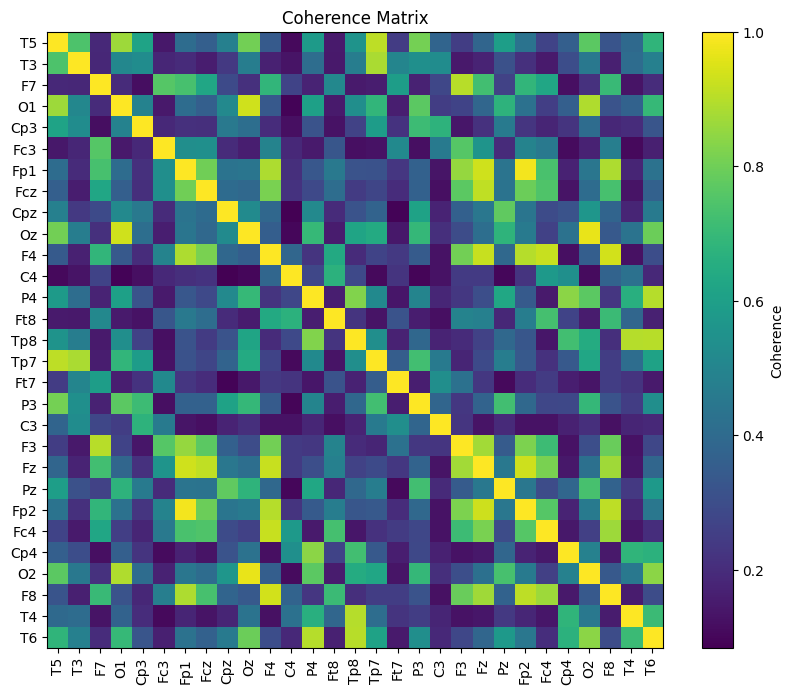

Subject rTMS-02_w0_20210329 Theta band coherence matrix:


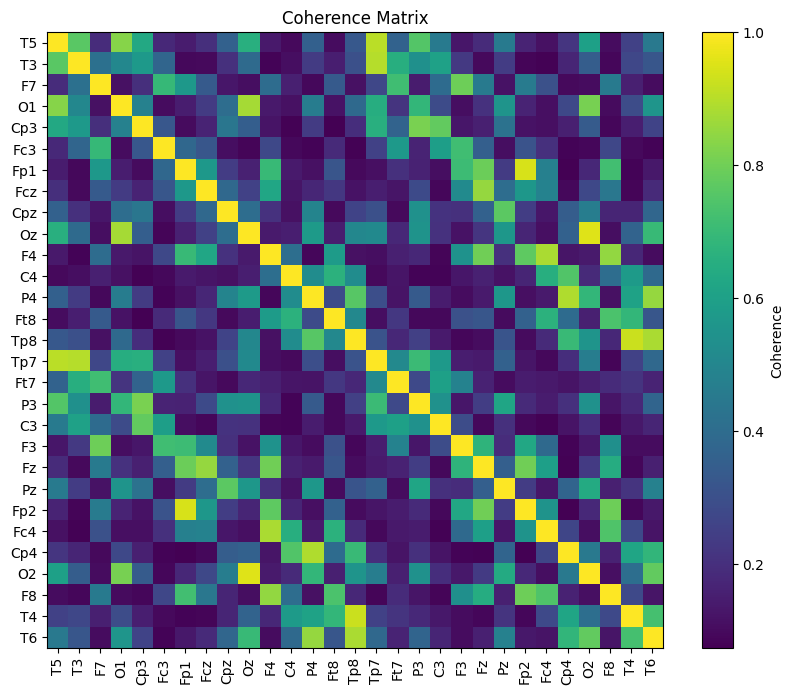

Subject rTMS-02_w0_20210329 Alpha band coherence matrix:


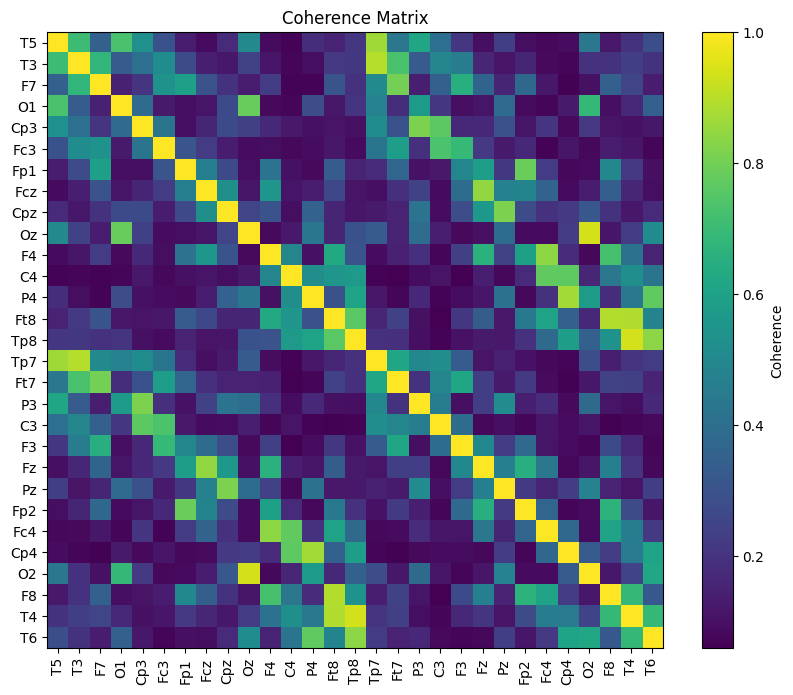

Subject rTMS-02_w0_20210329 Beta band coherence matrix:


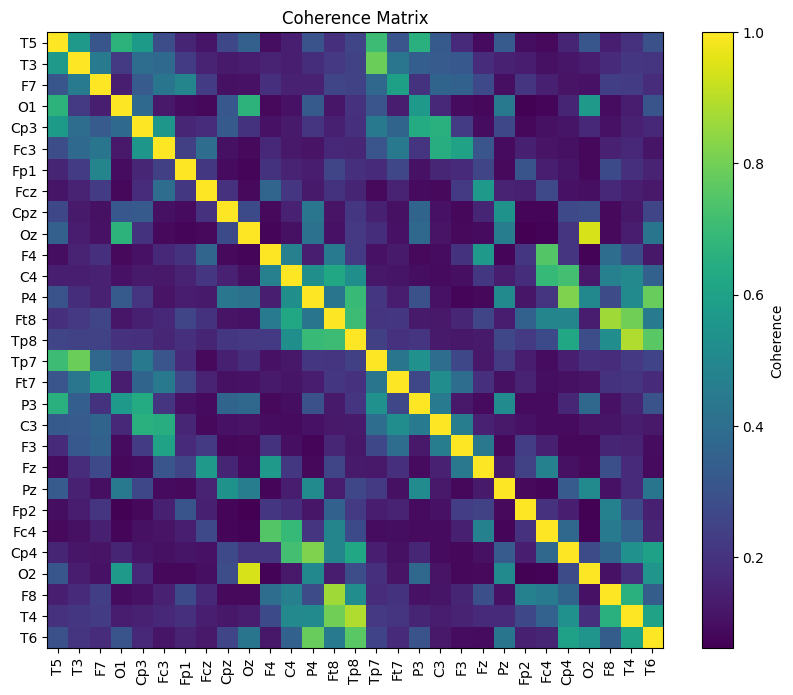

Subject rTMS-02_w0_20210329 Gamma band coherence matrix:


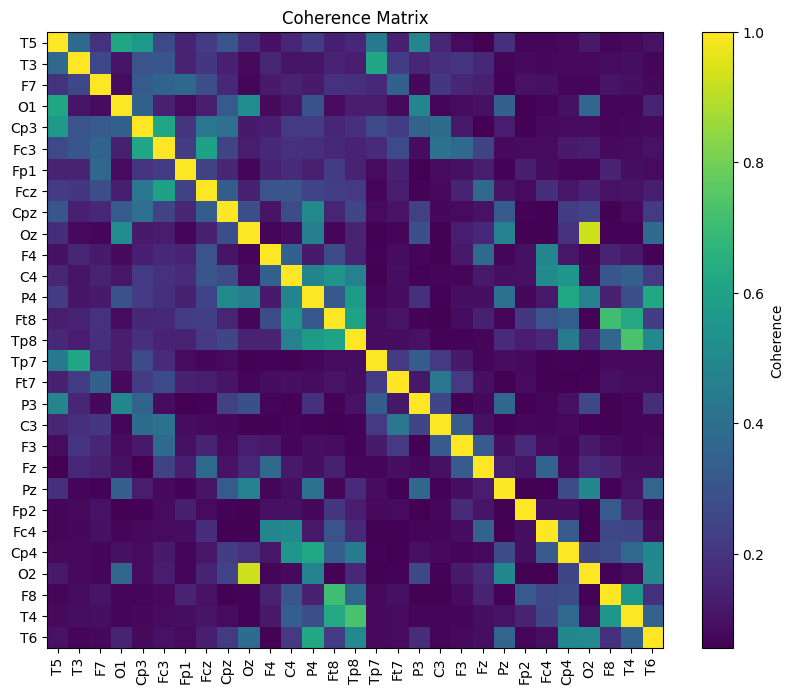

Subject rTMS-16_w0_20231011 Delta band coherence matrix:


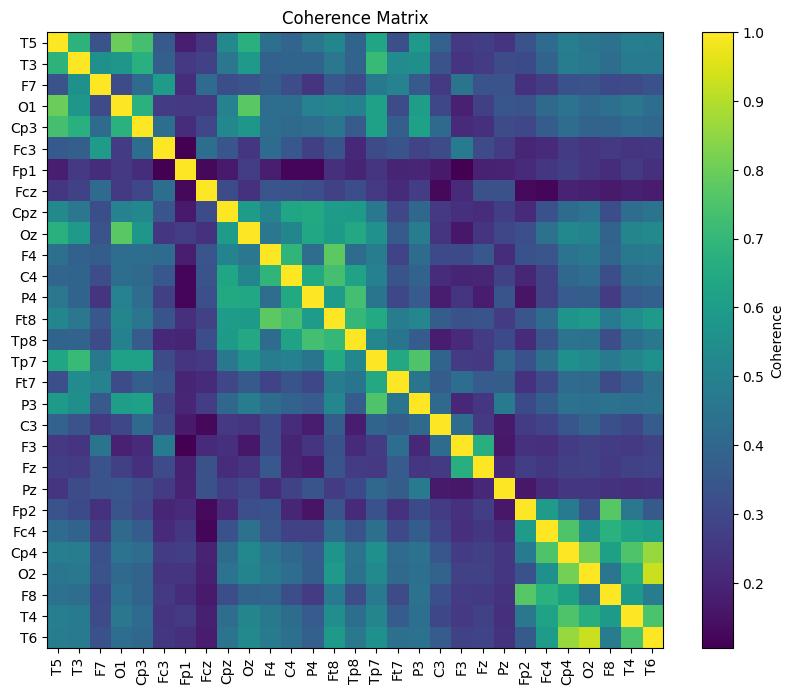

Subject rTMS-16_w0_20231011 Theta band coherence matrix:


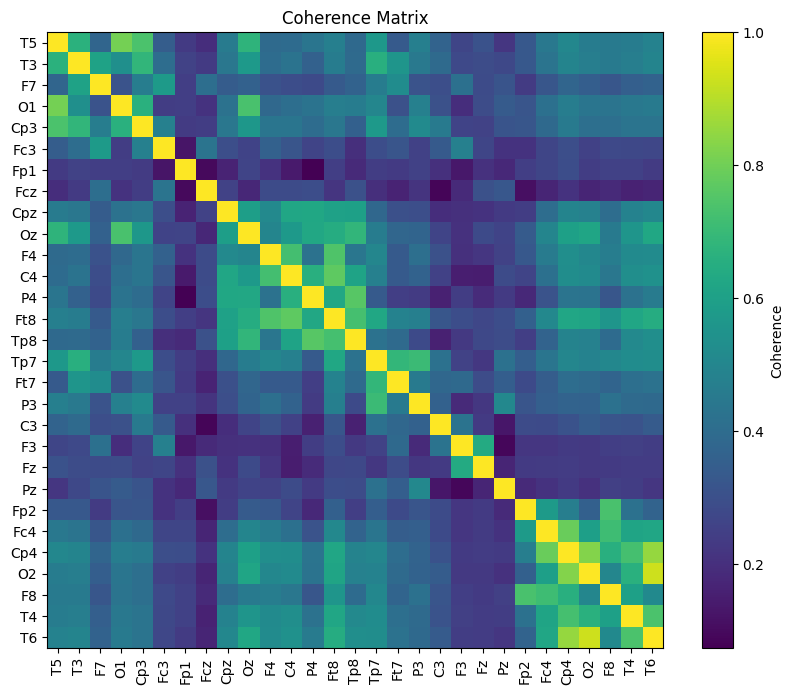

Subject rTMS-16_w0_20231011 Alpha band coherence matrix:


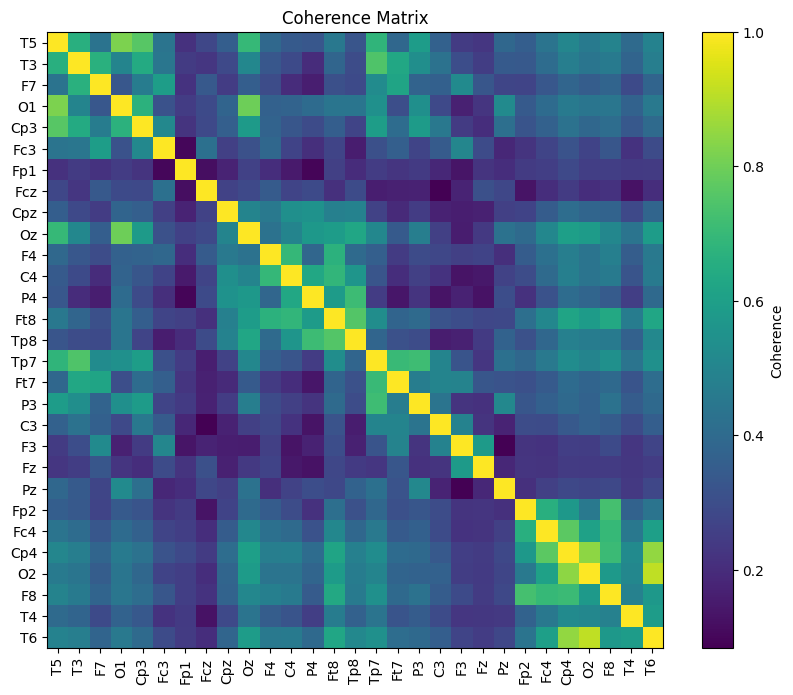

Subject rTMS-16_w0_20231011 Beta band coherence matrix:


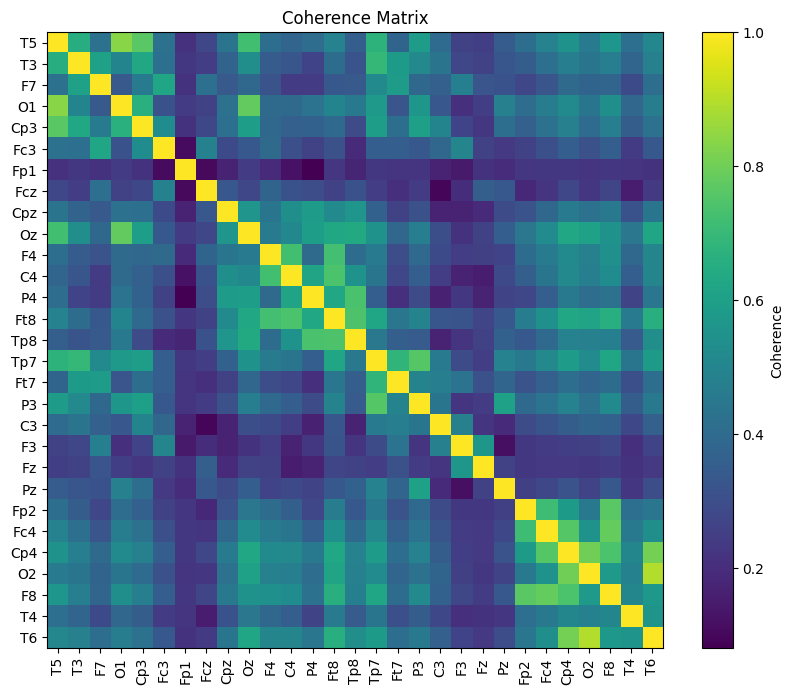

Subject rTMS-16_w0_20231011 Gamma band coherence matrix:


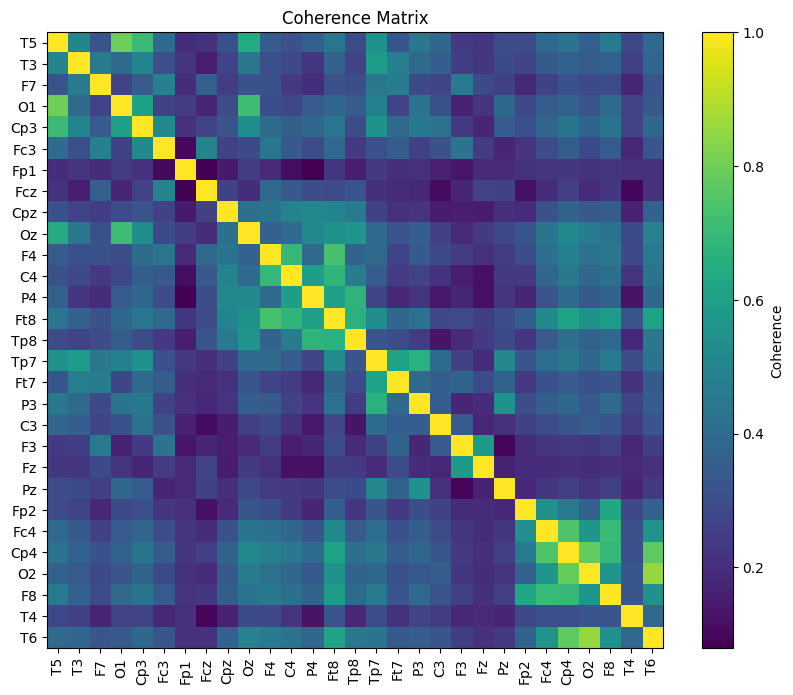

Subject rTMS-20_w0_20231108 Delta band coherence matrix:


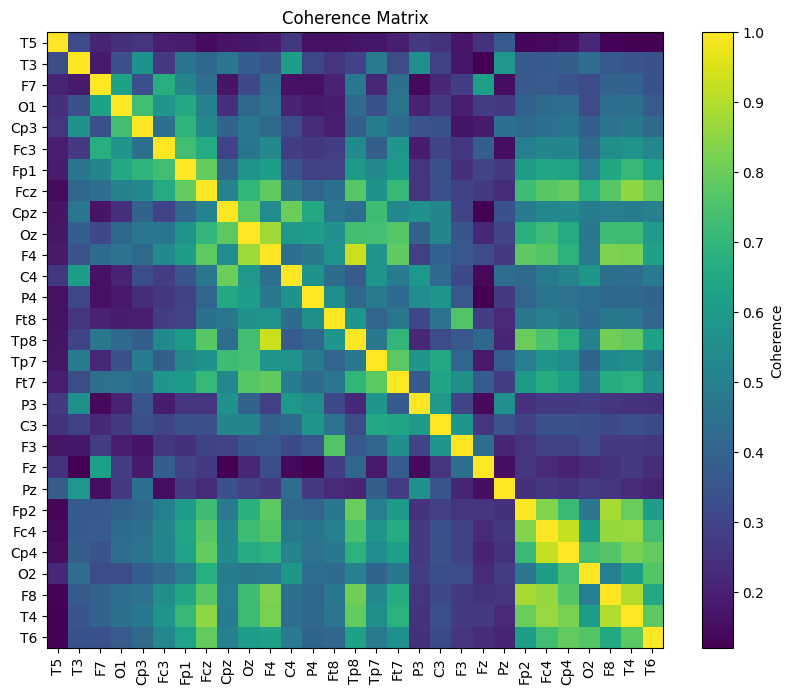

Subject rTMS-20_w0_20231108 Theta band coherence matrix:


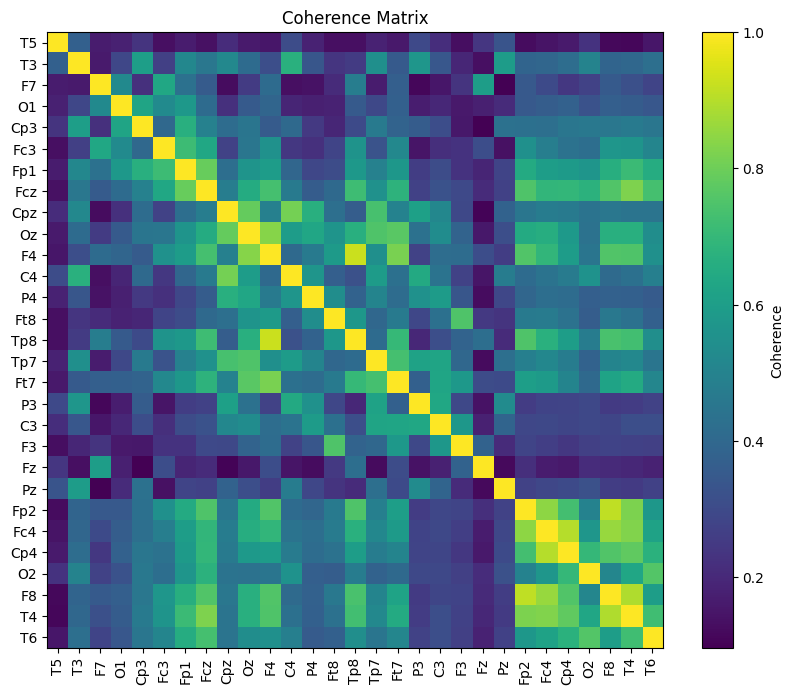

Subject rTMS-20_w0_20231108 Alpha band coherence matrix:


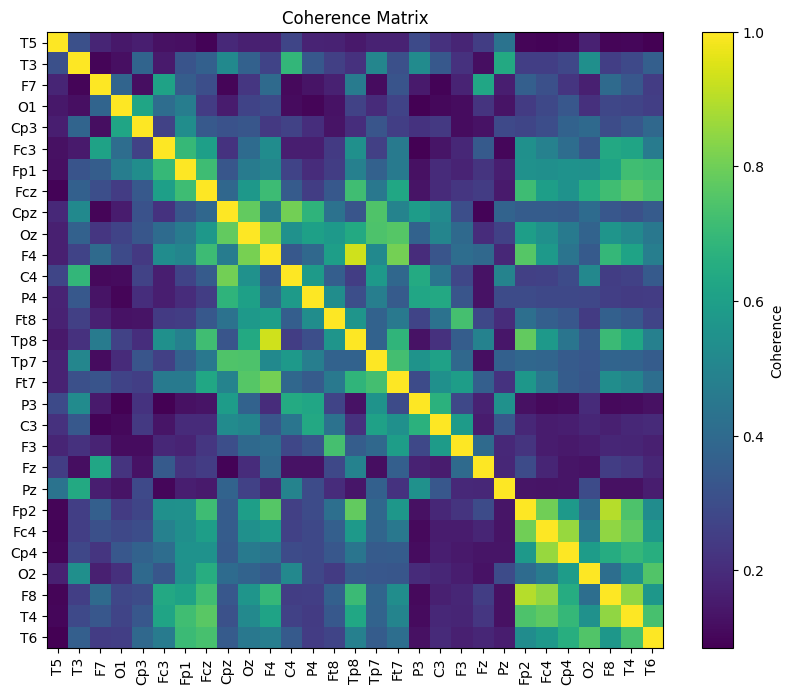

Subject rTMS-20_w0_20231108 Beta band coherence matrix:


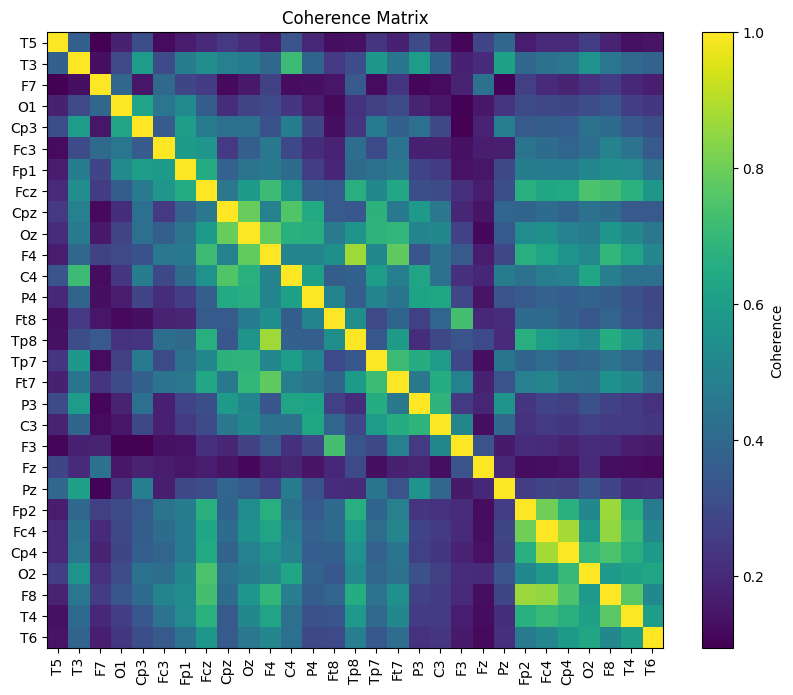

Subject rTMS-20_w0_20231108 Gamma band coherence matrix:


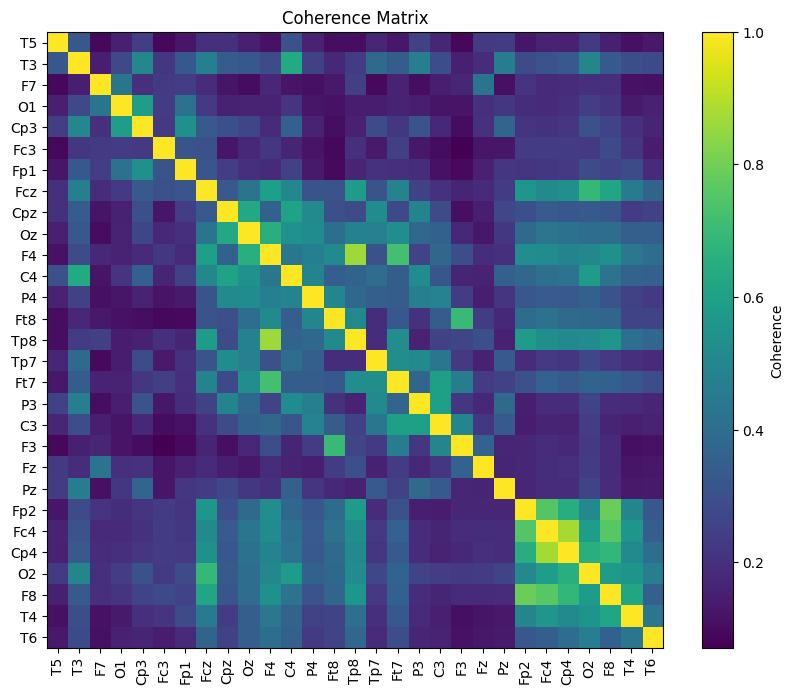

Subject rTMS-23_w0_20240222{漢氏23} Delta band coherence matrix:


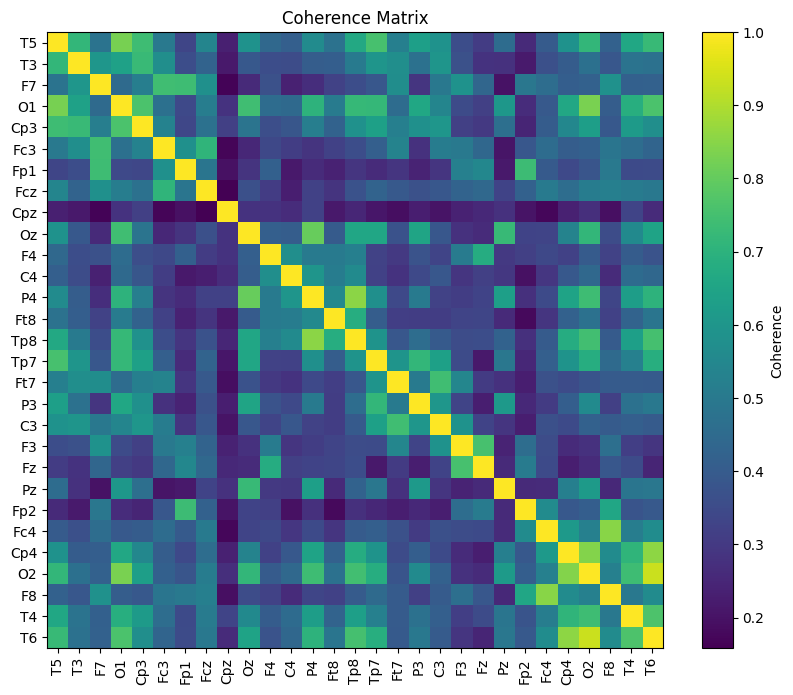

Subject rTMS-23_w0_20240222{漢氏23} Theta band coherence matrix:


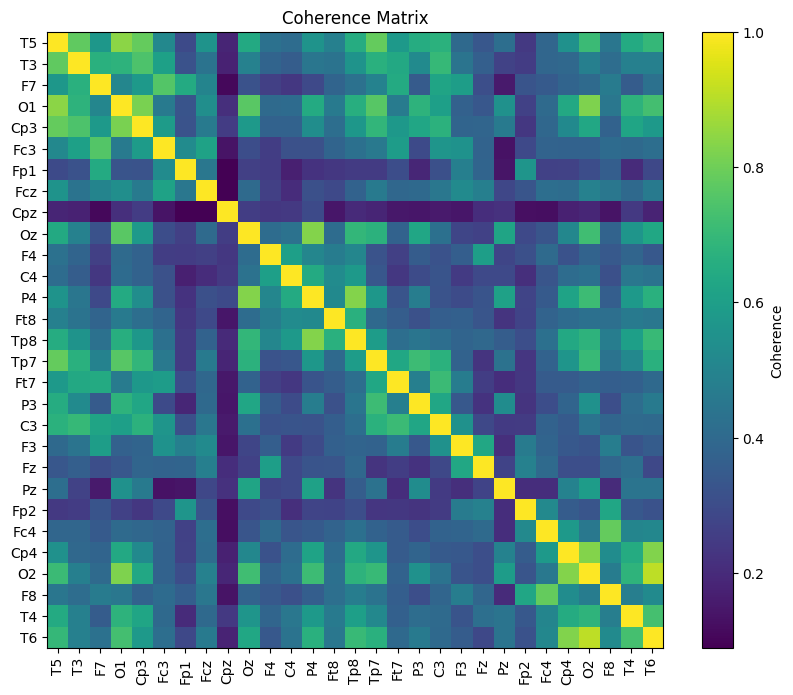

Subject rTMS-23_w0_20240222{漢氏23} Alpha band coherence matrix:


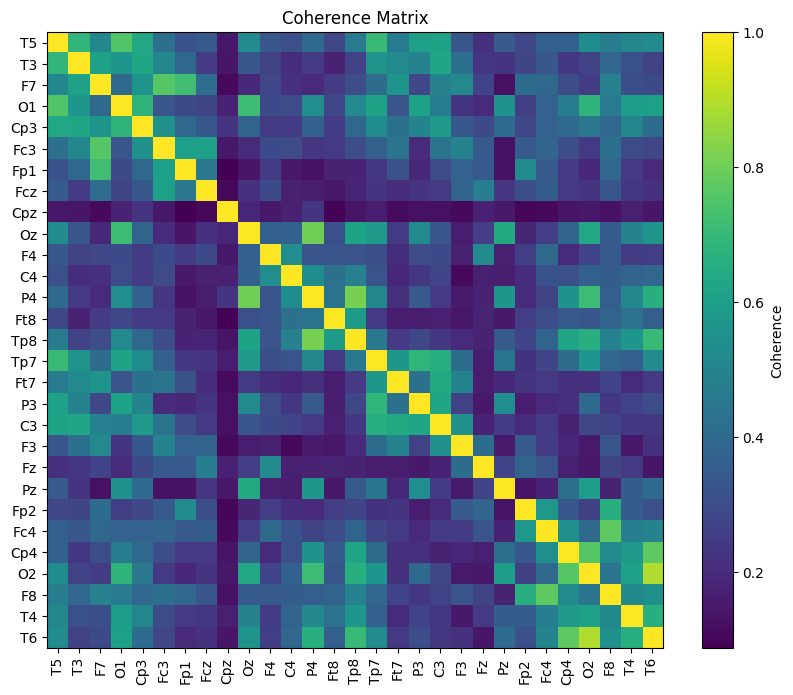

Subject rTMS-23_w0_20240222{漢氏23} Beta band coherence matrix:


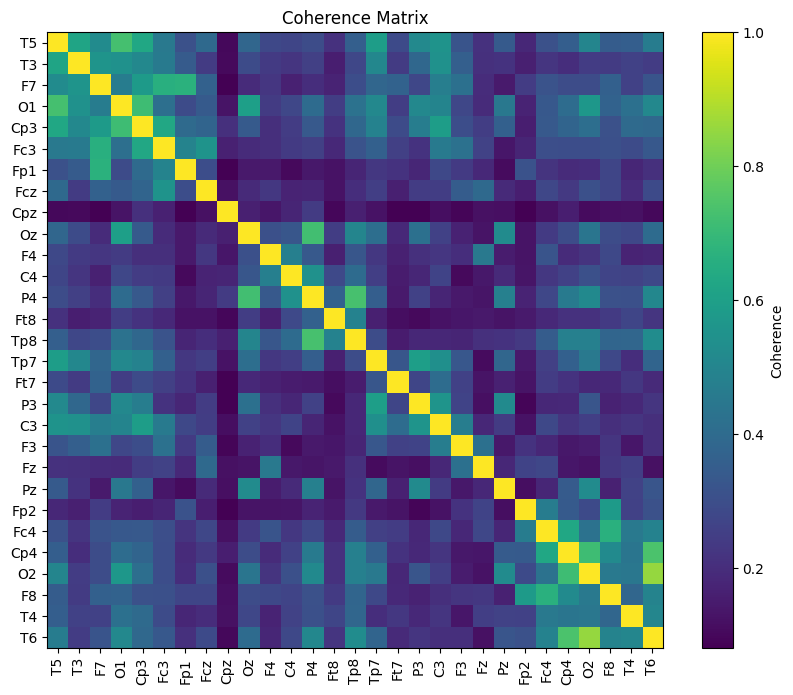

Subject rTMS-23_w0_20240222{漢氏23} Gamma band coherence matrix:


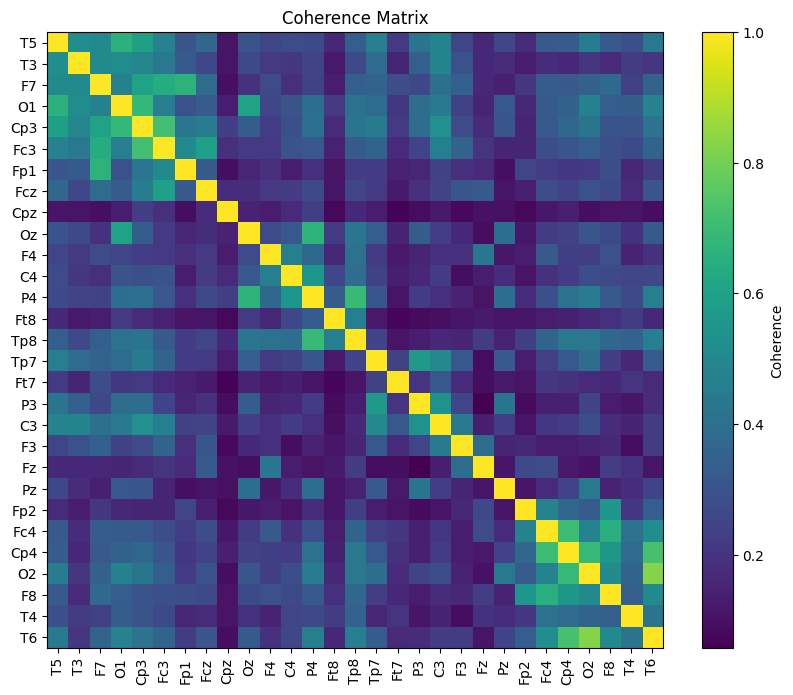

Subject rTMS-24_w0_20240229{漢氏22} Delta band coherence matrix:


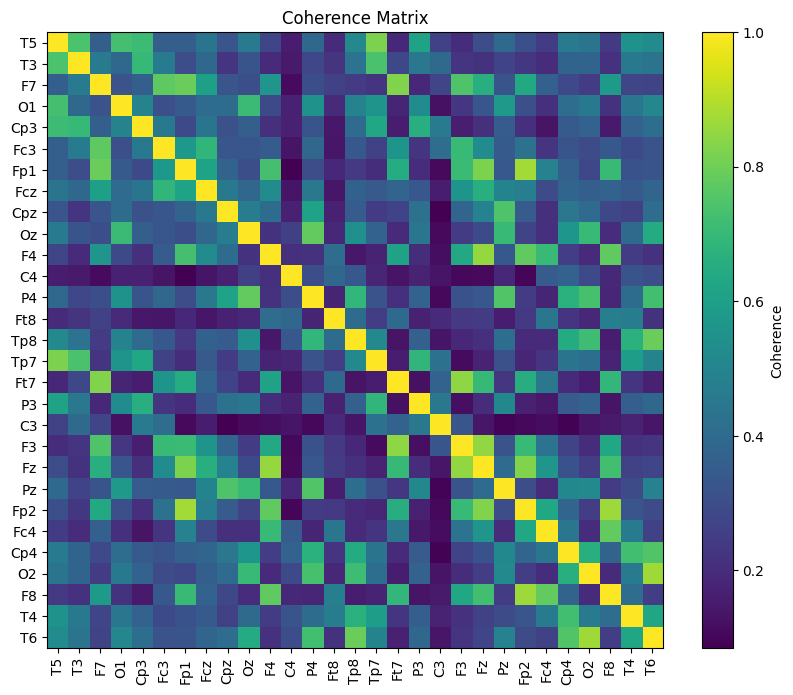

Subject rTMS-24_w0_20240229{漢氏22} Theta band coherence matrix:


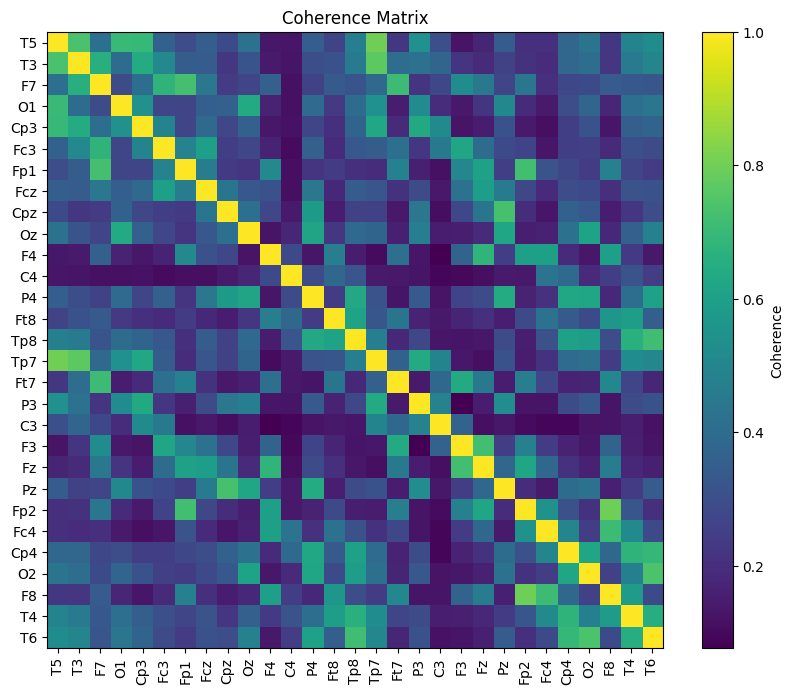

Subject rTMS-24_w0_20240229{漢氏22} Alpha band coherence matrix:


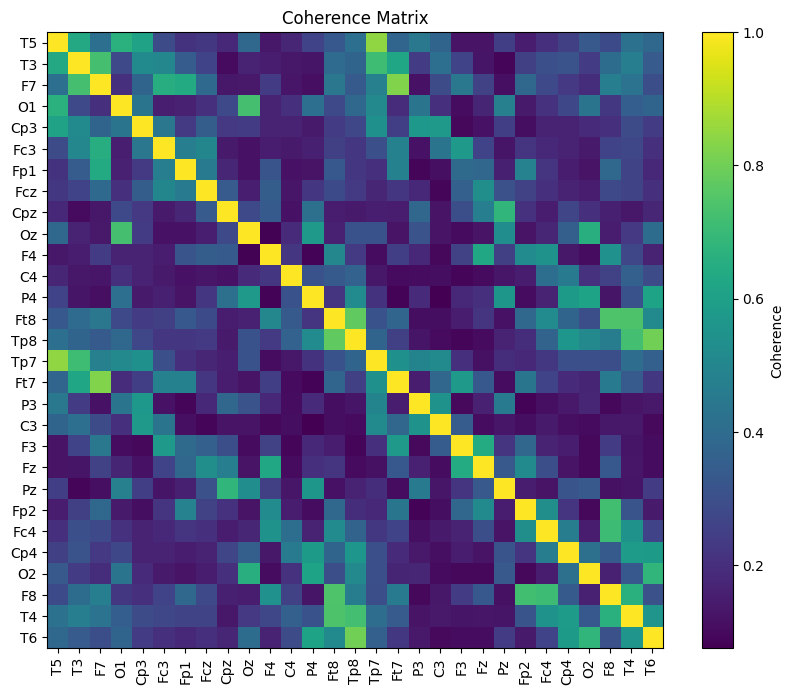

Subject rTMS-24_w0_20240229{漢氏22} Beta band coherence matrix:


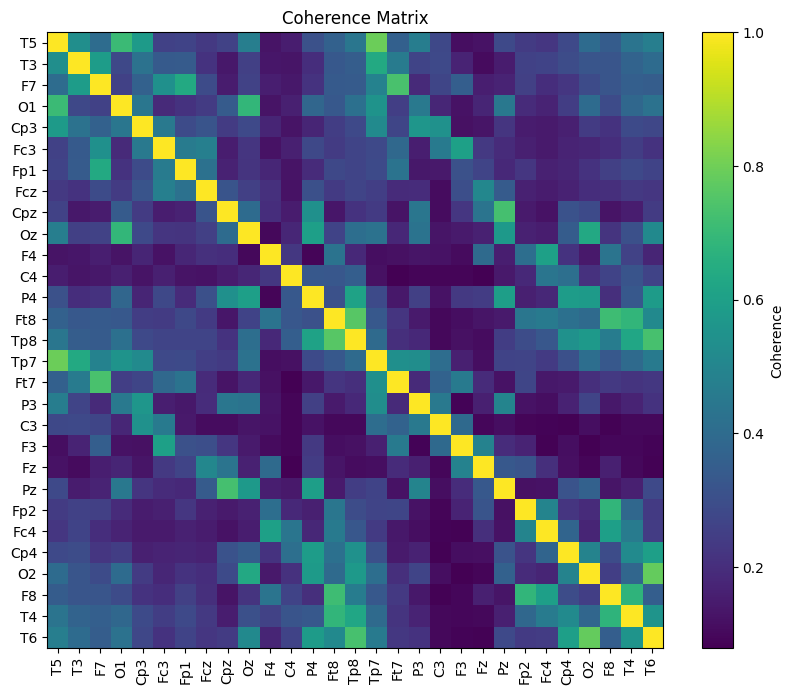

Subject rTMS-24_w0_20240229{漢氏22} Gamma band coherence matrix:


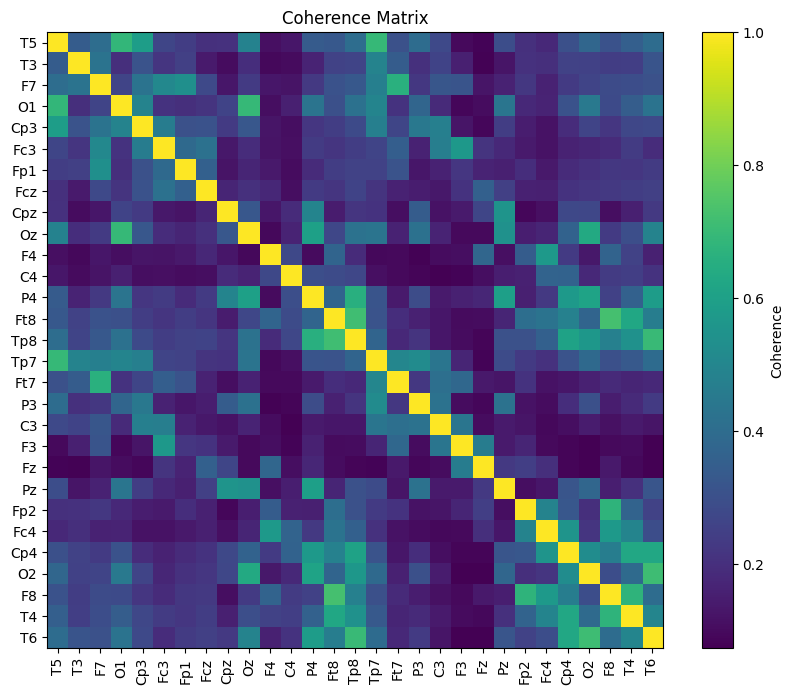

Subject rTMS-02_w2_20221012 Delta band coherence matrix:


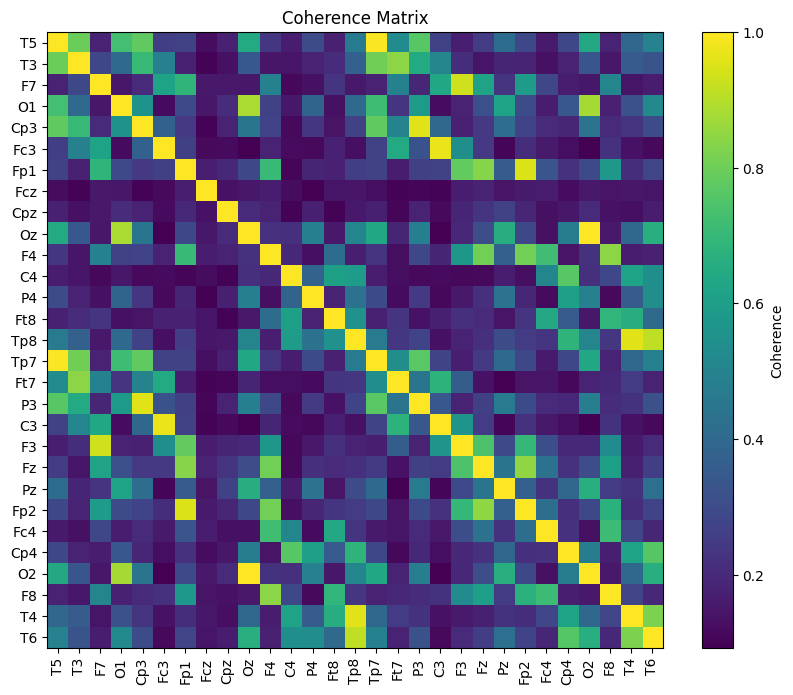

Subject rTMS-02_w2_20221012 Theta band coherence matrix:


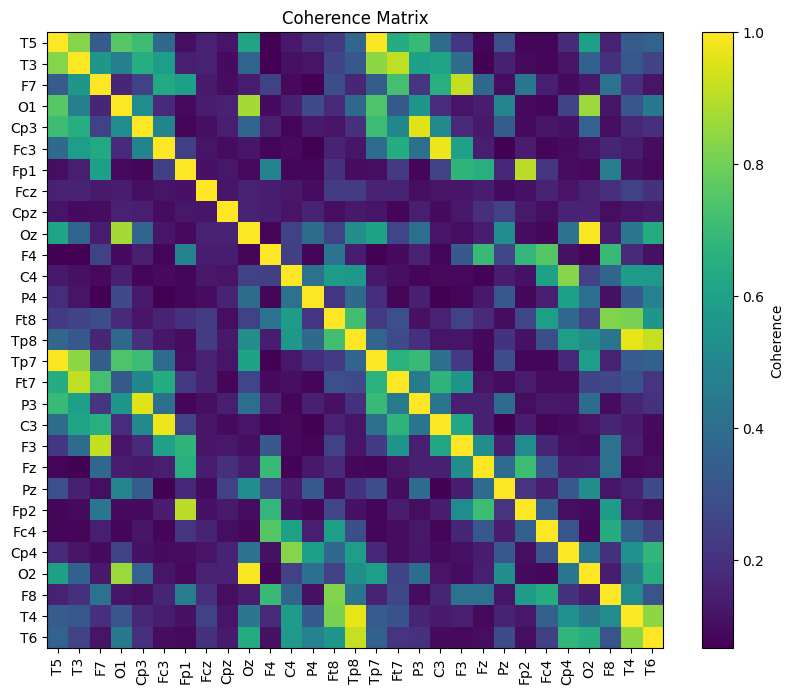

Subject rTMS-02_w2_20221012 Alpha band coherence matrix:


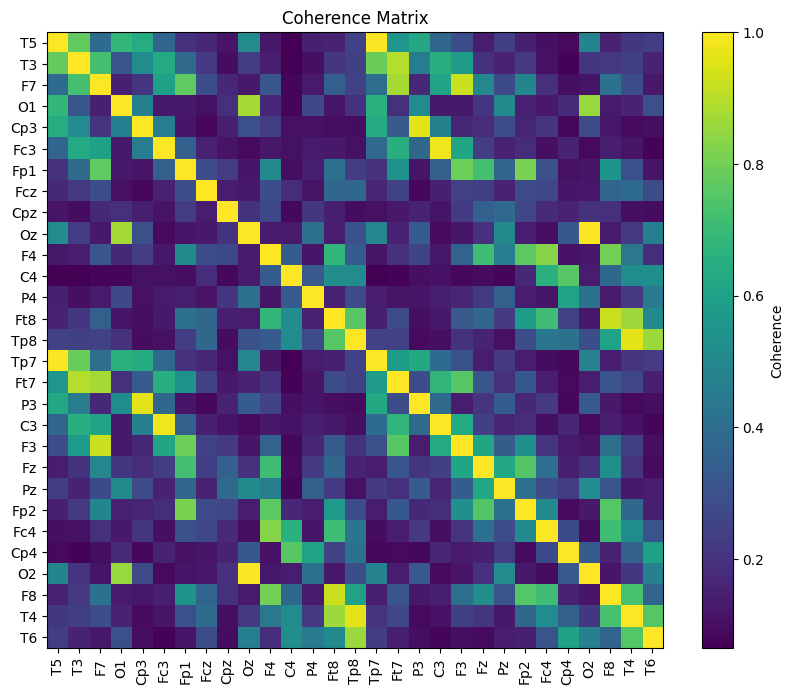

Subject rTMS-02_w2_20221012 Beta band coherence matrix:


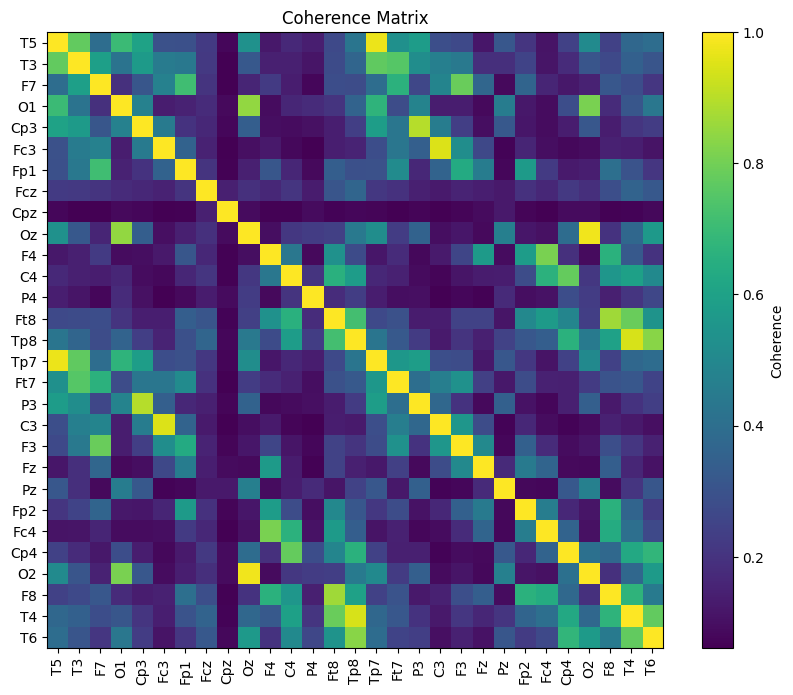

Subject rTMS-02_w2_20221012 Gamma band coherence matrix:


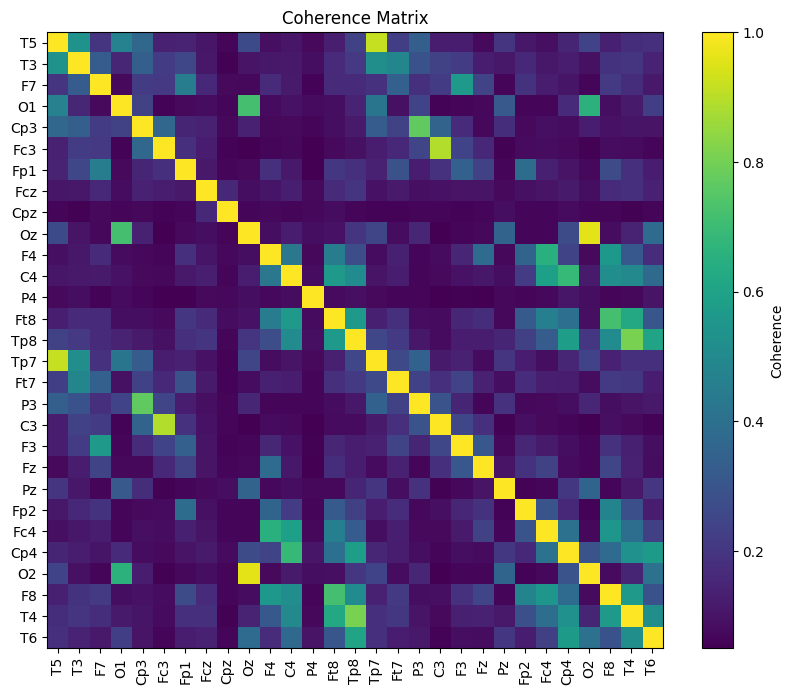

Subject rTMS-16_w2_20240327 Delta band coherence matrix:


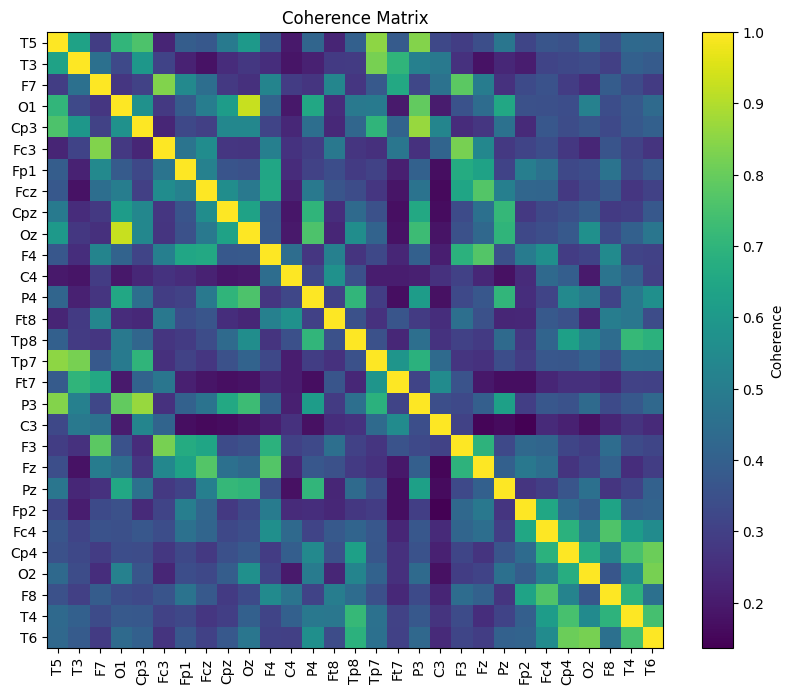

Subject rTMS-16_w2_20240327 Theta band coherence matrix:


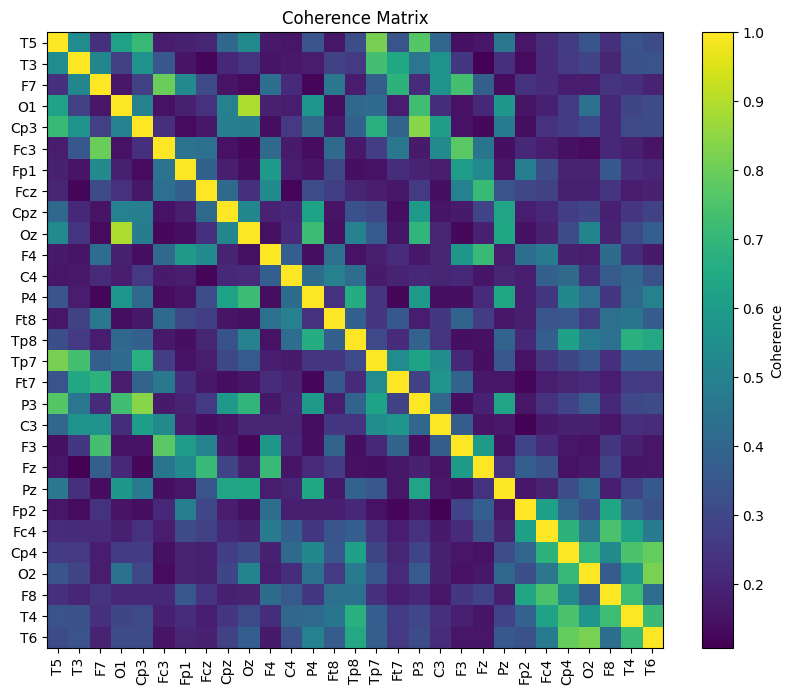

Subject rTMS-16_w2_20240327 Alpha band coherence matrix:


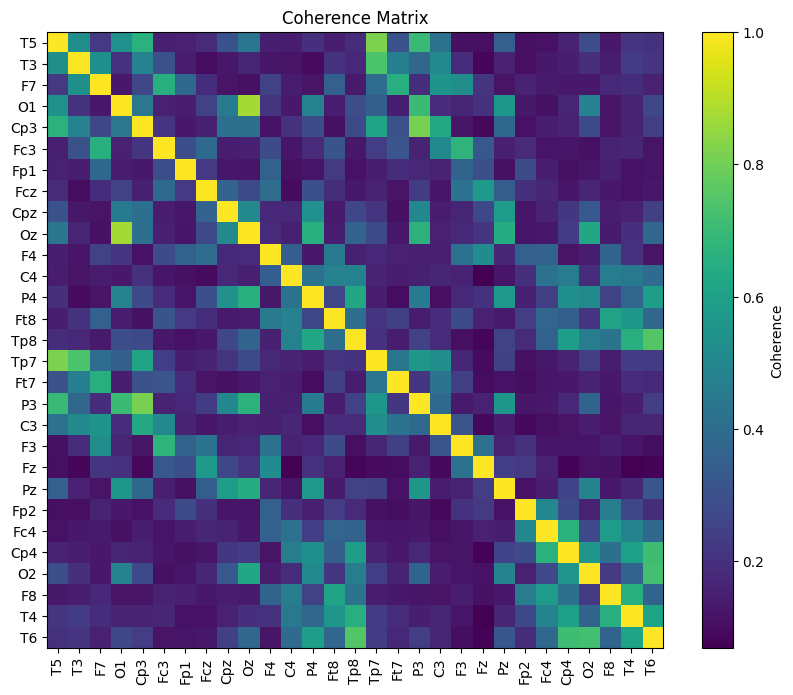

Subject rTMS-16_w2_20240327 Beta band coherence matrix:


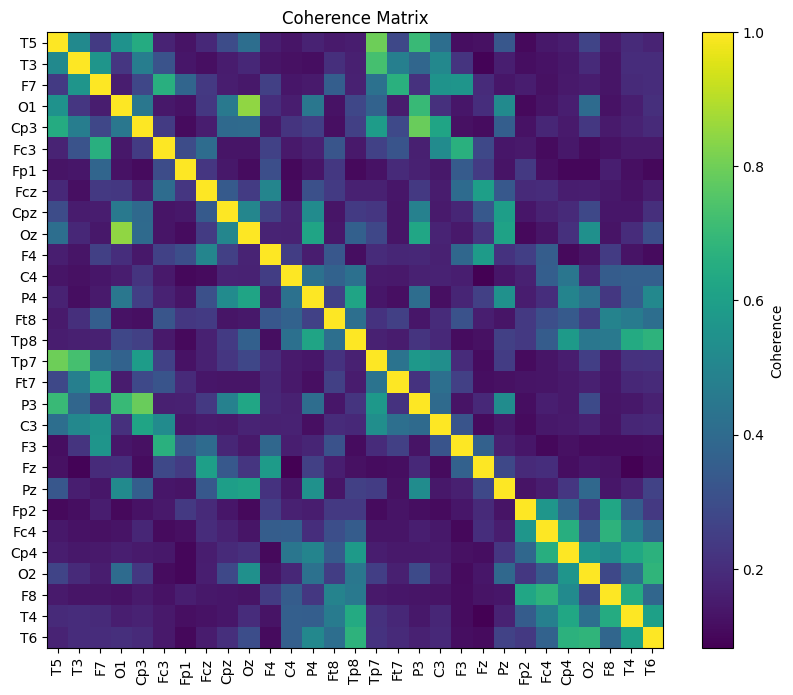

Subject rTMS-16_w2_20240327 Gamma band coherence matrix:


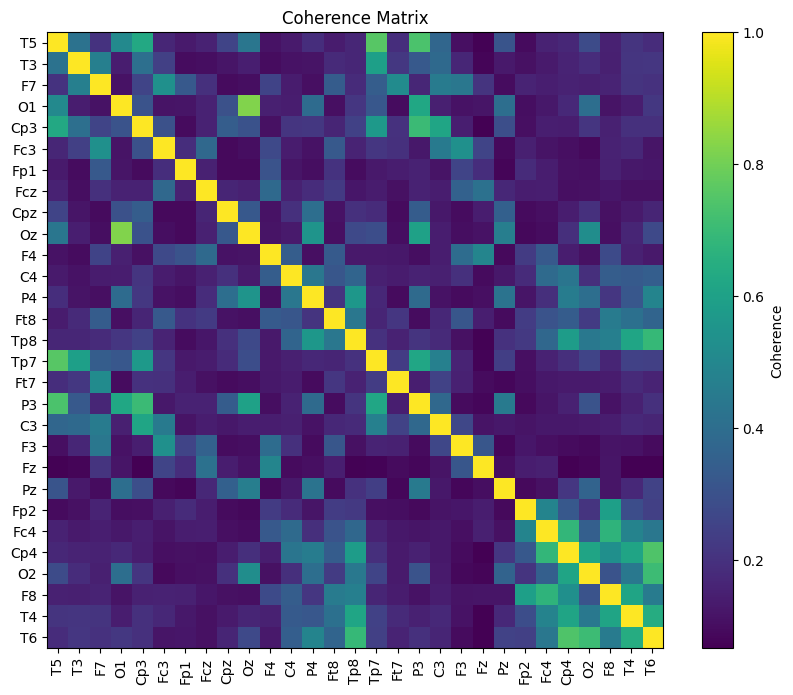

Subject rTMS-20_w2_20231123 Delta band coherence matrix:


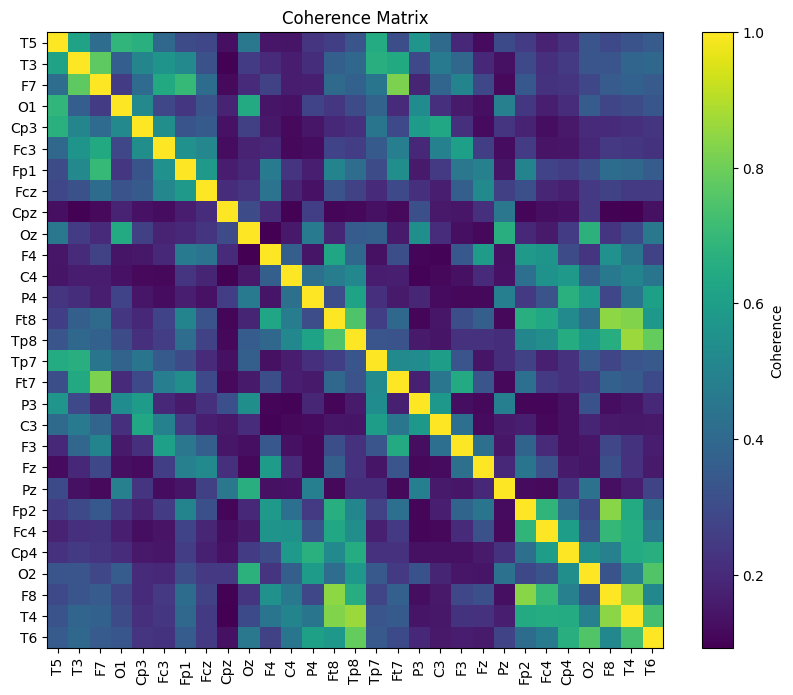

Subject rTMS-20_w2_20231123 Theta band coherence matrix:


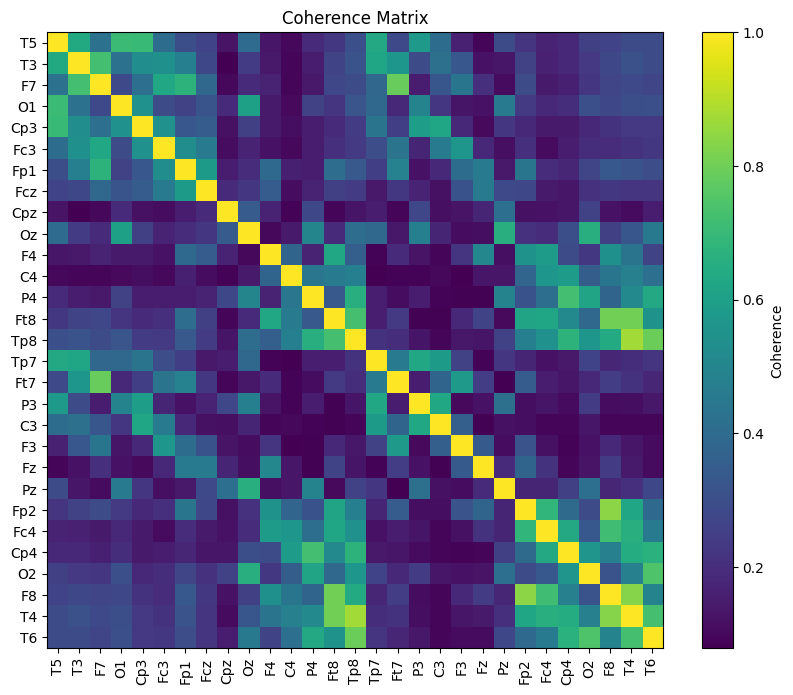

Subject rTMS-20_w2_20231123 Alpha band coherence matrix:


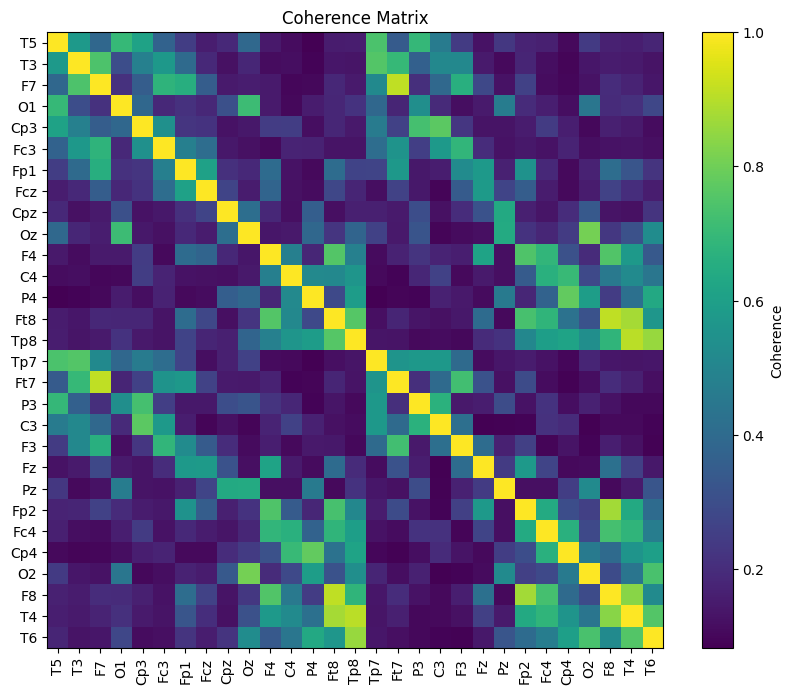

Subject rTMS-20_w2_20231123 Beta band coherence matrix:


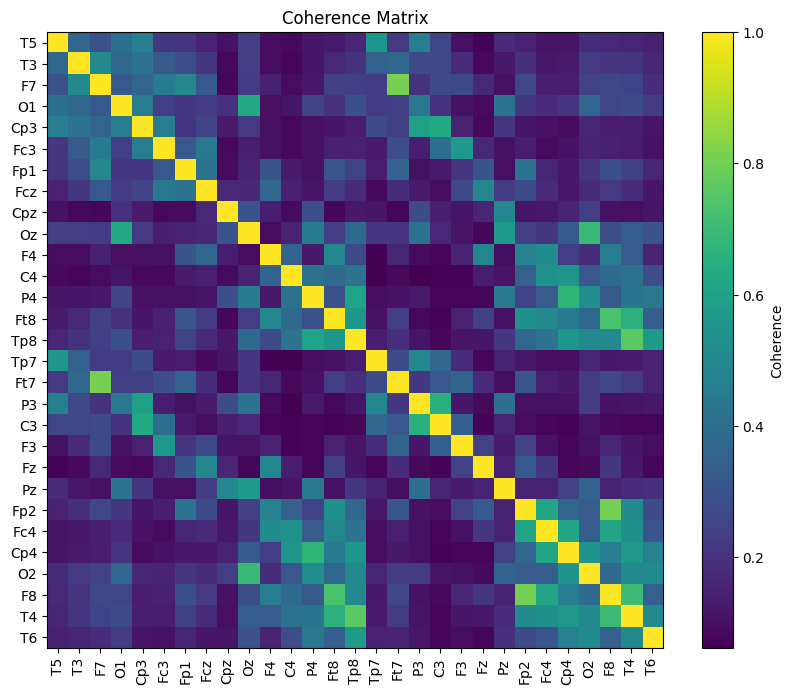

Subject rTMS-20_w2_20231123 Gamma band coherence matrix:


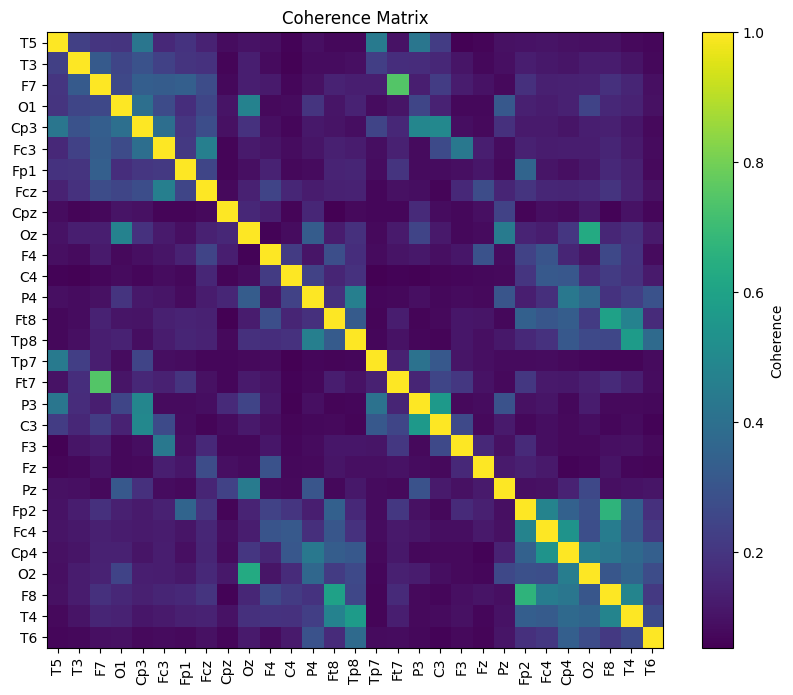

Subject rTMS-23_w2_20240307 Delta band coherence matrix:


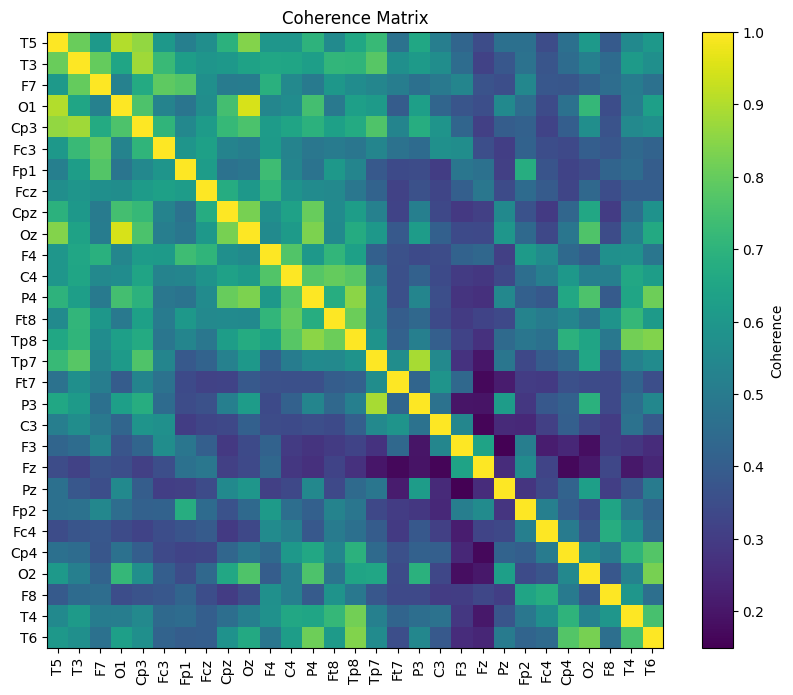

Subject rTMS-23_w2_20240307 Theta band coherence matrix:


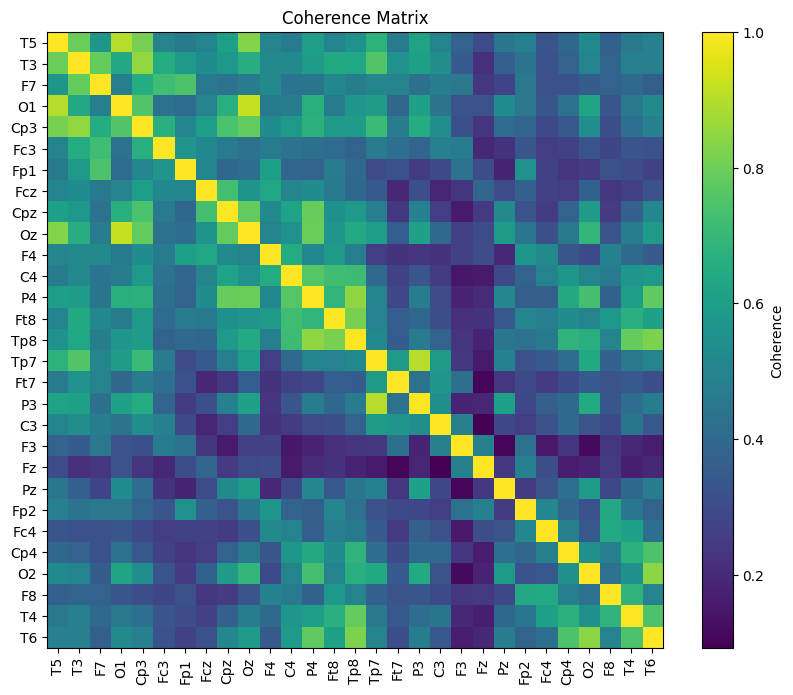

Subject rTMS-23_w2_20240307 Alpha band coherence matrix:


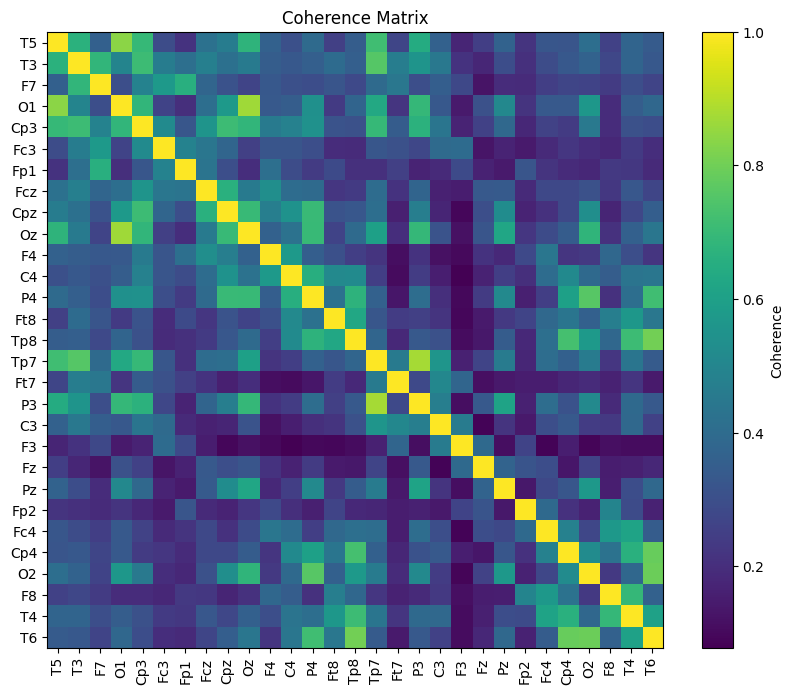

Subject rTMS-23_w2_20240307 Beta band coherence matrix:


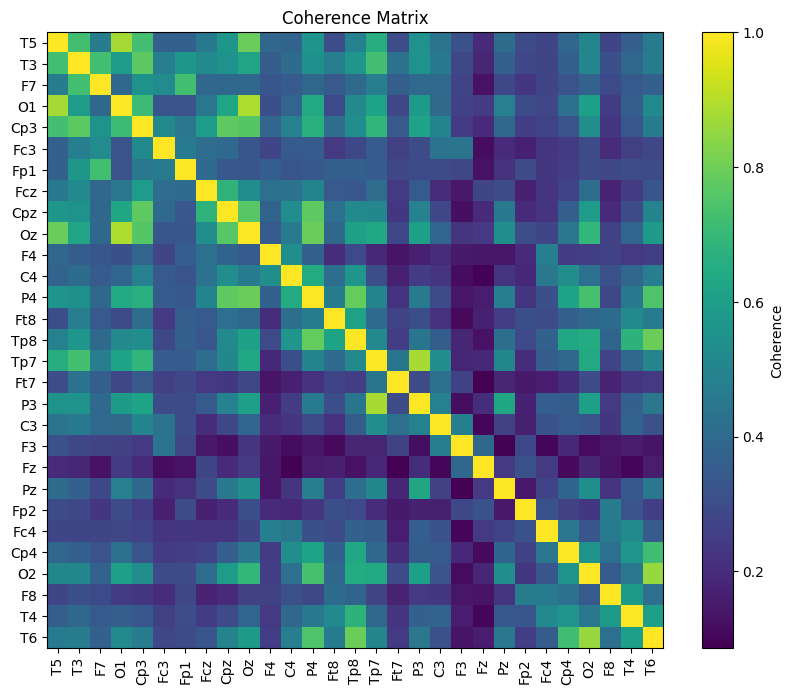

Subject rTMS-23_w2_20240307 Gamma band coherence matrix:


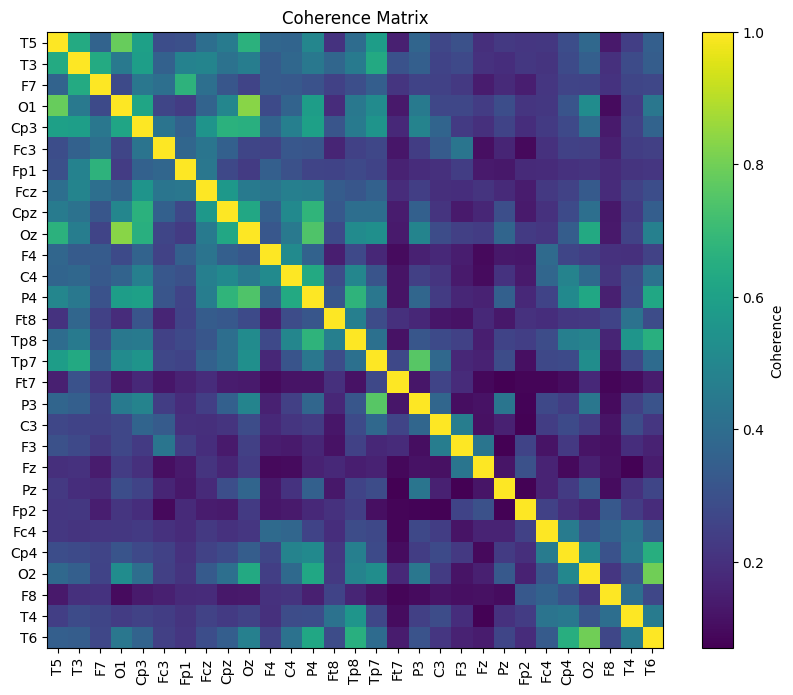

Subject rTMS-24_w2_20240318 Delta band coherence matrix:


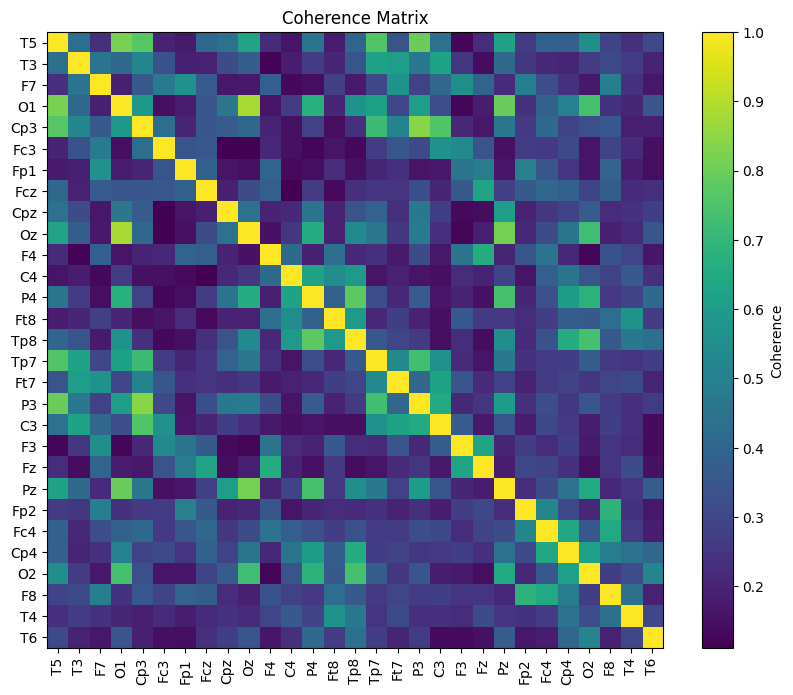

Subject rTMS-24_w2_20240318 Theta band coherence matrix:


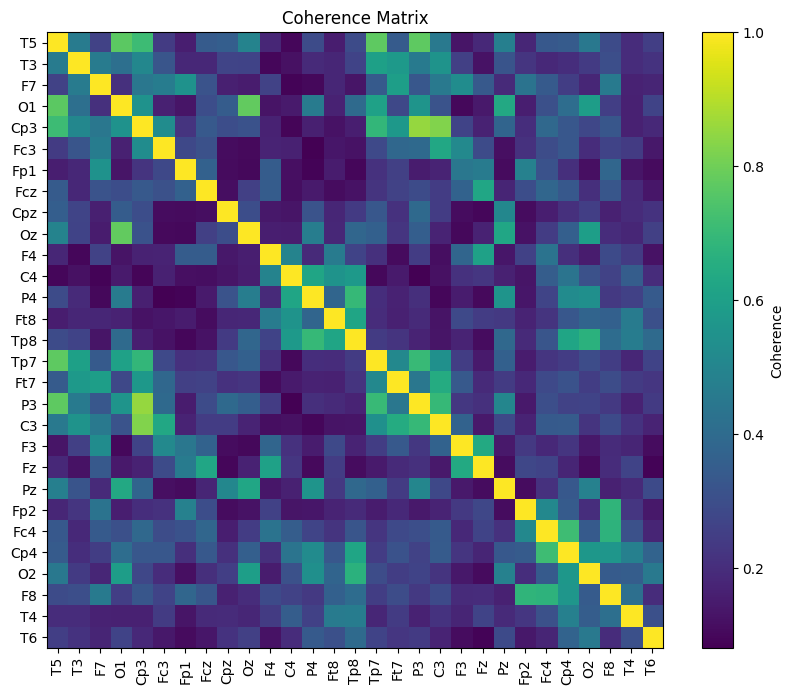

Subject rTMS-24_w2_20240318 Alpha band coherence matrix:


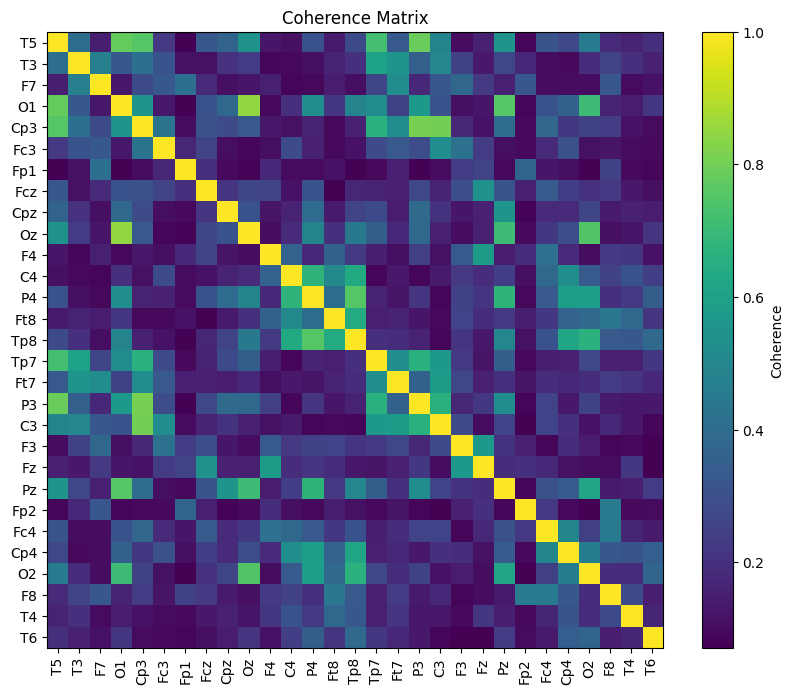

Subject rTMS-24_w2_20240318 Beta band coherence matrix:


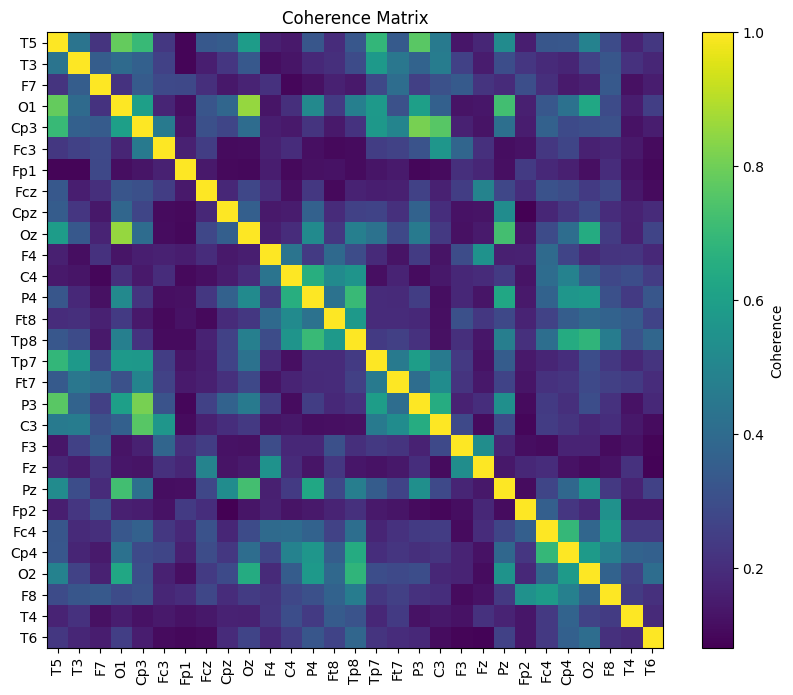

Subject rTMS-24_w2_20240318 Gamma band coherence matrix:


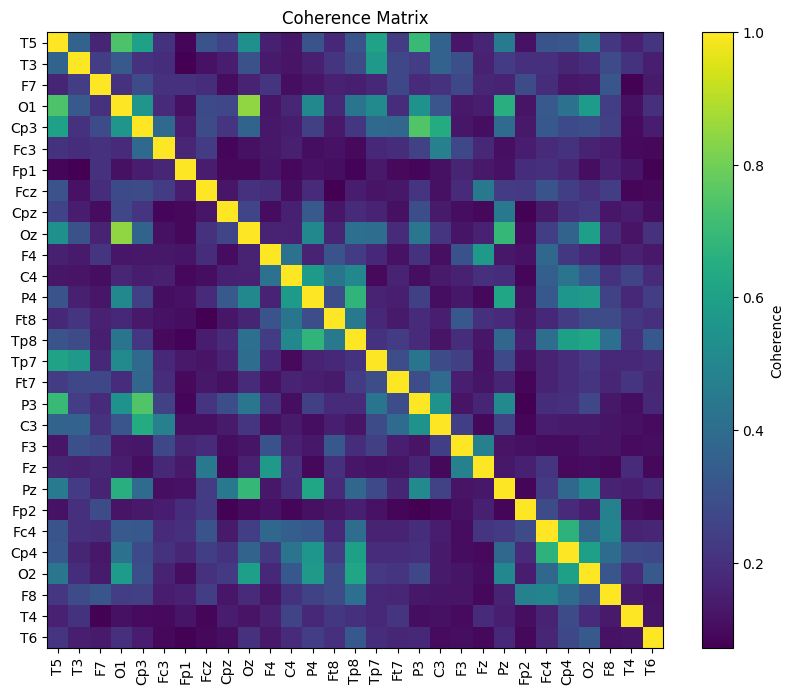

Subject rTMS-01_w0_20210609 Delta band coherence matrix:


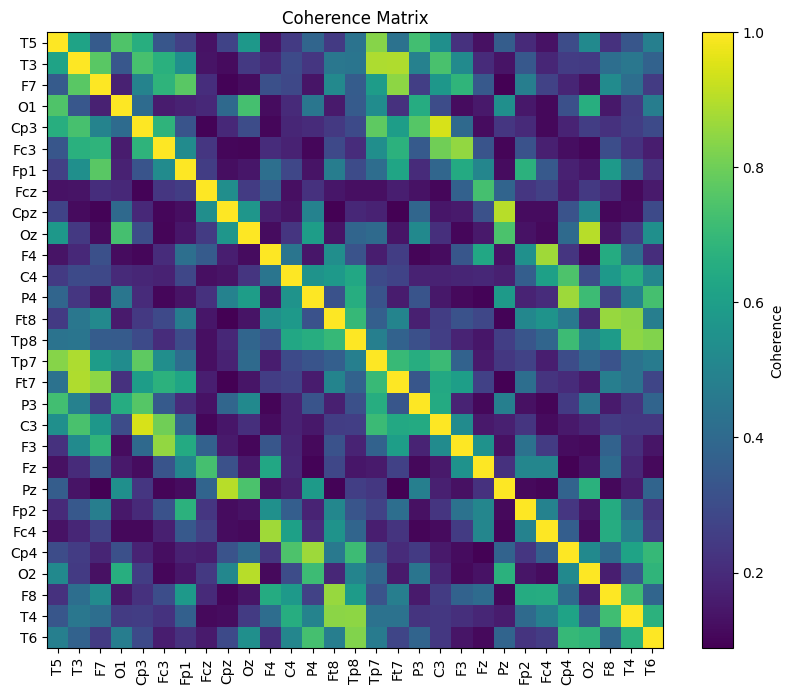

Subject rTMS-01_w0_20210609 Theta band coherence matrix:


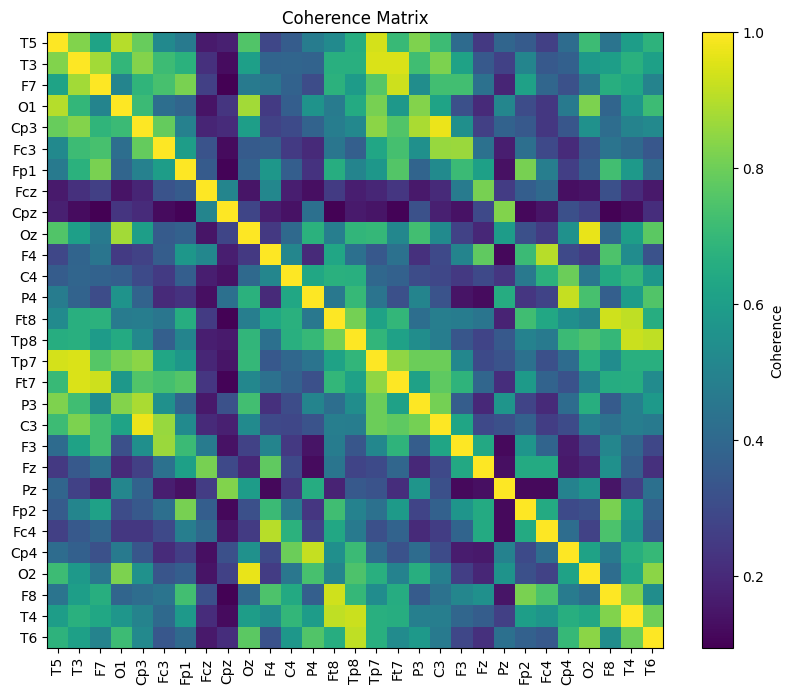

Subject rTMS-01_w0_20210609 Alpha band coherence matrix:


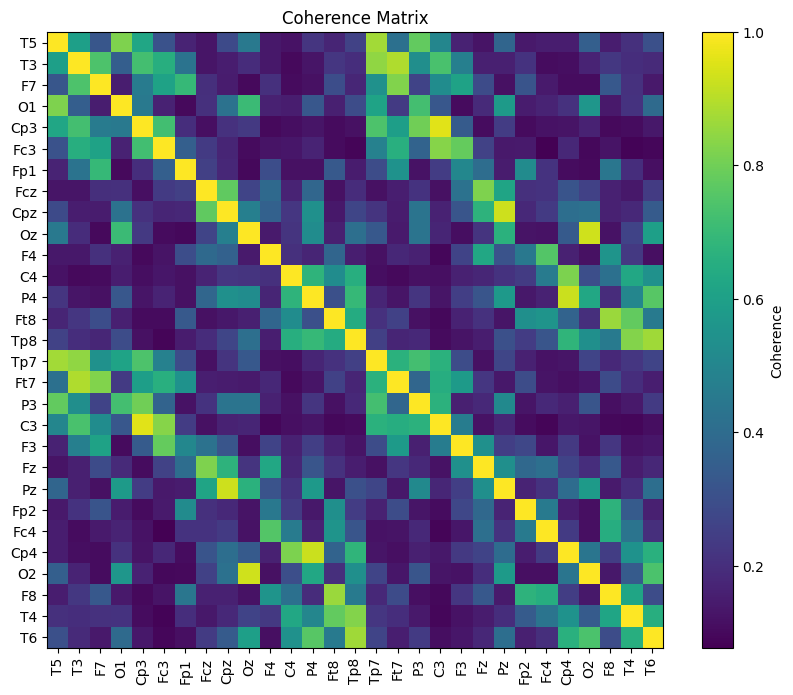

Subject rTMS-01_w0_20210609 Beta band coherence matrix:


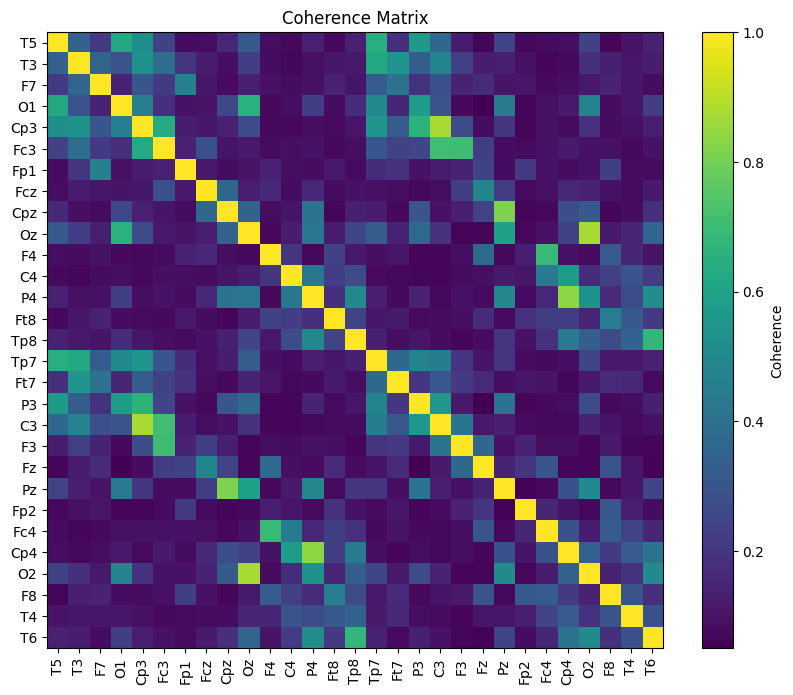

Subject rTMS-01_w0_20210609 Gamma band coherence matrix:


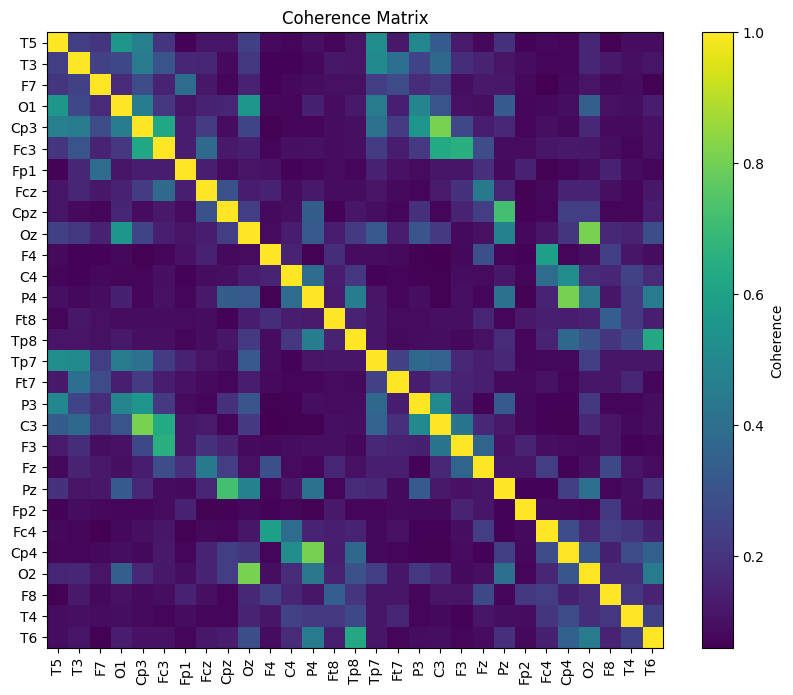

Subject rTMS-03_w0_20220221 Delta band coherence matrix:


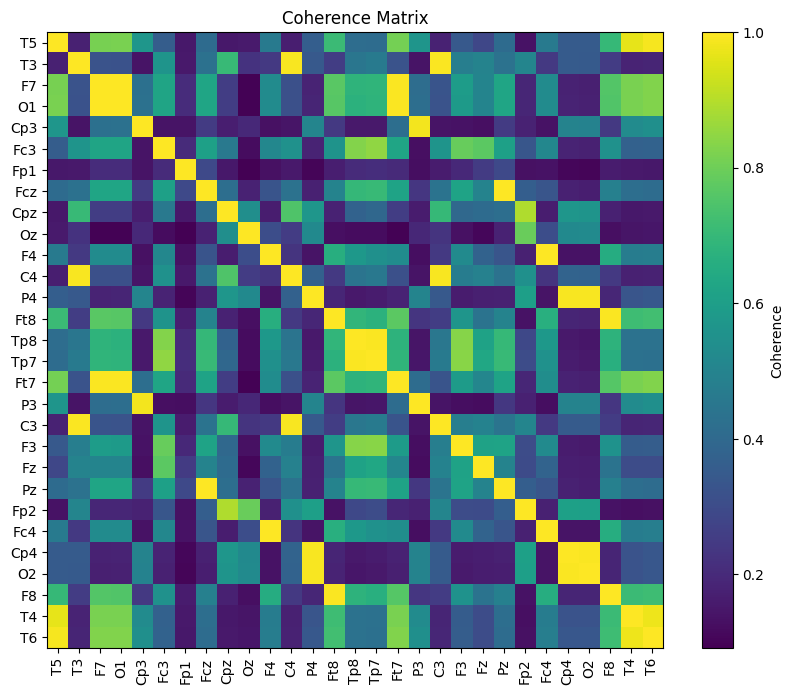

Subject rTMS-03_w0_20220221 Theta band coherence matrix:


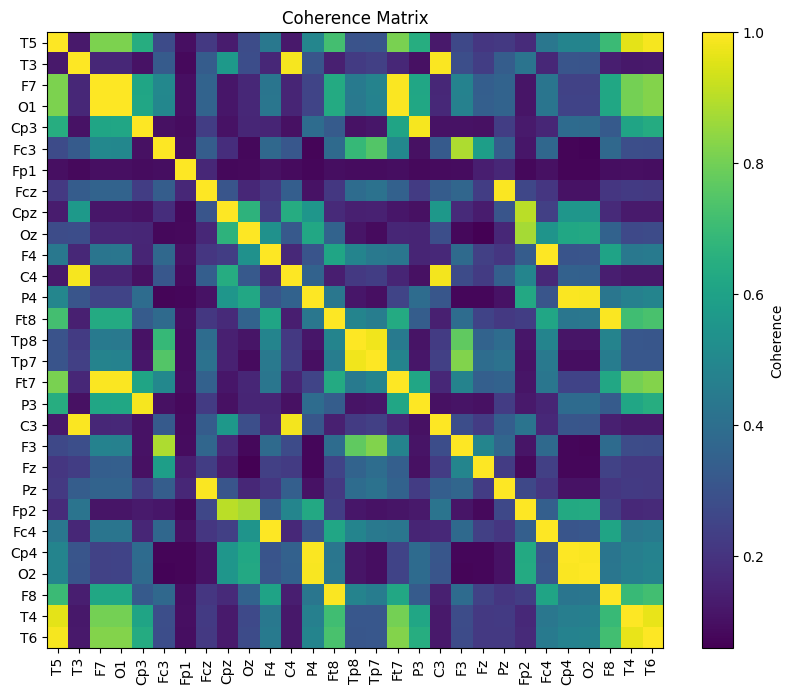

Subject rTMS-03_w0_20220221 Alpha band coherence matrix:


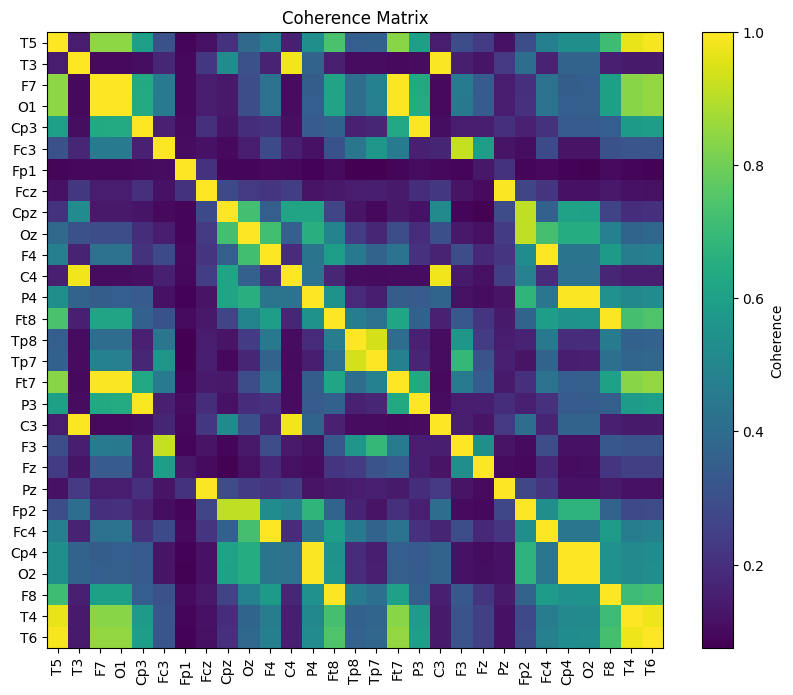

Subject rTMS-03_w0_20220221 Beta band coherence matrix:


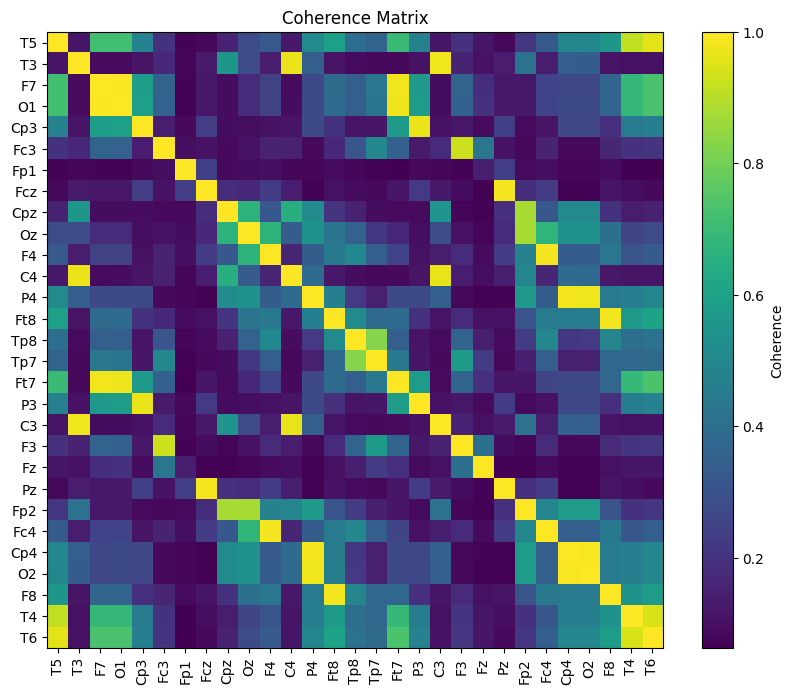

Subject rTMS-03_w0_20220221 Gamma band coherence matrix:


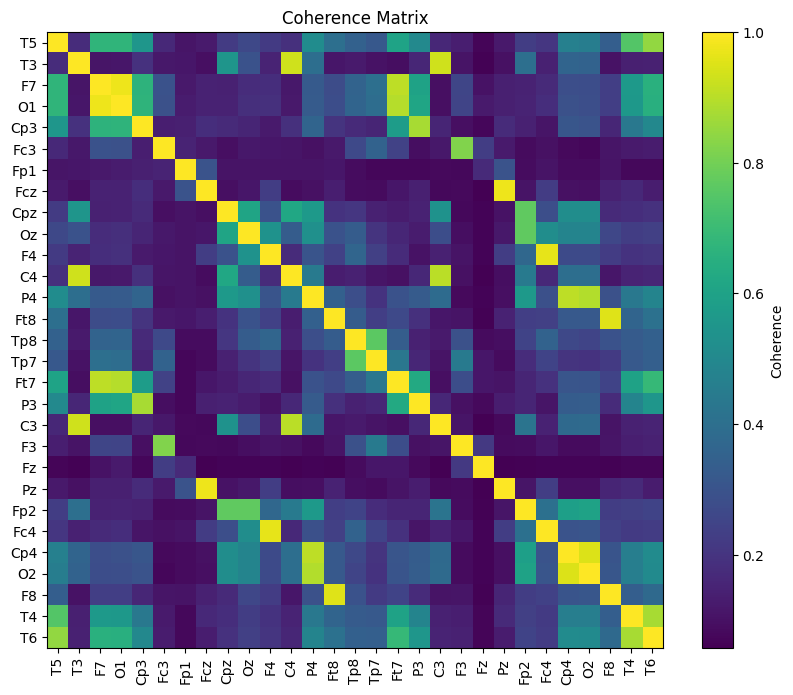

Subject rTMS-05_w0_20220629 Delta band coherence matrix:


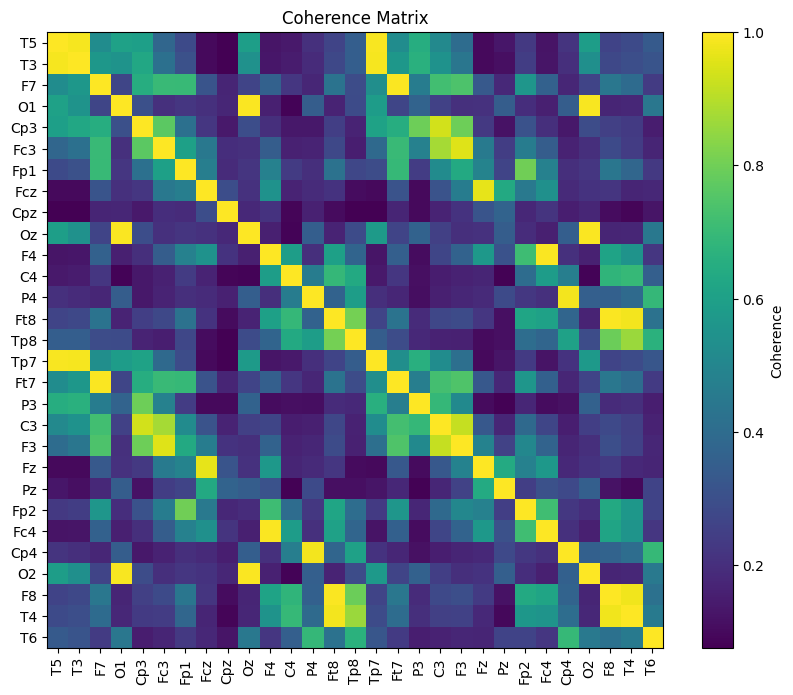

Subject rTMS-05_w0_20220629 Theta band coherence matrix:


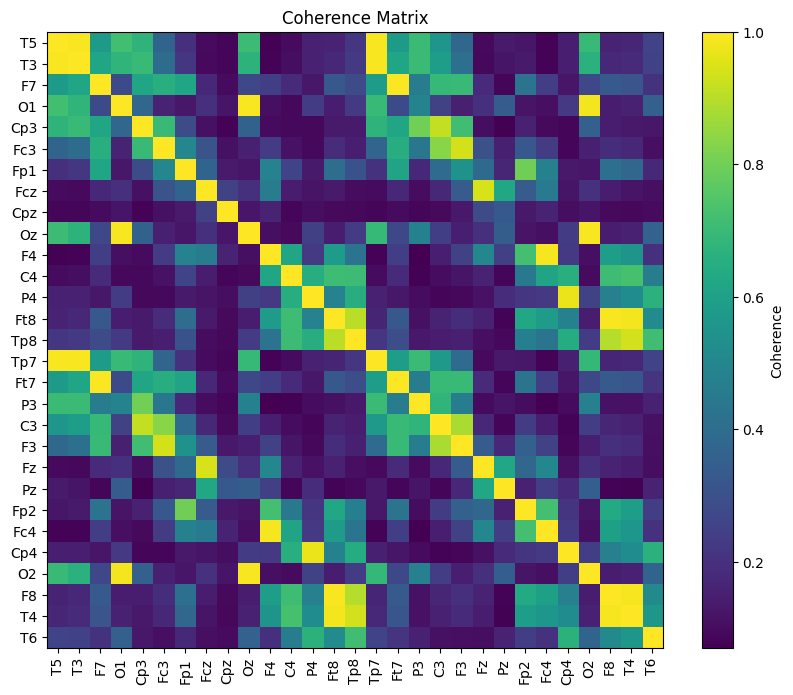

Subject rTMS-05_w0_20220629 Alpha band coherence matrix:


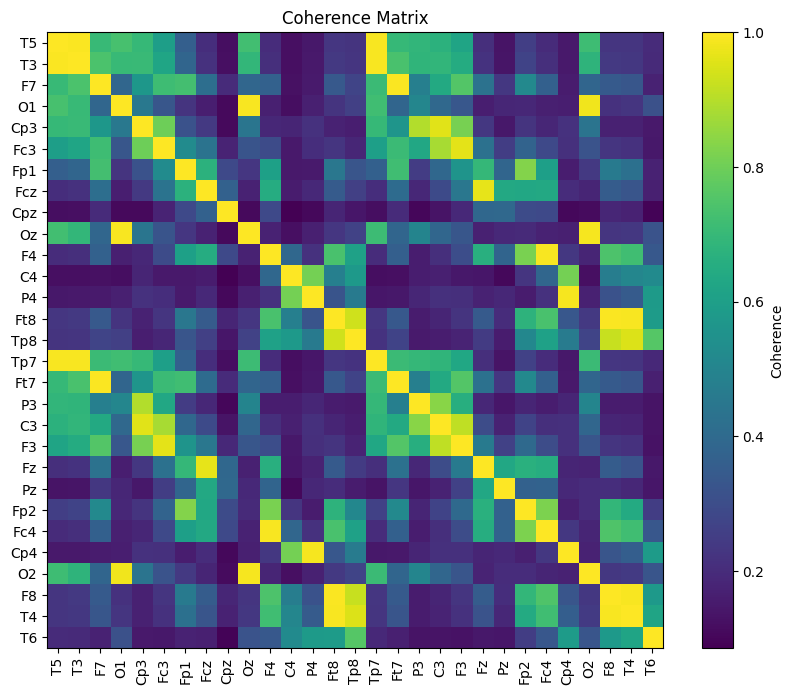

Subject rTMS-05_w0_20220629 Beta band coherence matrix:


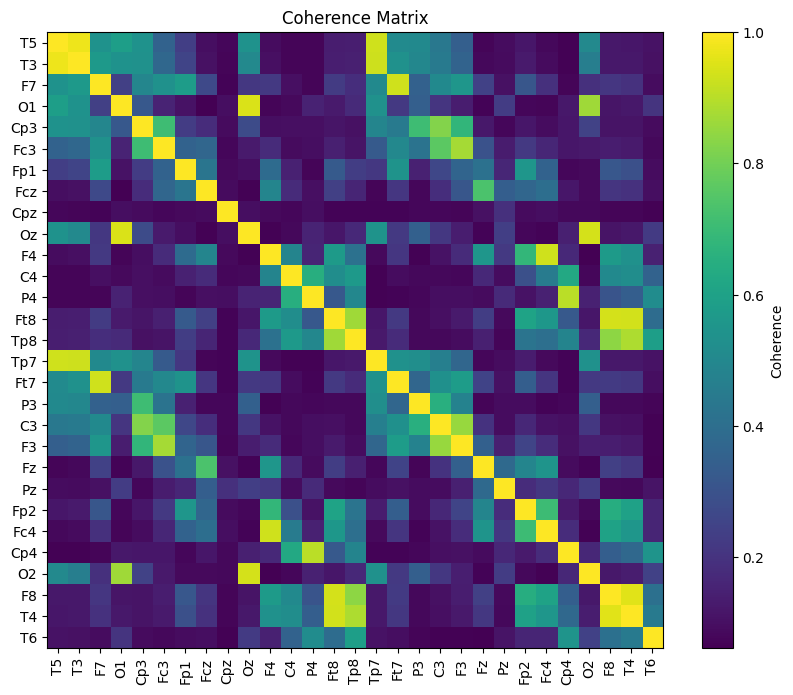

Subject rTMS-05_w0_20220629 Gamma band coherence matrix:


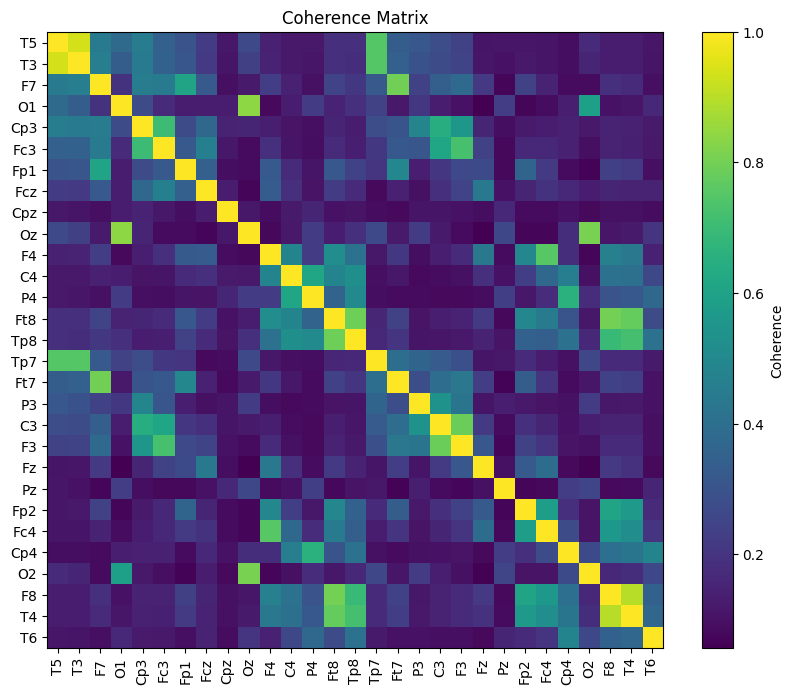

Subject rTMS-06_w0_20210317 Delta band coherence matrix:


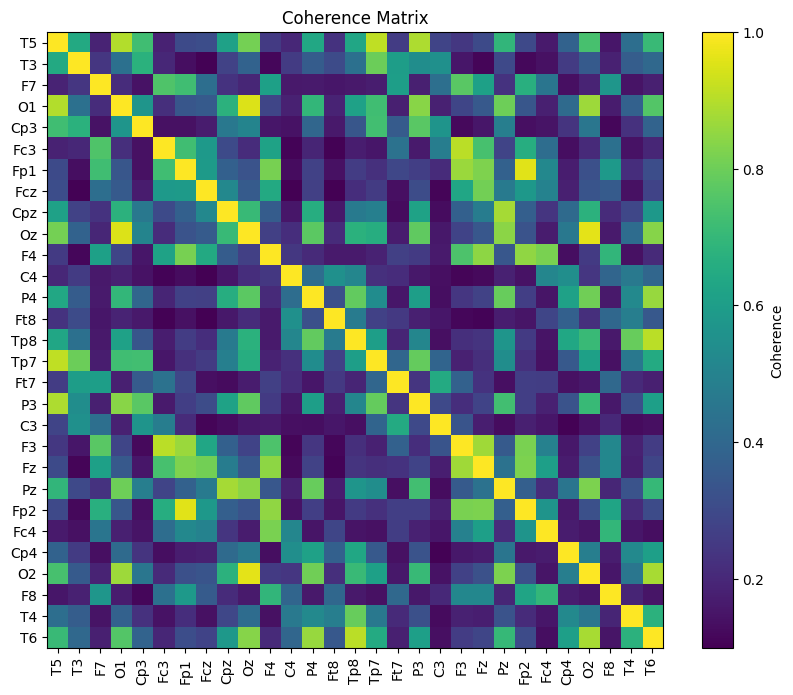

Subject rTMS-06_w0_20210317 Theta band coherence matrix:


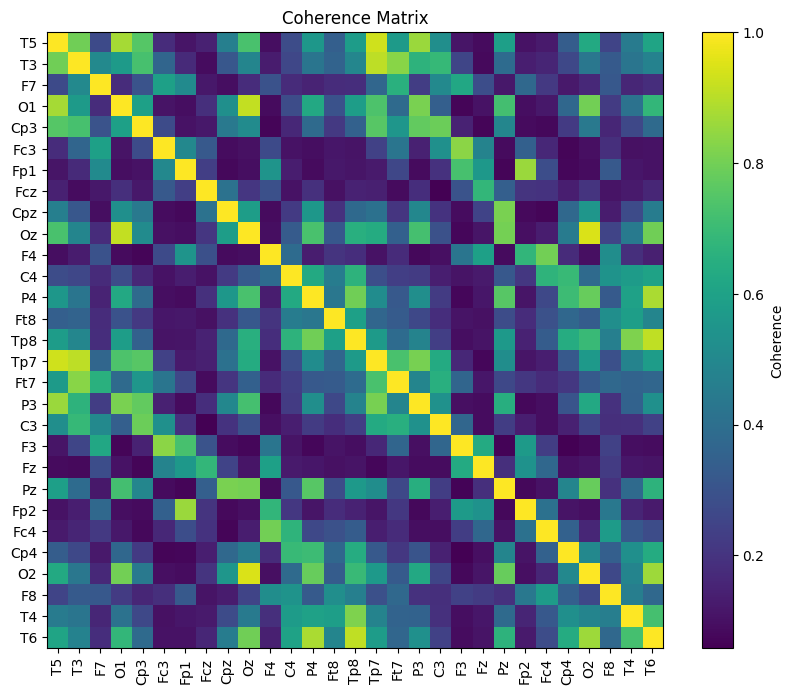

Subject rTMS-06_w0_20210317 Alpha band coherence matrix:


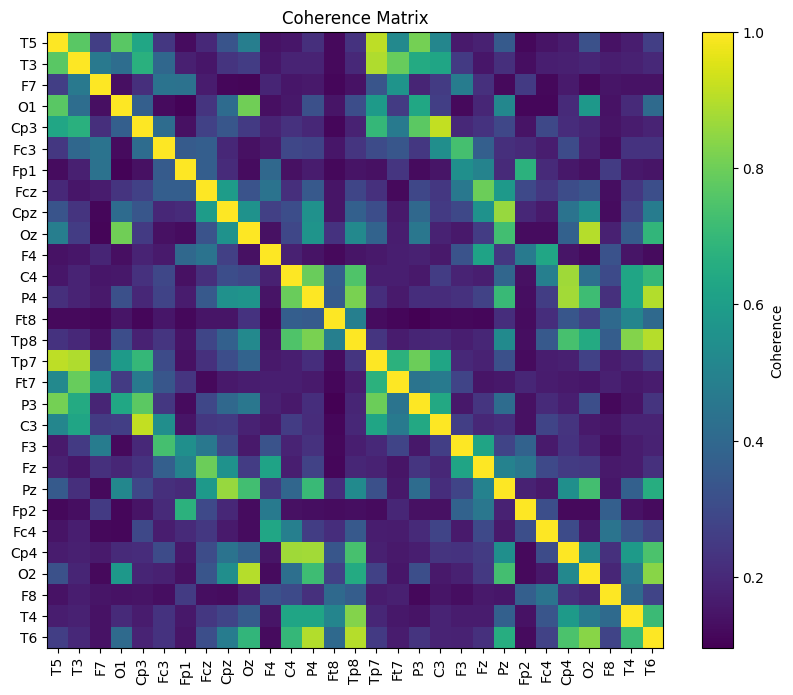

Subject rTMS-06_w0_20210317 Beta band coherence matrix:


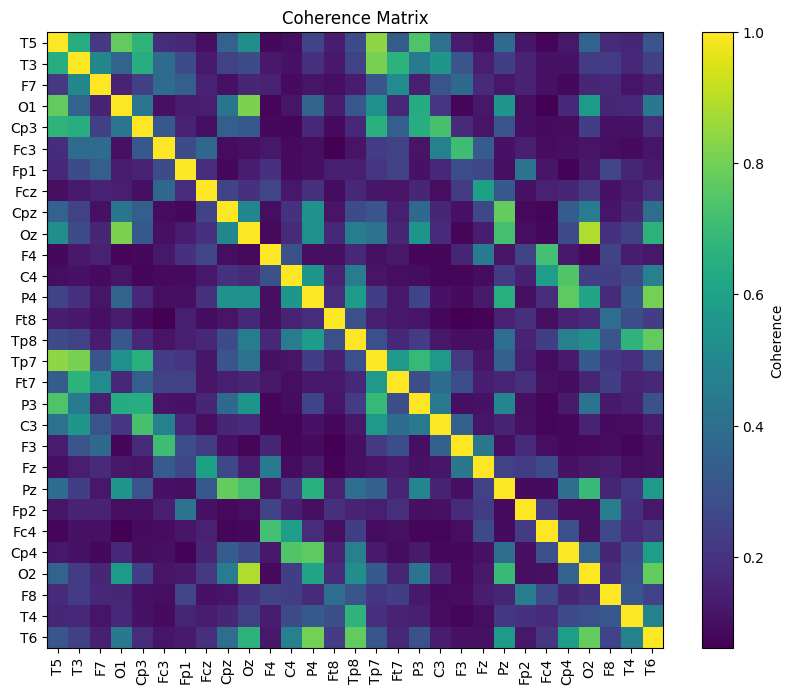

Subject rTMS-06_w0_20210317 Gamma band coherence matrix:


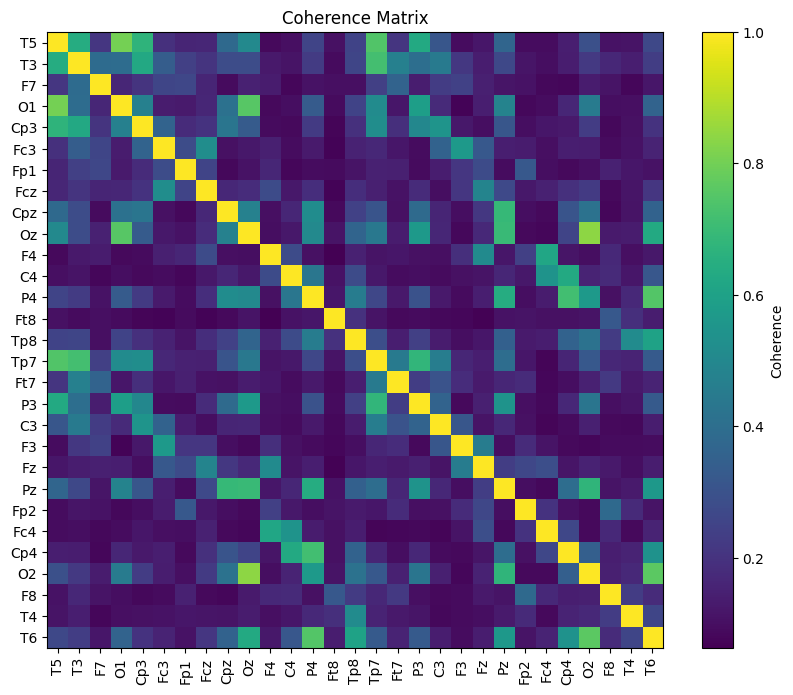

Subject rTMS-15_w0_20230629 Delta band coherence matrix:


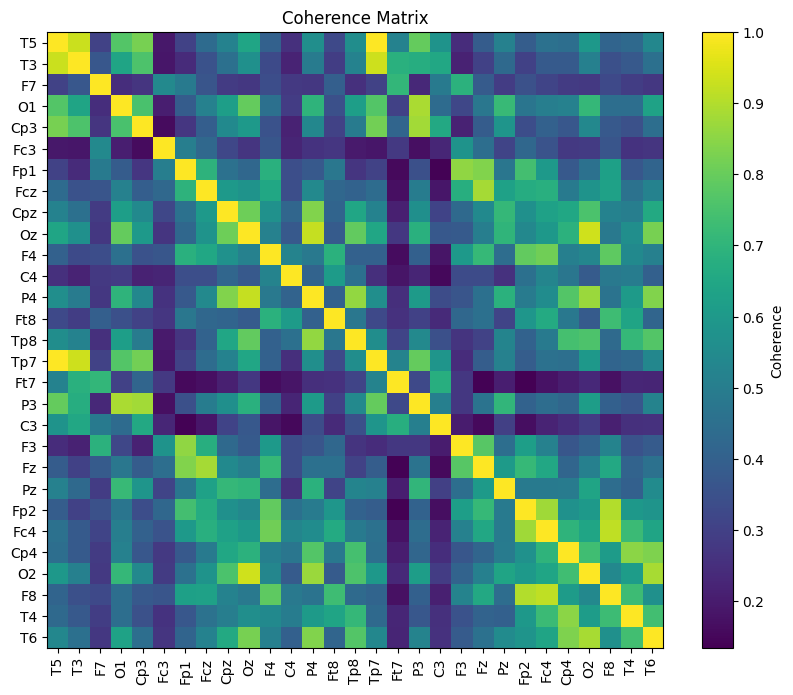

Subject rTMS-15_w0_20230629 Theta band coherence matrix:


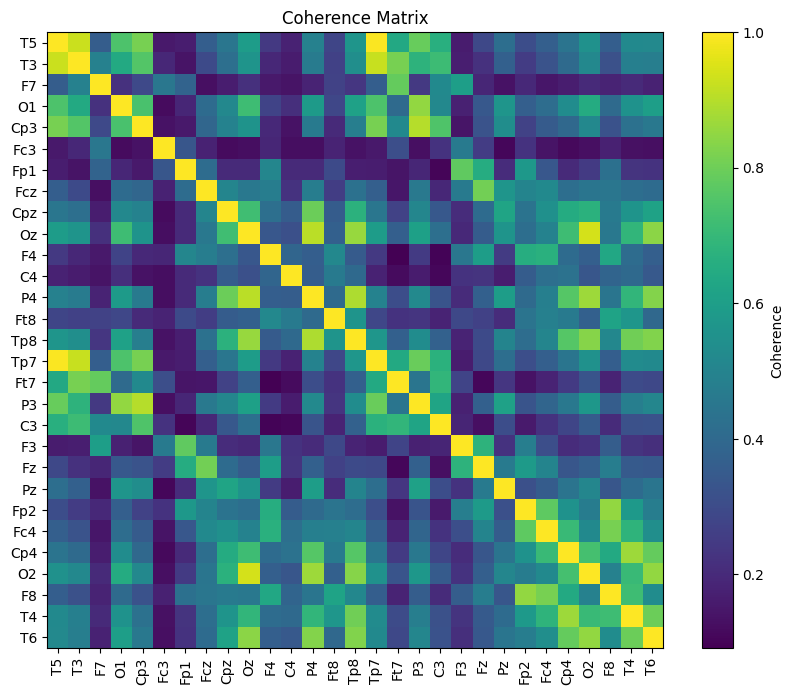

Subject rTMS-15_w0_20230629 Alpha band coherence matrix:


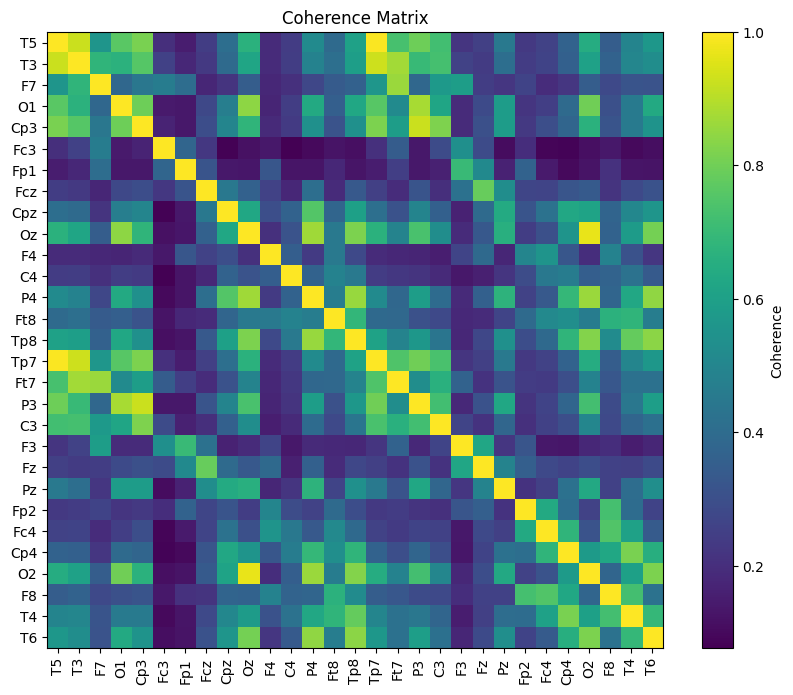

Subject rTMS-15_w0_20230629 Beta band coherence matrix:


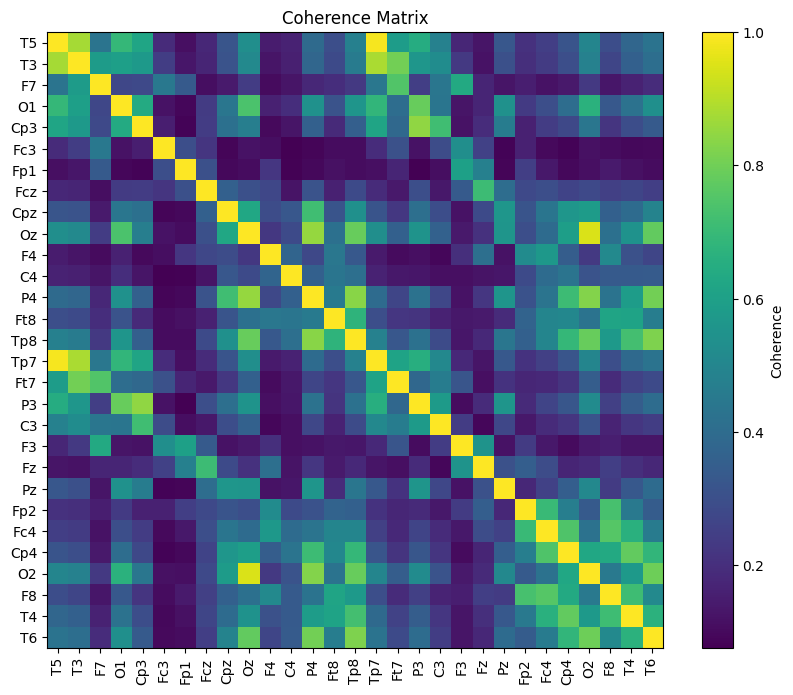

Subject rTMS-15_w0_20230629 Gamma band coherence matrix:


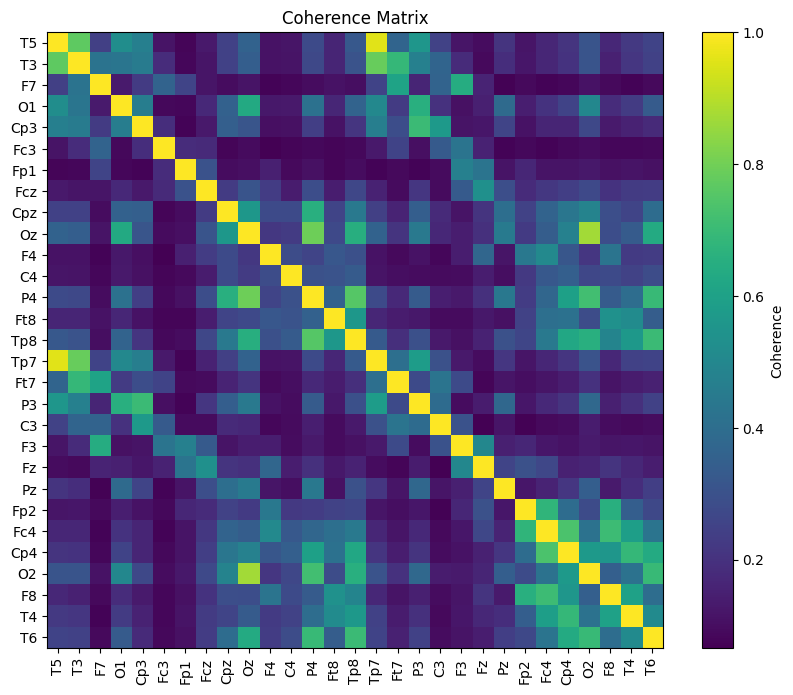

Subject rTMS-22_w0_20231213 Delta band coherence matrix:


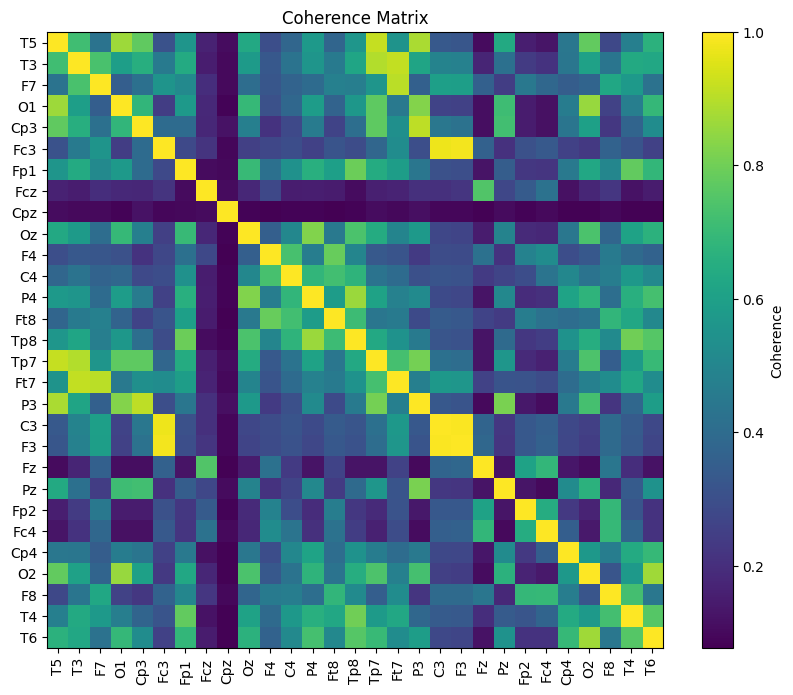

Subject rTMS-22_w0_20231213 Theta band coherence matrix:


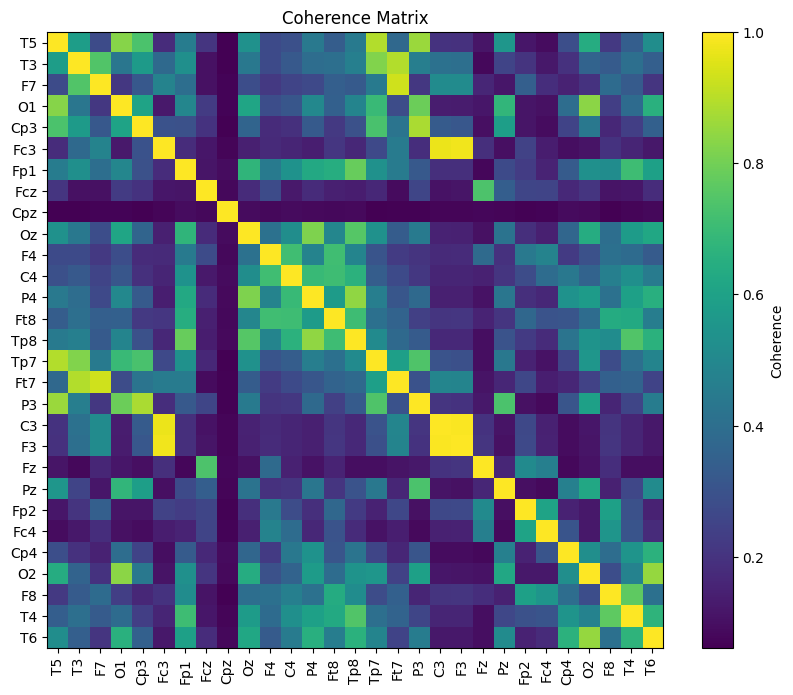

Subject rTMS-22_w0_20231213 Alpha band coherence matrix:


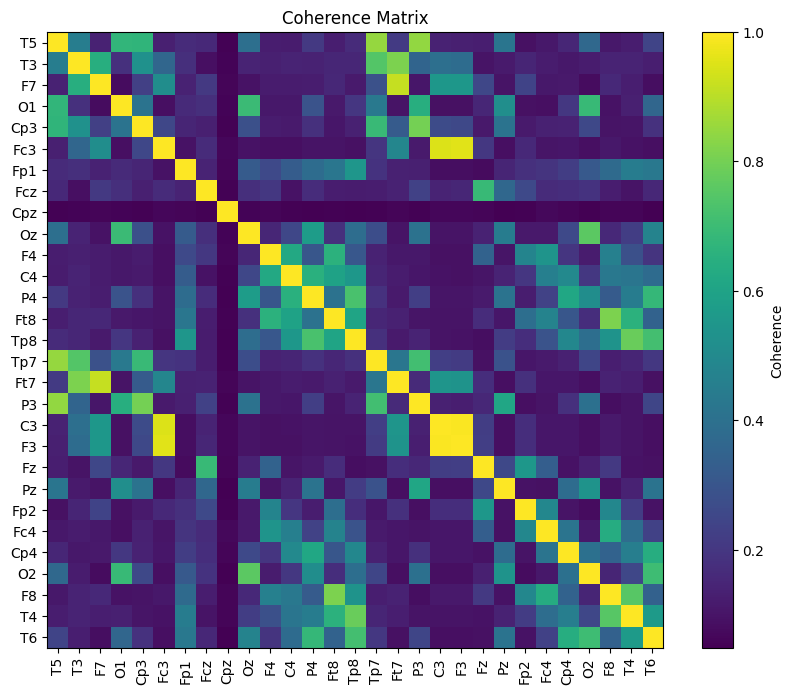

Subject rTMS-22_w0_20231213 Beta band coherence matrix:


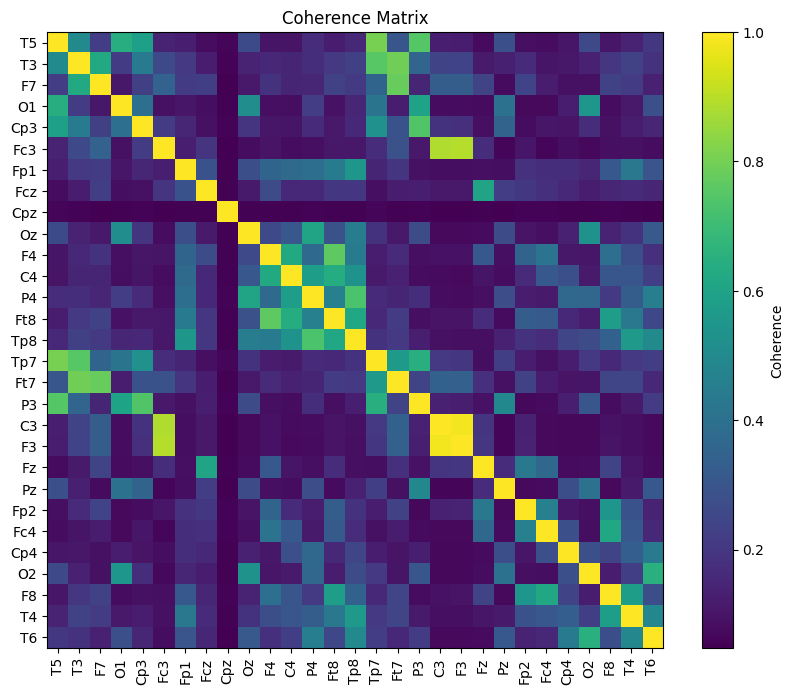

Subject rTMS-22_w0_20231213 Gamma band coherence matrix:


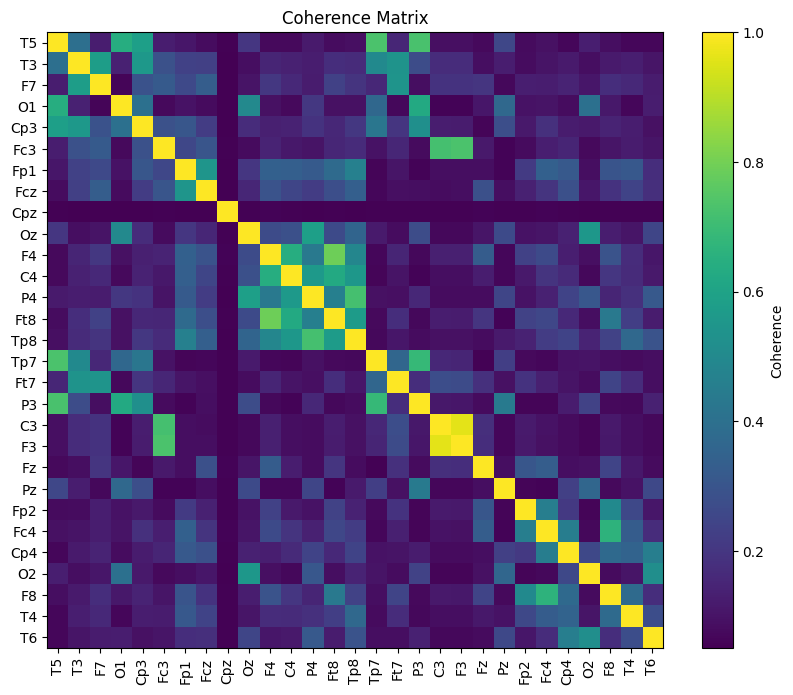

Subject rTMS-01_w2_20220613 Delta band coherence matrix:


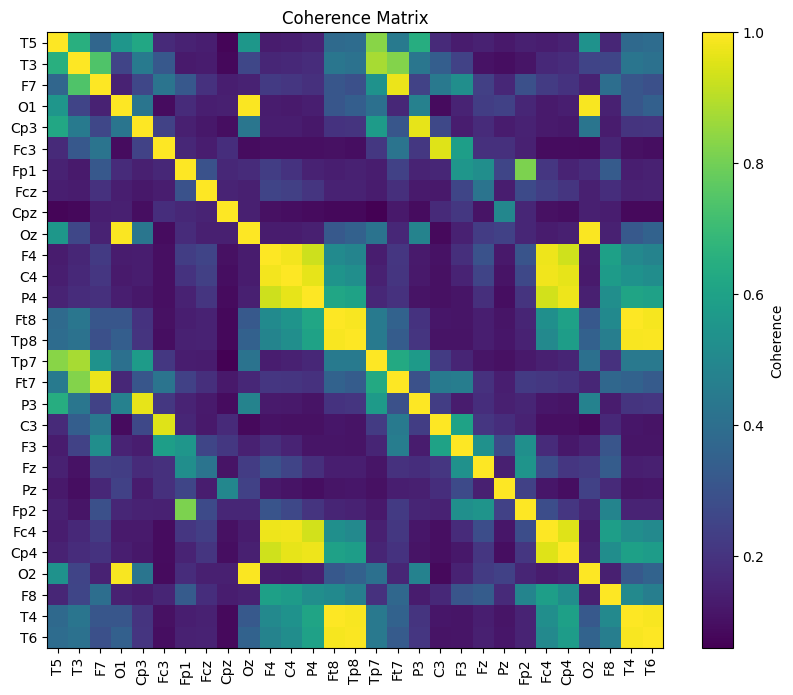

Subject rTMS-01_w2_20220613 Theta band coherence matrix:


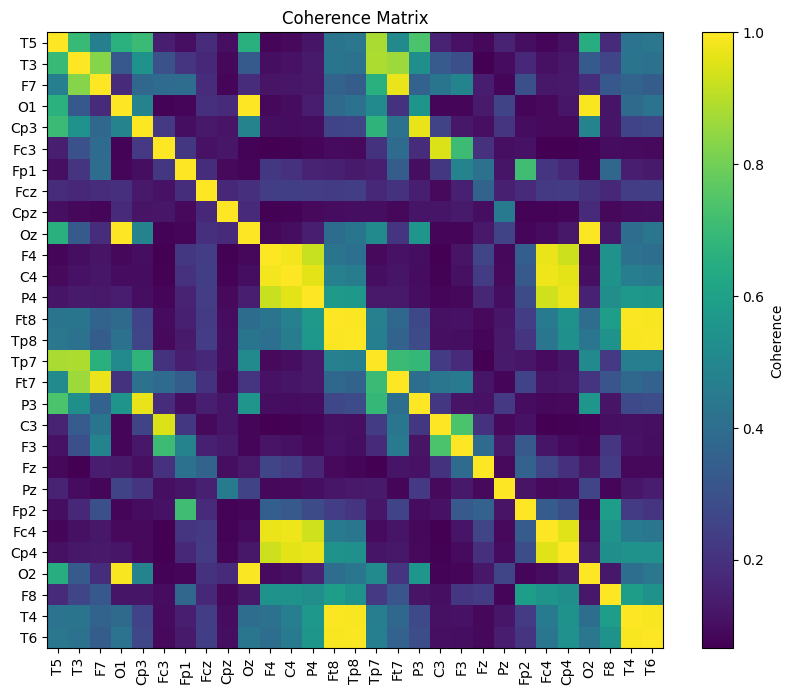

Subject rTMS-01_w2_20220613 Alpha band coherence matrix:


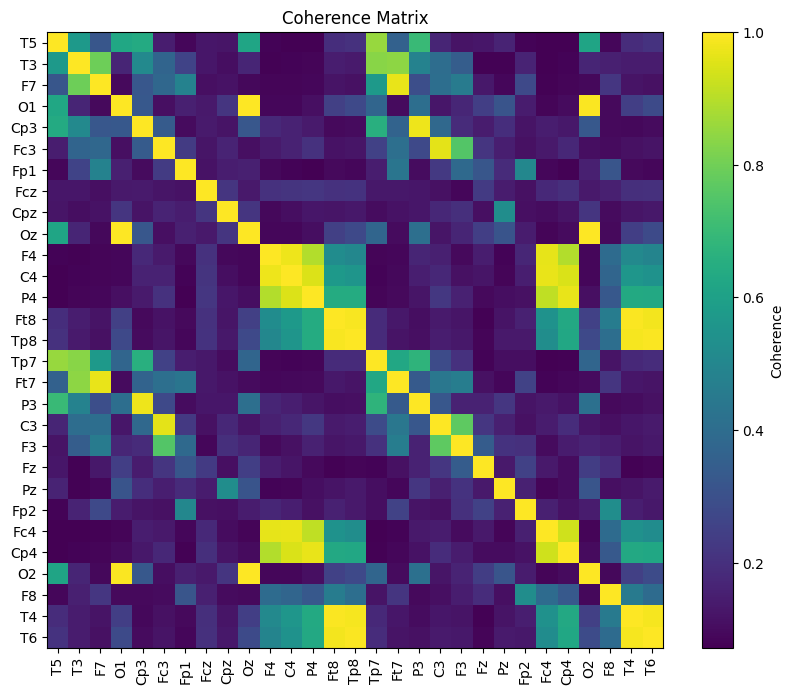

Subject rTMS-01_w2_20220613 Beta band coherence matrix:


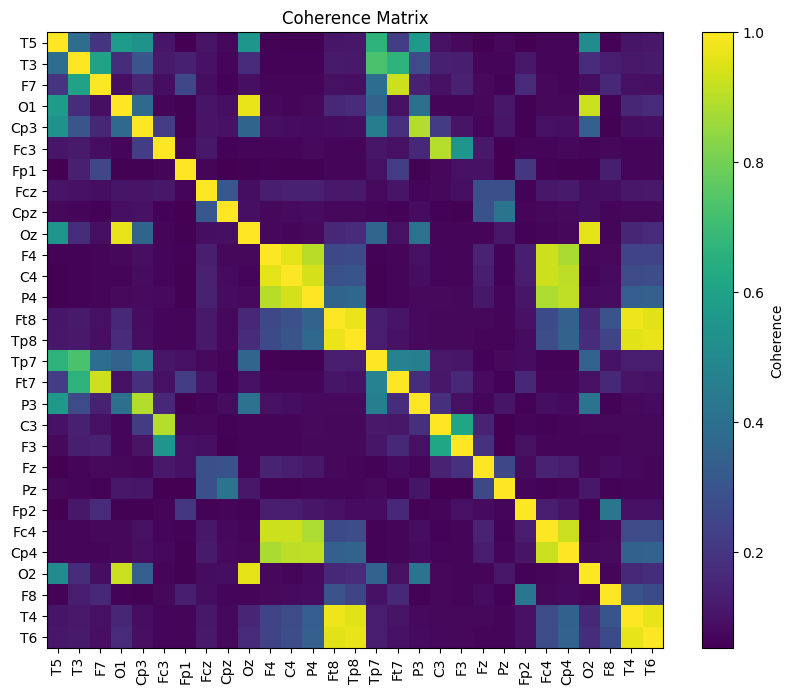

Subject rTMS-01_w2_20220613 Gamma band coherence matrix:


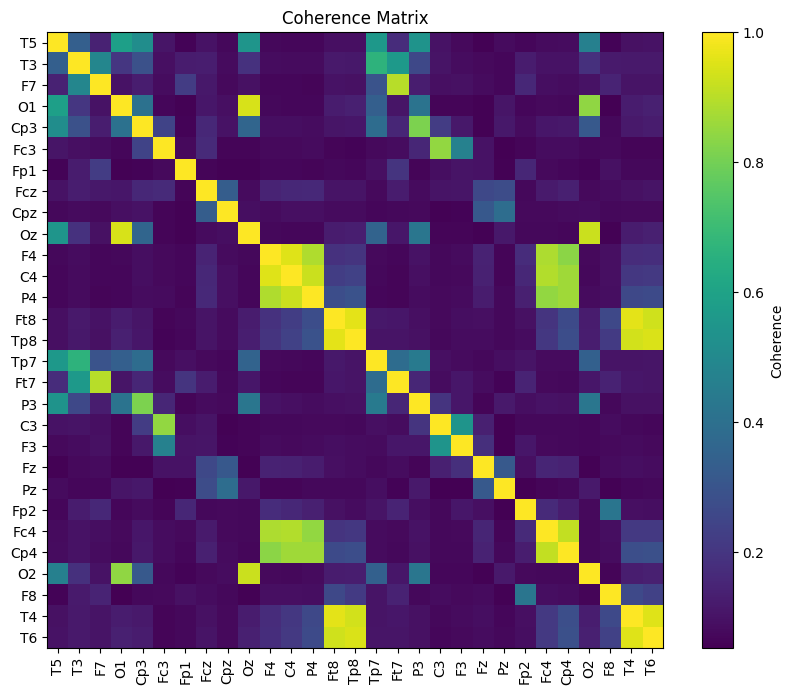

Subject rTMS-03_w2_20220808 Delta band coherence matrix:


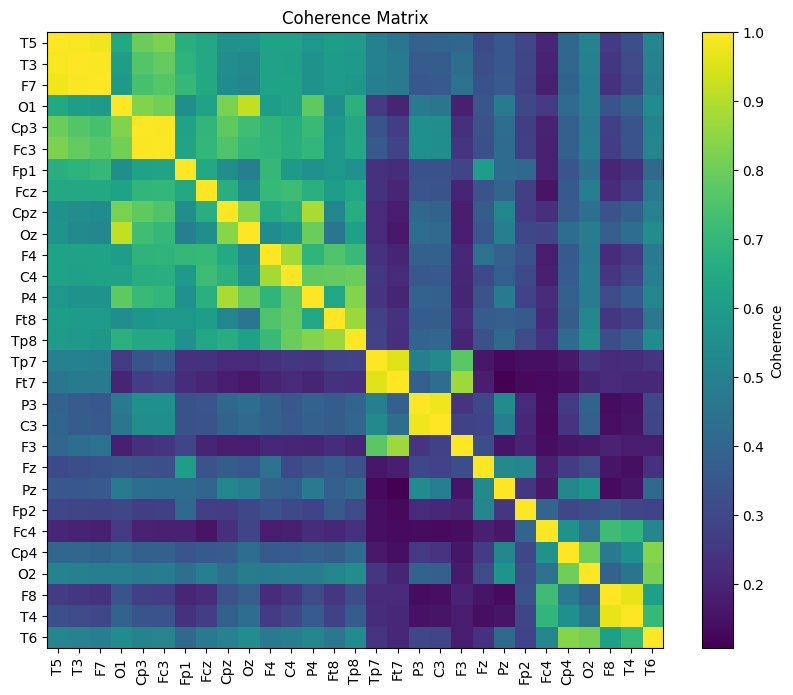

Subject rTMS-03_w2_20220808 Theta band coherence matrix:


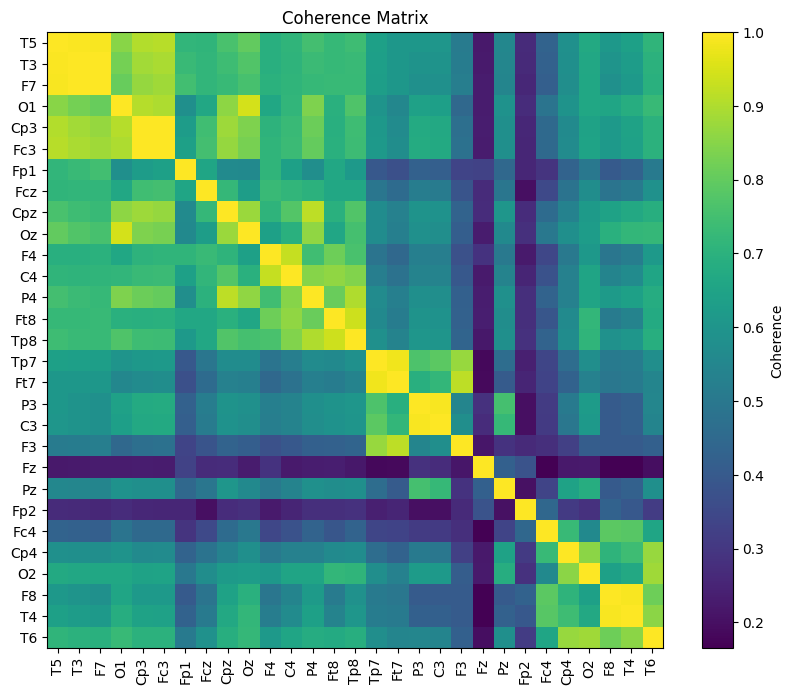

Subject rTMS-03_w2_20220808 Alpha band coherence matrix:


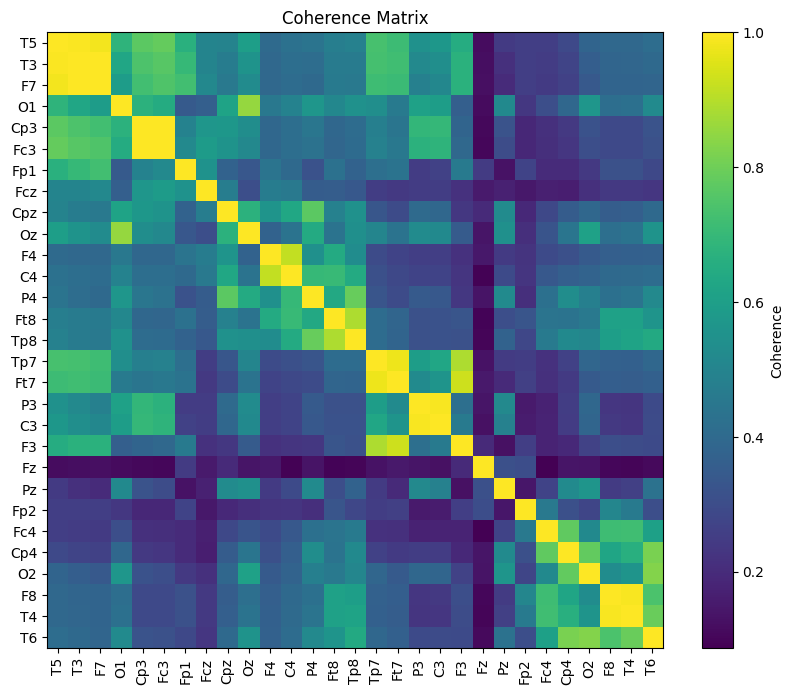

Subject rTMS-03_w2_20220808 Beta band coherence matrix:


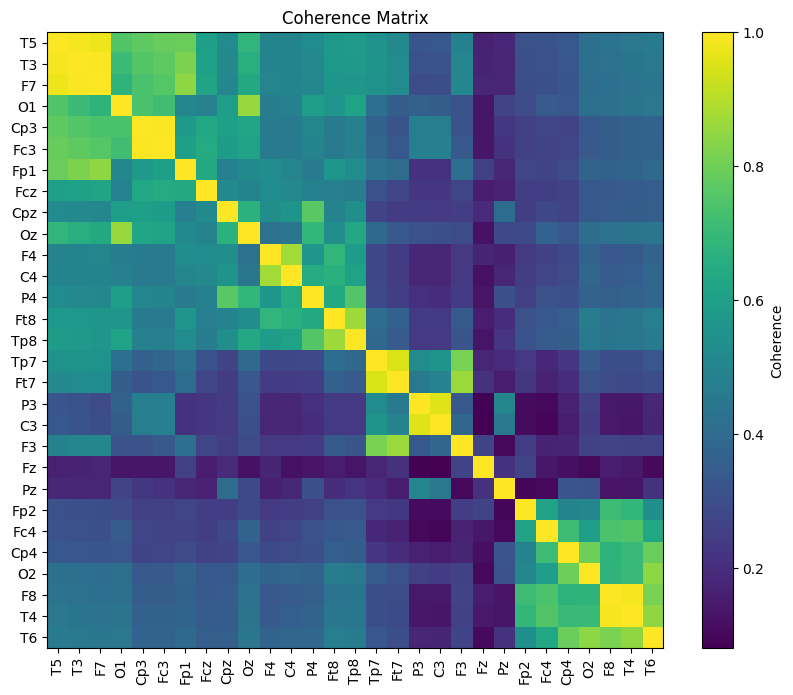

Subject rTMS-03_w2_20220808 Gamma band coherence matrix:


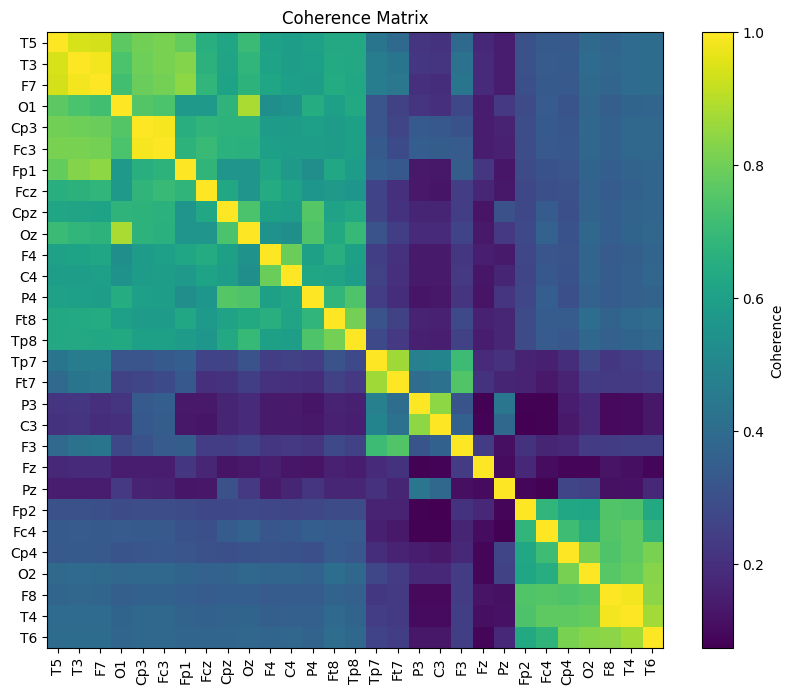

Subject rTMS-05_w2_20221005 Delta band coherence matrix:


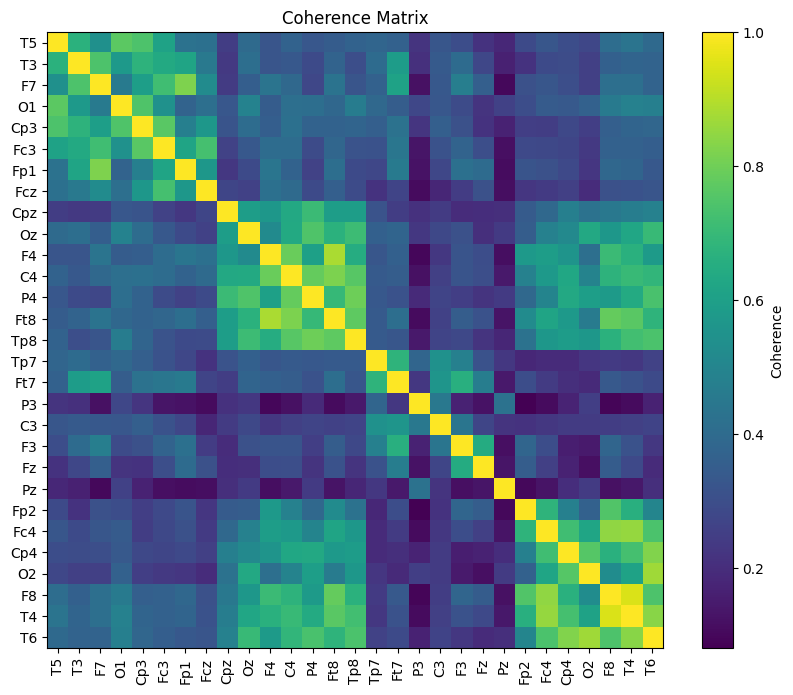

Subject rTMS-05_w2_20221005 Theta band coherence matrix:


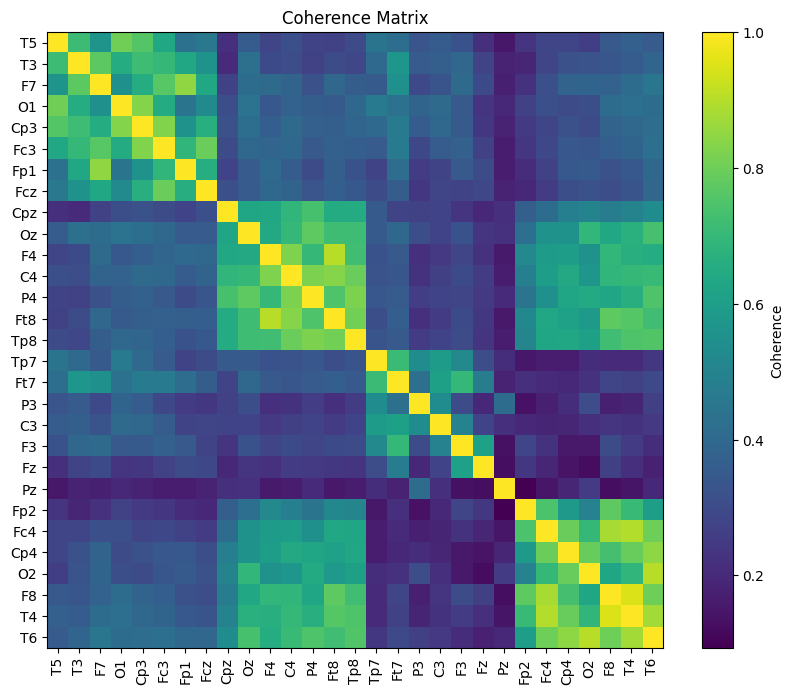

Subject rTMS-05_w2_20221005 Alpha band coherence matrix:


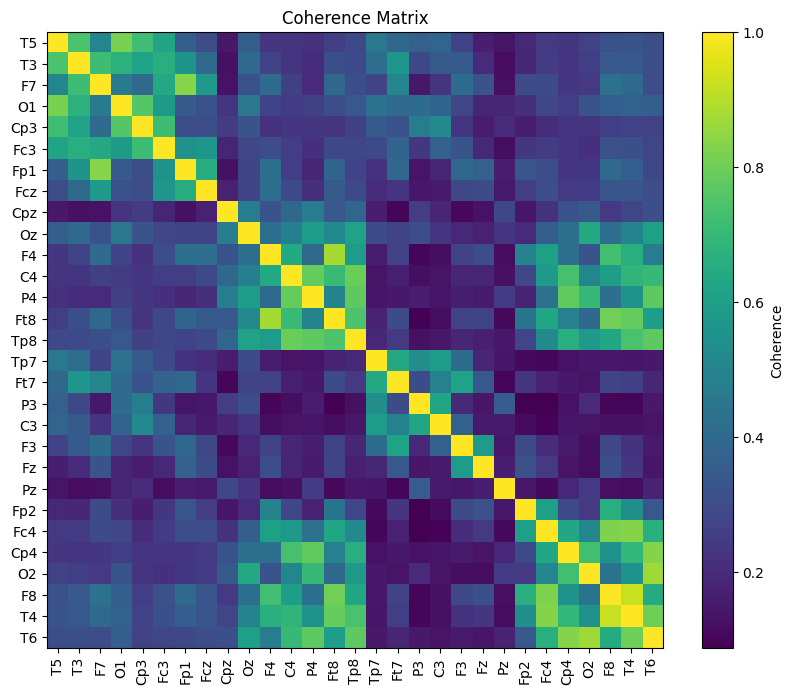

Subject rTMS-05_w2_20221005 Beta band coherence matrix:


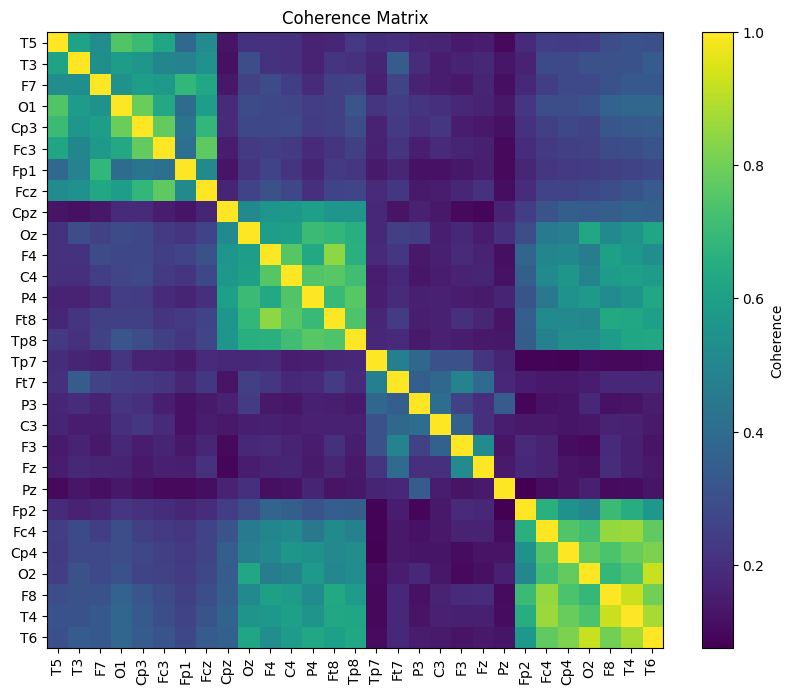

Subject rTMS-05_w2_20221005 Gamma band coherence matrix:


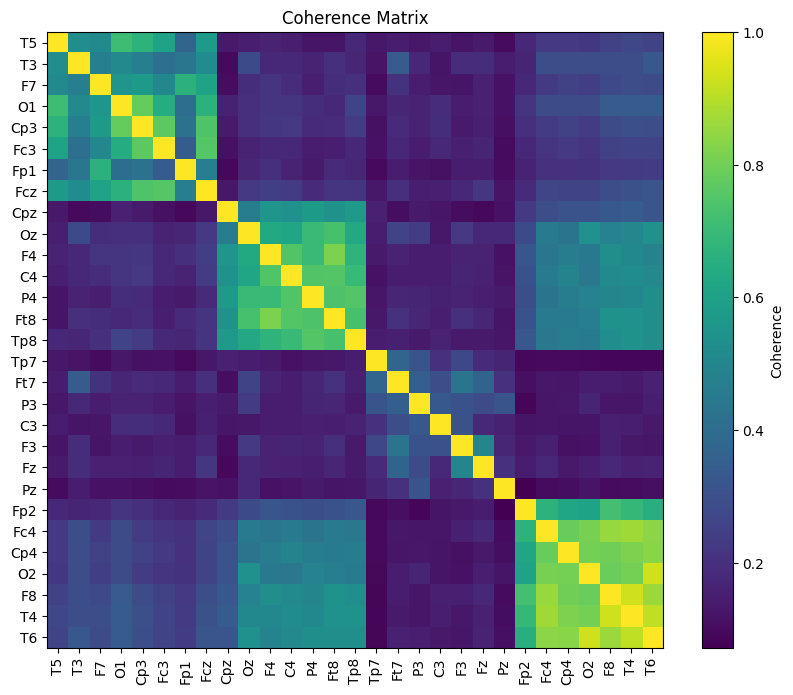

Subject rTMS-06_w2_20221006 Delta band coherence matrix:


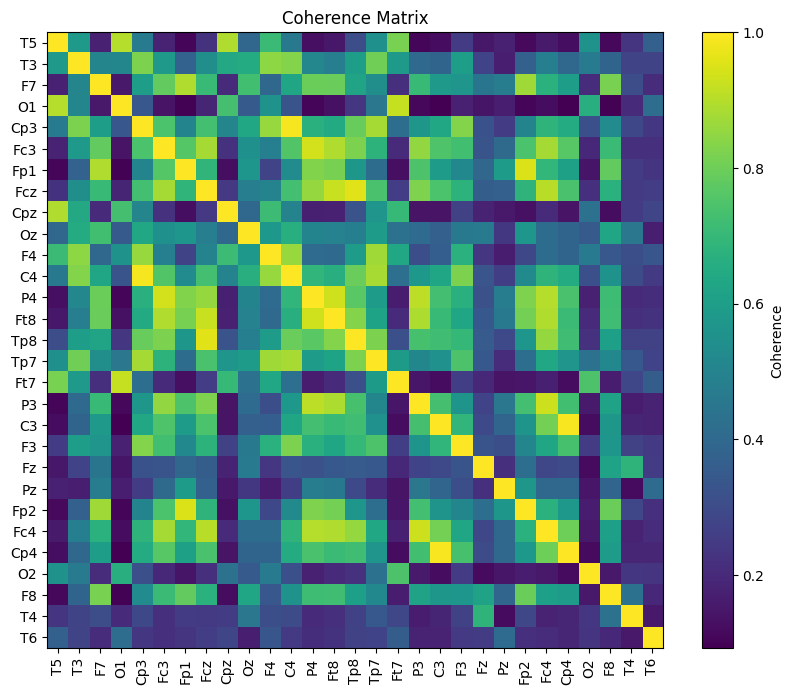

Subject rTMS-06_w2_20221006 Theta band coherence matrix:


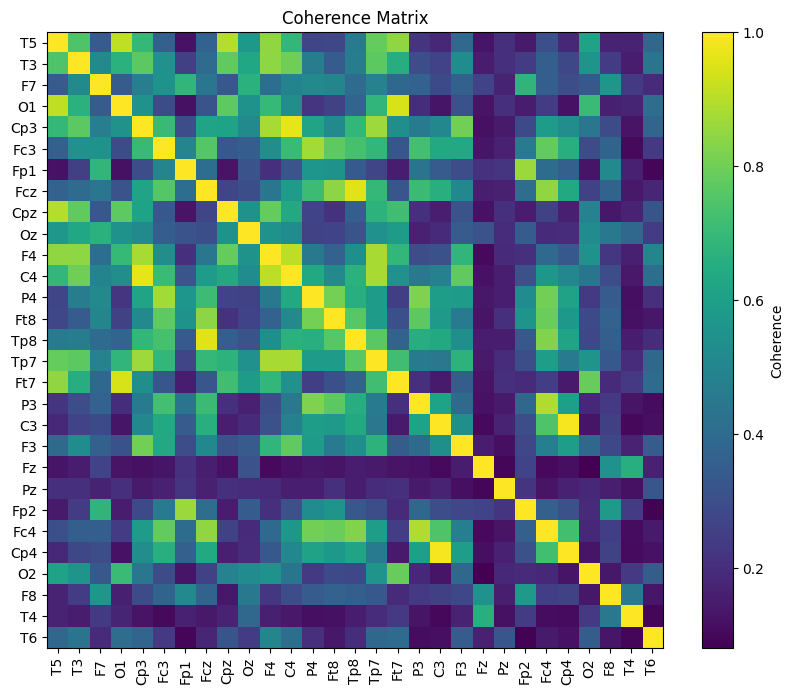

Subject rTMS-06_w2_20221006 Alpha band coherence matrix:


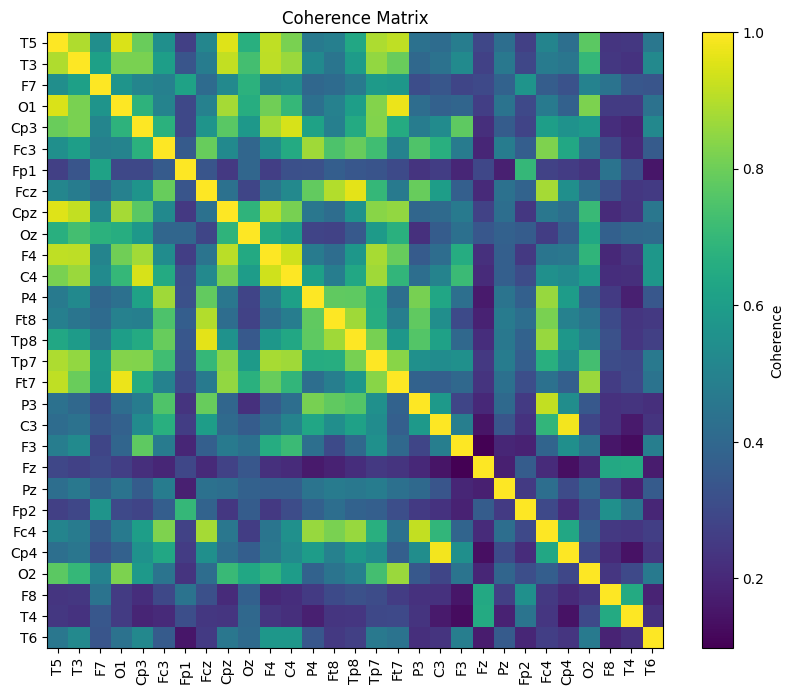

Subject rTMS-06_w2_20221006 Beta band coherence matrix:


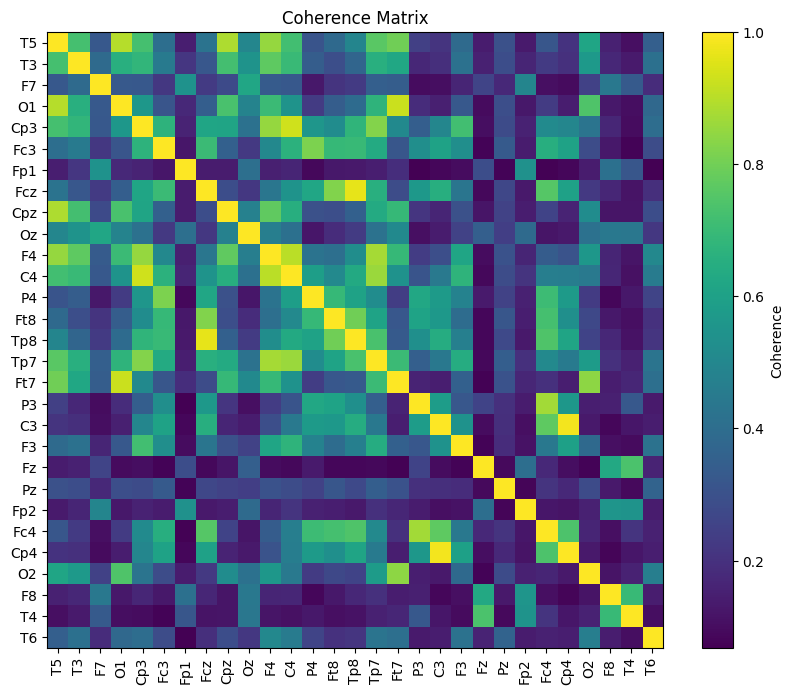

Subject rTMS-06_w2_20221006 Gamma band coherence matrix:


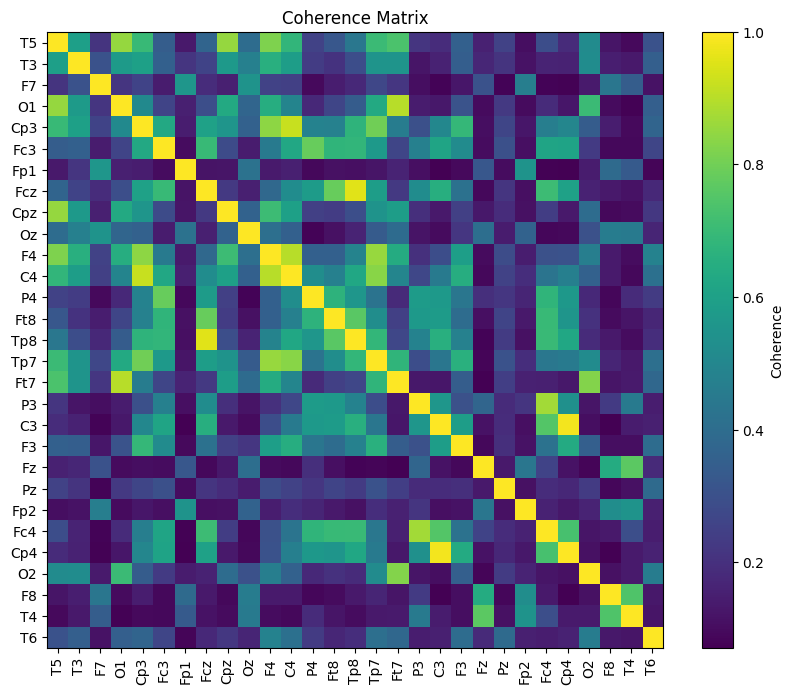

Subject rTMS-15_w2_20231002 Delta band coherence matrix:


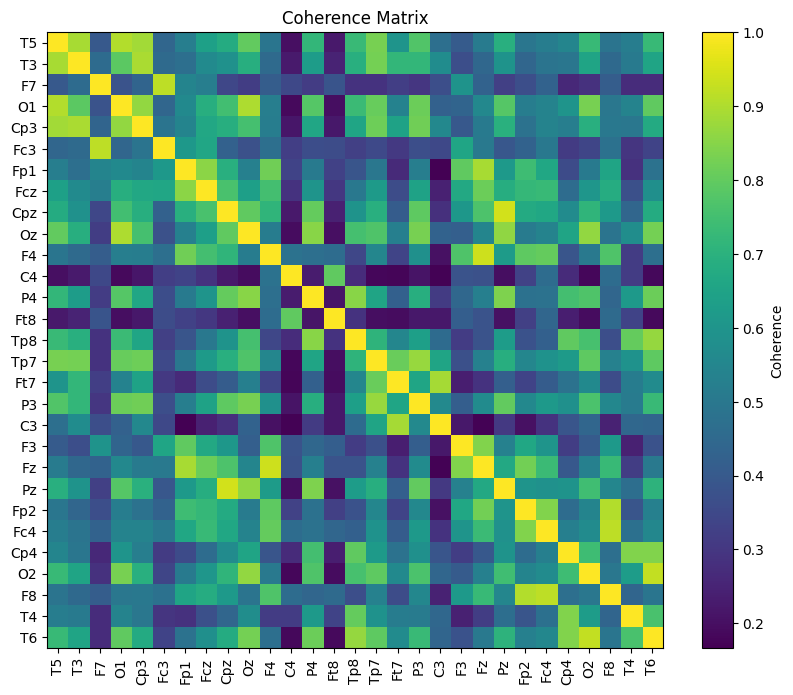

Subject rTMS-15_w2_20231002 Theta band coherence matrix:


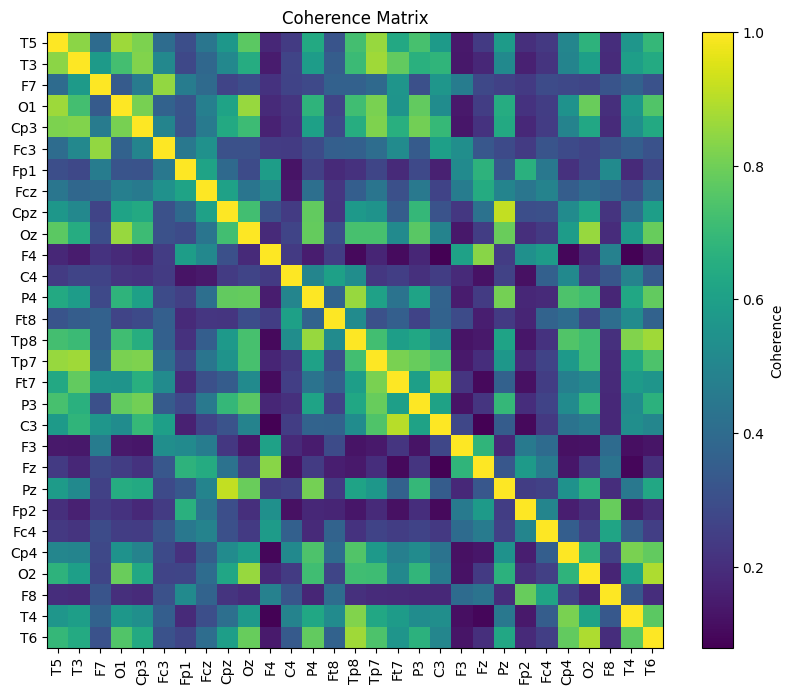

Subject rTMS-15_w2_20231002 Alpha band coherence matrix:


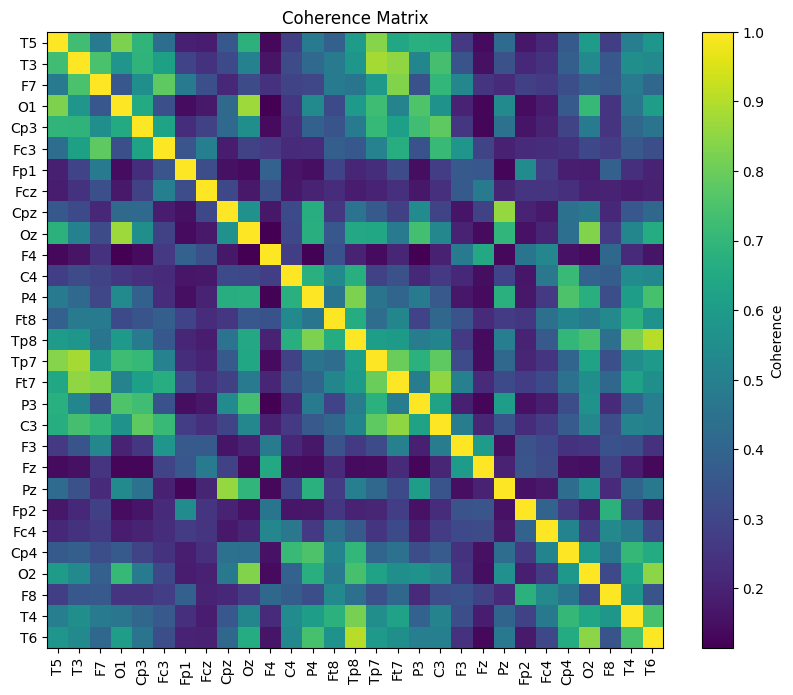

Subject rTMS-15_w2_20231002 Beta band coherence matrix:


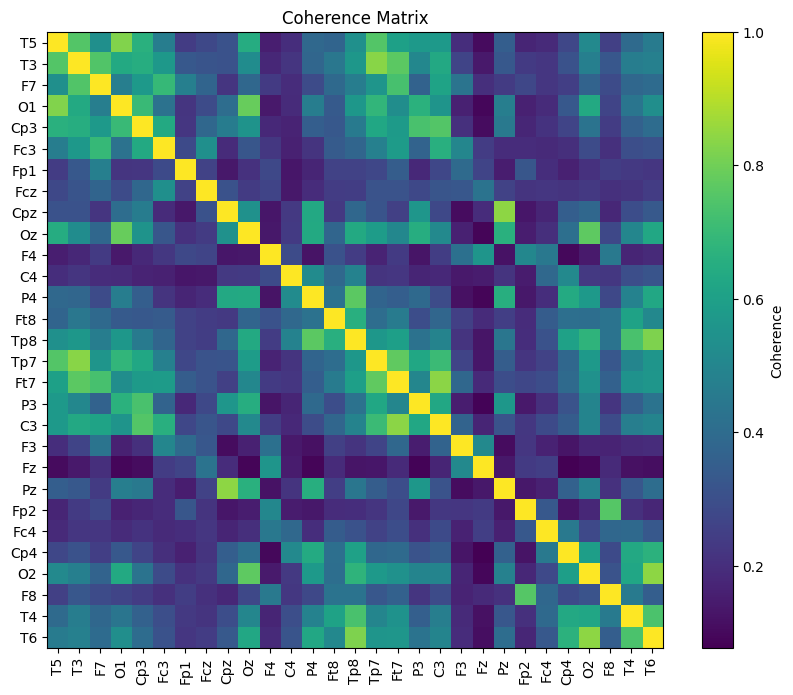

Subject rTMS-15_w2_20231002 Gamma band coherence matrix:


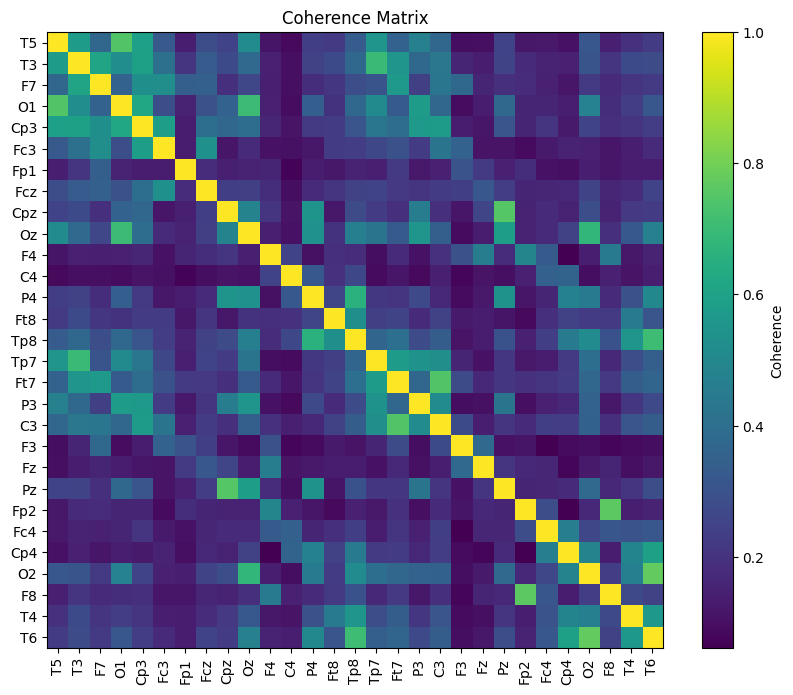

Subject rTMS-22_w2_20231128 Delta band coherence matrix:


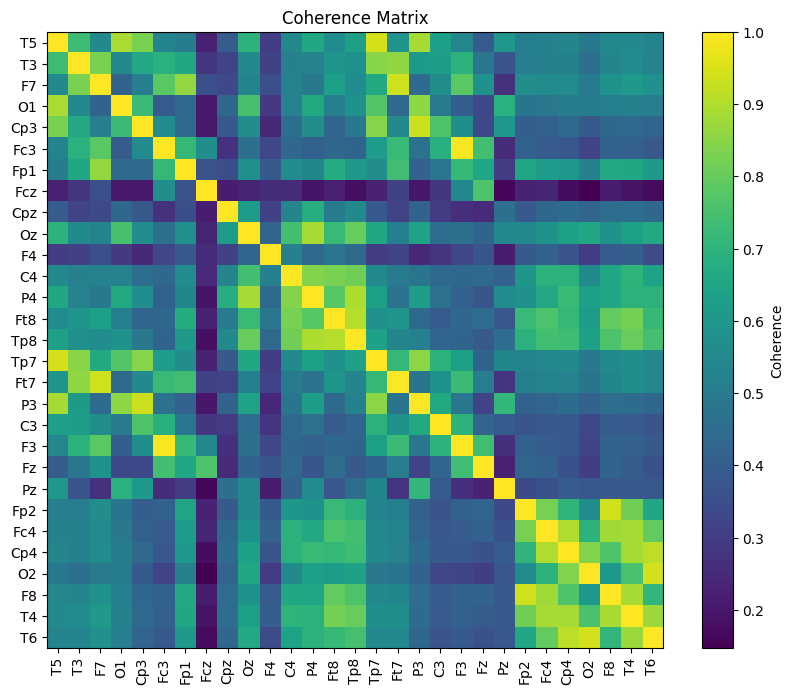

Subject rTMS-22_w2_20231128 Theta band coherence matrix:


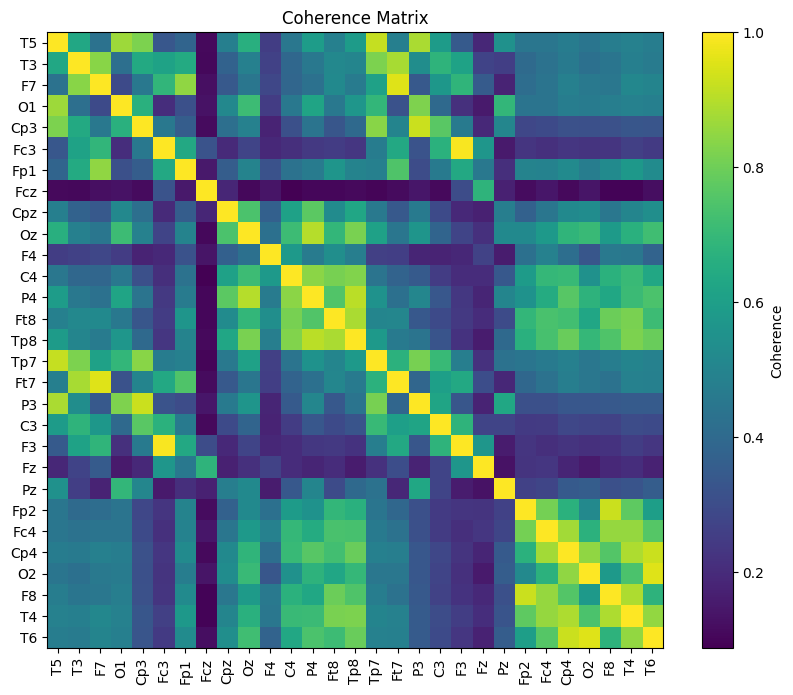

Subject rTMS-22_w2_20231128 Alpha band coherence matrix:


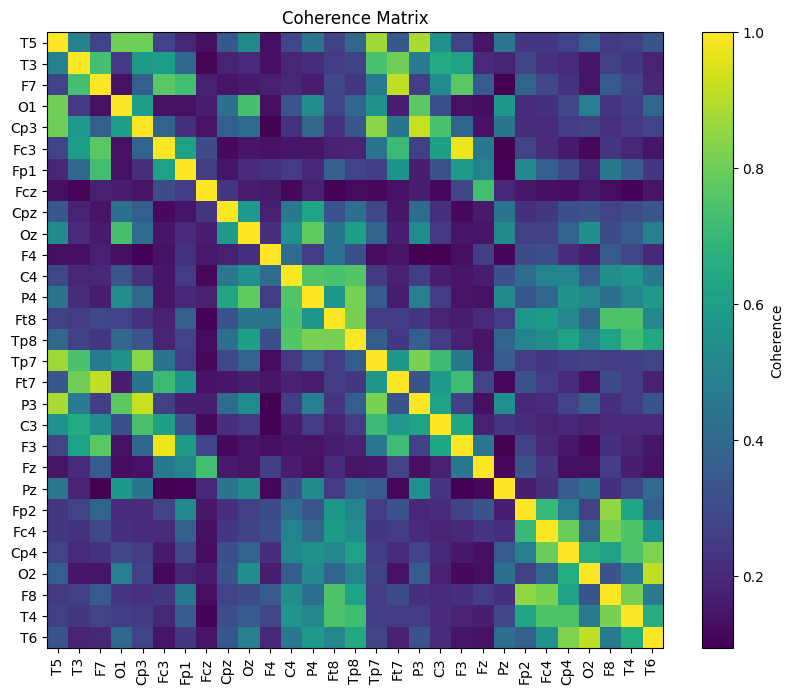

Subject rTMS-22_w2_20231128 Beta band coherence matrix:


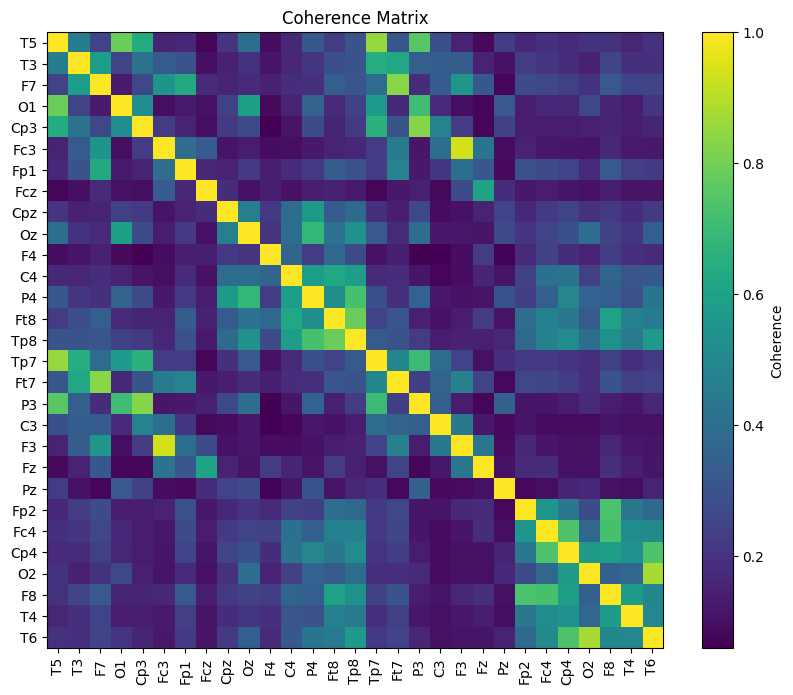

Subject rTMS-22_w2_20231128 Gamma band coherence matrix:


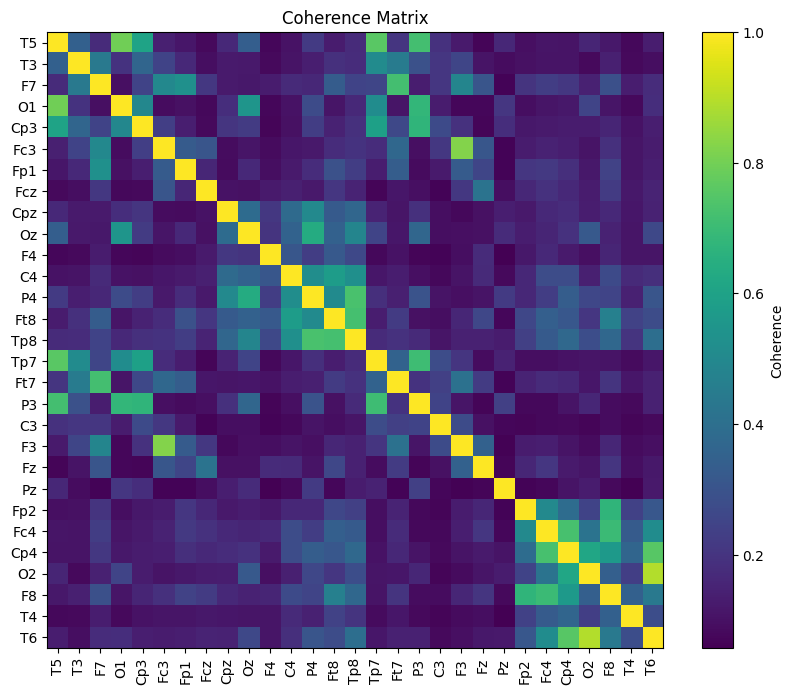

In [23]:
for subject, coh in coh_results.items():
    for band, coh_values in coh.items():
        print(f"Subject {subject} {band.capitalize()} band coherence matrix:")
        plot_coh_matrix(coh_values, ch_names)

### KFD

In [24]:
def KFD(data):
    kfd = []
    for channels in data:
        total_length, max_length, average_length = 0, 0, 0
        for i in range(len(channels) - 1):
            total_length += np.sqrt((channels[i+1] - channels[i]) ** 2 + ((i + 1) - i) ** 2)
        average_length = total_length / (len(channels) - 1)
        for i in range(len(channels)):
            if np.sqrt((channels[i] - channels[0]) ** 2 + i ** 2) >= max_length:
                max_length = np.sqrt((channels[i] - channels[0]) ** 2 + i ** 2)
        result = (np.log10(total_length / average_length)) / (np.log10(max_length / average_length))
        kfd.append(result)
    return kfd

### KFD without cutting epochs

In [166]:
kfd_result = {}
for subject, data in eye_open_data.items():
    kfd_result[subject] = KFD(data)

### KFD with epochs

In [25]:
kfd_result = {}
for subject, data in eye_open_data_segmented.items():
    kfd_values = []
    for segment in data:
        kfd_values.append(KFD(segment))
    kfd_result[subject] = np.mean(kfd_values, axis=0)

In [26]:
for subject, kfd in kfd_result.items():
    print(f"Subject {subject} has the following KFD values:")
    print(kfd)

Subject EEG23-002(W0) has the following KFD values:
[1.00000098 1.00000075 1.00000068 1.0000006  1.00000048 1.00000047
 1.0000006  1.00000041 1.00000043 1.00000059 1.00000075 1.00000056
 1.00000064 1.00000058 1.00000094 1.00000117 1.00000043 1.00000121
 1.00000009 1.00000014 1.00000021 1.00000014 1.00000066 1.00000062
 1.00000055 1.00000081 1.00000056 1.00000054 1.00000237]
Subject EEG23-003(W0) has the following KFD values:
[1.00000043 1.00000048 1.00000047 1.00000041 1.00000044 1.00000046
 1.00000059 1.00000041 1.0000001  1.00000032 1.00000024 1.00000019
 1.00000026 1.00000029 1.0000003  1.00000031 1.00000036 1.00000028
 1.00000024 1.00000025 1.00000041 1.00000019 1.00000038 1.00000018
 1.00000025 1.00000032 1.00000037 1.00000028 1.00000033]
Subject EEG23-004(W0) has the following KFD values:
[1.00000074 1.00000102 1.00000068 1.00000073 1.00000068 1.00000067
 1.00000241 1.00000056 1.00000033 1.00000054 1.00000044 1.00000047
 1.00000044 1.00000075 1.00000051 1.0000005  1.00000055 1.00

### FAA

In [29]:
def calculate_frontal_alpha_asymmetry(bp_result, subject_id, ch_names):
    f3_index = ch_names.index('F3') + 1
    f4_index = ch_names.index('F4') + 1

    f3_alpha = bp_result[subject_id][f3_index]['alpha']
    f4_alpha = bp_result[subject_id][f4_index]['alpha']

    faa = (f3_alpha - f4_alpha) / (f3_alpha + f4_alpha)
    return faa

w0_faa = [calculate_frontal_alpha_asymmetry(bp_result, subject_id, ch_names) for subject_id in BDW0_matches]
w12_faa = [calculate_frontal_alpha_asymmetry(bp_result, subject_id, ch_names) for subject_id in BDW12_matches]
w24_faa = [calculate_frontal_alpha_asymmetry(bp_result, subject_id, ch_names) for subject_id in BDW24_matches]

shapiro_stat_w0, p_val_w0 = shapiro(w0_faa)
shapiro_stat_w12, p_val_w12 = shapiro(w12_faa)
shapiro_stat_w24, p_val_w24 = shapiro(w24_faa)

w0_values = np.array(w0_faa)
w12_values = np.array(w12_faa)  
w24_values = np.array(w24_faa)

if p_val_w0 > 0.05 and p_val_w12 > 0.05 and p_val_w24 > 0.05:
    lev_stat, lev_p_val = levene(w0_faa, w12_faa, w24_faa)
    print('Normal distribution!!')
    
    if lev_p_val > 0.05:
        data = pd.DataFrame({
            'Subject': range(len(w0_values)),
            'W0': w0_values,
            'W12': w12_values,
            'W24': w24_values
        }).melt(id_vars=['Subject'], value_vars=['W0', 'W12', 'W24'], 
                var_name='Time', value_name='Value')
        
        anova = AnovaRM(data, 'Value', 'Subject', within=['Time'])
        res = anova.fit()
        p_val = res.anova_table['Pr > F'][0]
        print('Homogeneity!!')
        print('=======================================================')
    else:
        print('Heterogeneity!! Using Friedman test instead.')
        stat, p_val = friedmanchisquare(w0_values, w12_values, w24_values)
        print(f'Friedman test result: statistic={stat}, p-value={p_val}')
        print('=======================================================')
else:
    print('Non-normal distribution!!')
    stat, p_val = friedmanchisquare(w0_values, w12_values, w24_values)
    print(f'Friedman test result: statistic={stat}, p-value={p_val}')
    print('=======================================================')

print(f"Frontal Alpha Asymmetry p-value: {p_val}")

Non-normal distribution!!
Friedman test result: statistic=1.8571428571428612, p-value=0.39511776132688653
Frontal Alpha Asymmetry p-value: 0.39511776132688653
